# Fitting Data to SDE Practice

In [44]:
pwd()

"/home/kkganko/6.337/18.337-Project-SP2023/Stochastic Diffeqs"

In [45]:
dir_contents = readdir(".")

8-element Vector{String}:
 ".ipynb_checkpoints"
 "Fitting Data to SDE Practice.ipynb"
 "Manifest.toml"
 "NN_sde_combined.png"
 "Neural ODE Practice.ipynb"
 "Neural SDE Practice.ipynb"
 "Project.toml"
 "Stochastic Diffeq Practice.ipynb"

In [48]:
# If Project.toml and Manifest.toml exist, remove them to start a completely fresh installation of packages and dependencies.
# This is equivalent to uninstalling all packages in the current environment. 
# Why? B/c if you don't start from a clean plate, and you have previous package dependency installation that were unspecified 
# below in their version number, then dependencies may conflict.

# get contents of working directory
dir_contents = readdir(".")
println(dir_contents)
if "Manifest.toml" in dir_contents
    rm("Manifest.toml")
    println("Removed Manifest.toml from $(pwd()).")
end
if "Project.toml" in dir_contents
    rm("Project.toml")
    println("Removed Project.toml from $(pwd()).")
end

# Check file contents in project directory, copy over Project.toml and Manifest.toml if they exist.
# If they don't exist, create them with generate-project-toml.ipynb.
parentdir_contents = readdir("..")
parentdir_info = stat("..")
# copy contents from parent to working directory 
if "Manifest.toml" in parentdir_contents
    cp("../Manifest.toml", joinpath(pwd(),"Manifest.toml"))
    println("Manifest.toml copy from project dir to $(pwd()) successful.")
else
    println("No Manifest.toml in parent directory.")
end
if "Project.toml" in parentdir_contents
    cp("../Project.toml", joinpath(pwd(),"Project.toml"))
    println("Project.toml copy from project dir to $(pwd()) successful.")
else
    println("No Project.toml in parent directory.")
end

Removed Manifest.toml from /home/kkganko/6.337/18.337-Project-SP2023/Stochastic Diffeqs.
Removed Project.toml from /home/kkganko/6.337/18.337-Project-SP2023/Stochastic Diffeqs.


In [50]:
import Pkg; Pkg.activate("."); Pkg.instantiate(verbose=true)

  Activating project at `~/6.337/18.337-Project-SP2023/Stochastic Diffeqs`


In [51]:
Pkg.status()

      Status `~/6.337/18.337-Project-SP2023/Stochastic Diffeqs/Project.toml`
  [6e4b80f9] BenchmarkTools v1.3.2
  [8f4d0f93] Conda v1.8.0
  [aae7a2af] DiffEqFlux v1.53.0
  [0c46a032] DifferentialEquations v7.6.0
  [31c24e10] Distributions v0.25.81
  [587475ba] Flux v0.13.14
  [f6369f11] ForwardDiff v0.10.34
  [7073ff75] IJulia v1.24.0
  [4138dd39] JLD v0.13.3
  [b964fa9f] LaTeXStrings v1.3.0
  [429524aa] Optim v1.7.4
  [7f7a1694] Optimization v3.12.1
  [253f991c] OptimizationFlux v0.1.2
  [91a5bcdd] Plots v1.38.8
  [438e738f] PyCall v1.95.1
  [d330b81b] PyPlot v2.11.1
  [1ed8b502] SciMLSensitivity v7.13.0
  [e88e6eb3] Zygote v0.6.55


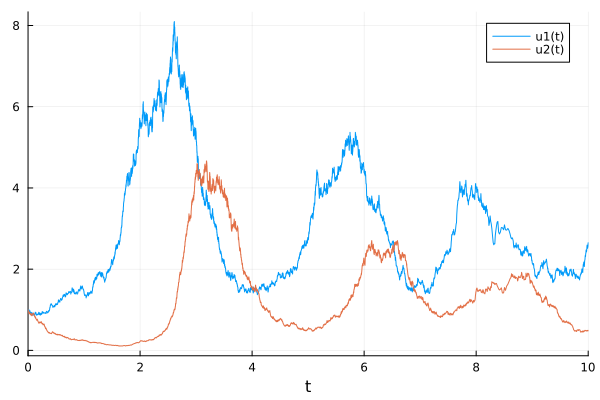

In [52]:
using DifferentialEquations, SciMLSensitivity, Plots

function lotka_volterra!(du, u, p, t)
    x, y = u
    α, β, γ, δ = p
    du[1] = dx = α * x - β * x * y
    du[2] = dy = δ * x * y - γ * y
end
u0 = [1.0, 1.0]
tspan = (0.0, 10.0)

function multiplicative_noise!(du, u, p, t)
    x, y = u
    du[1] = p[5] * x
    du[2] = p[6] * y
end
p = [1.5, 1.0, 3.0, 1.0, 0.3, 0.3]

prob = SDEProblem(lotka_volterra!, multiplicative_noise!, u0, tspan, p)
sol = solve(prob)
plot(sol)

In [53]:
using Statistics
ensembleprob = EnsembleProblem(prob)
@time sol = solve(ensembleprob, SOSRI(), saveat = 0.1, trajectories = 10_000)
truemean = mean(sol, dims = 3)[:, :]
truevar = var(sol, dims = 3)[:, :]

 17.084425 seconds (4.92 M allocations: 326.986 MiB, 1.23% gc time, 10.80% compilation time)


2×101 Matrix{Float64}:
 0.0  0.0101374   0.0236231   …  9.5015   9.71315  9.81474  9.88788
 0.0  0.00593122  0.00826096     4.96444  5.03409  5.07888  5.26962

In [54]:
function loss(p)
    tmp_prob = remake(prob, p = p)
    ensembleprob = EnsembleProblem(tmp_prob)
    tmp_sol = solve(ensembleprob, SOSRI(), saveat = 0.1, trajectories = 1000)
    arrsol = Array(tmp_sol)
    sum(abs2, truemean - mean(arrsol, dims = 3)) +
    0.1sum(abs2, truevar - var(arrsol, dims = 3)), arrsol
end

function cb2(p, l, arrsol)
    @show p, l
    means = mean(arrsol, dims = 3)[:, :]
    vars = var(arrsol, dims = 3)[:, :]
    p1 = plot(sol[1].t, means', lw = 5)
    scatter!(p1, sol[1].t, truemean')
    p2 = plot(sol[1].t, vars', lw = 5)
    scatter!(p2, sol[1].t, truevar')
    p = plot(p1, p2, layout = (2, 1))
    display(p)
    false
end

cb2 (generic function with 1 method)

[ Info: Precompiling OptimizationFlux [253f991c-a7b2-45f8-8852-8b9a9df78a86]
┌ Warning: Module Zygote with build ID 365159335054801 is missing from the cache.
│ This may mean Zygote [e88e6eb3-aa80-5325-afca-941959d7151f] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:1107
┌ Warning: Module Zygote with build ID 365159335054801 is missing from the cache.
│ This may mean Zygote [e88e6eb3-aa80-5325-afca-941959d7151f] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:1107
[ Info: Skipping precompilation since __precompile__(false). Importing OptimizationFlux [253f991c-a7b2-45f8-8852-8b9a9df78a86].
[ Info: Precompiling Flux [587475ba-b771-5e3f-ad9e-33799f191a9c]
┌ Warning: Module Zygote with build ID 365159335054801 is missing from the cache.
│ This may mean Zygote [e88e6eb3-aa80-5325-afca-941959d7151f] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:1107
[ Info: Sk

(p, l) = ([1.5, 1.0, 3.0, 1.0, 0.3, 0.3], 2.672157853317862)


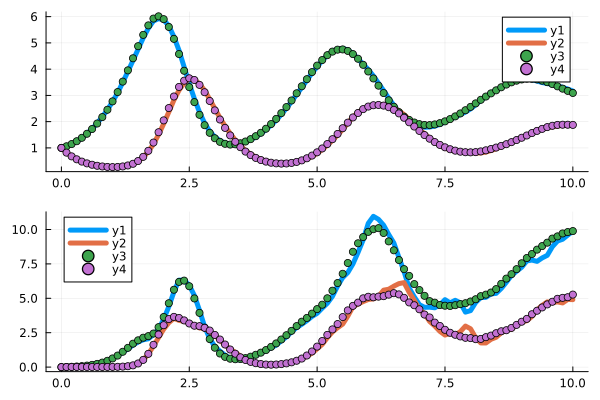

(p, l) = ([1.5499999999945204, 0.9500000000404427, 3.049999999957369, 1.0499999999840963, 0.25000000000649286, 0.25000000002746536], 93.24260833966437)


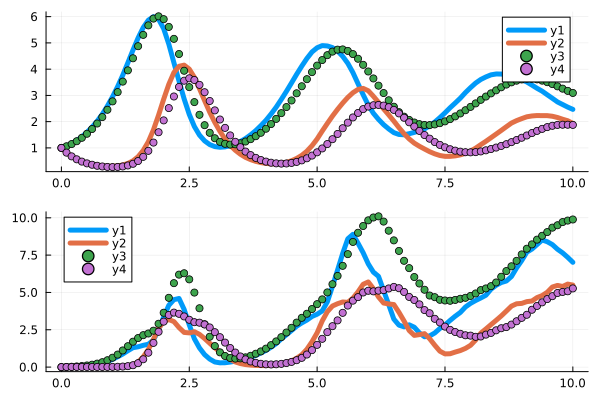

(p, l) = ([1.516608346251479, 0.9852214103927975, 3.0170335734874056, 1.0163538932824243, 0.28374249496113113, 0.2841512253013676], 10.659376112559695)


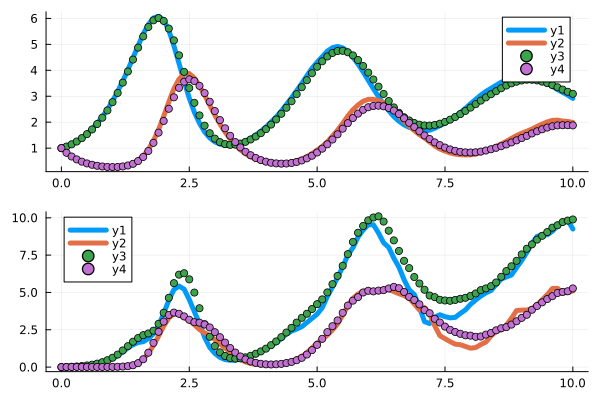

(p, l) = ([1.4825487009716303, 1.0199804170056956, 2.985085407273522, 0.9806487142538844, 0.3165420571553493, 0.31820453484547395], 24.73888180771684)


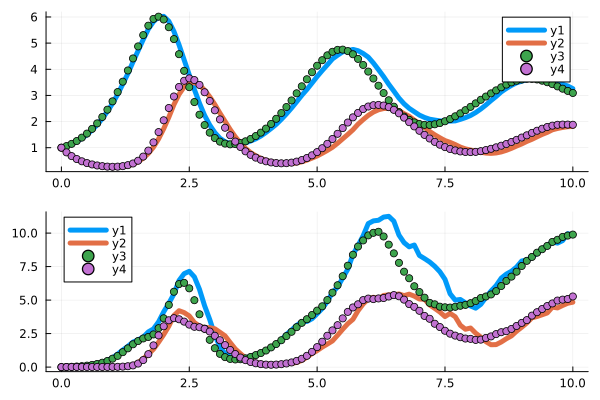

(p, l) = ([1.4661252135879528, 1.0390322163149937, 2.965914415817067, 0.9671311480883319, 0.33574129174698064, 0.3396644162933854], 61.61850777006926)


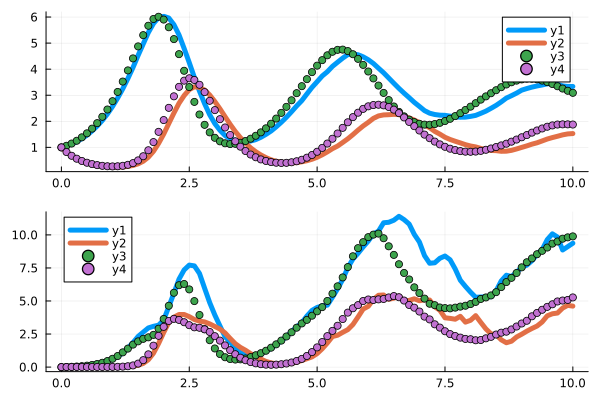

(p, l) = ([1.4651441536851515, 1.043206198246823, 2.957771103946427, 0.9716058192698335, 0.34331355129590374, 0.34982371775875387], 44.41940158834862)


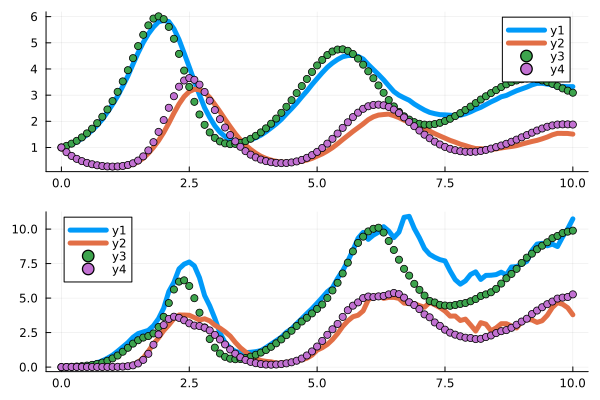

(p, l) = ([1.4759545348418948, 1.0352128310443627, 2.962387495673746, 0.9858824755535548, 0.3385511821478629, 0.3491791341700884], 34.62976299342425)


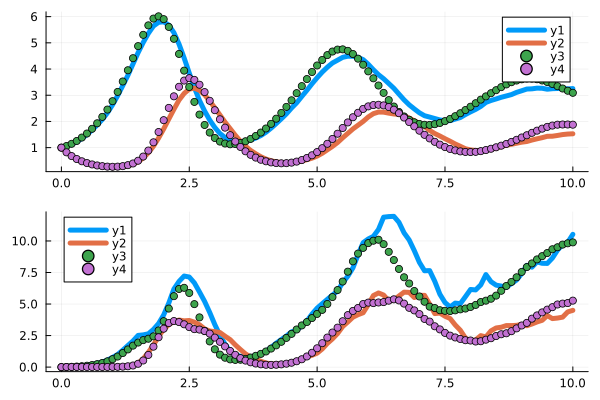

(p, l) = ([1.4924118214520081, 1.0209128184473444, 2.9756407253253845, 1.0028648307699948, 0.3267599844834802, 0.34267938810593634], 16.263182113860054)


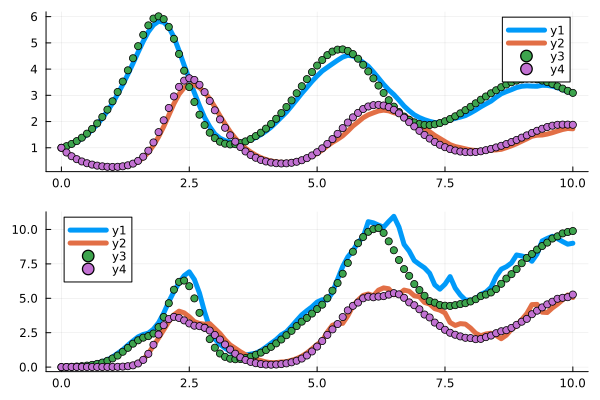

(p, l) = ([1.5107350662086612, 1.004677659592993, 2.9931812313701016, 1.0195447782034683, 0.31185669580540115, 0.3328179782805202], 4.566046595848143)


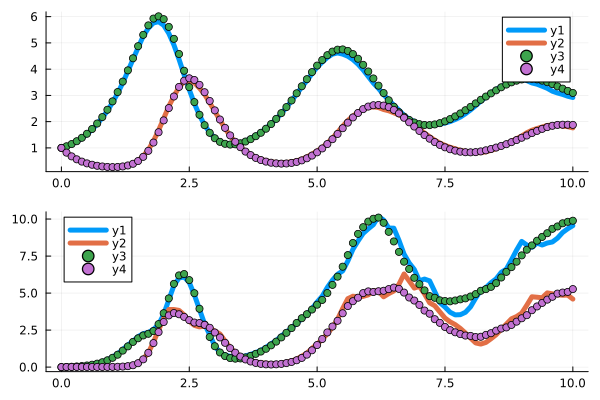

(p, l) = ([1.527131577174517, 0.9899251968193681, 3.011990196670677, 1.0313382503351838, 0.29757439688558696, 0.3232677478096815], 17.920820080088944)


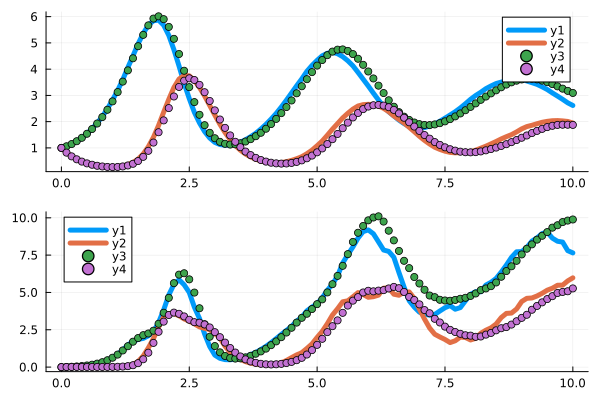

(p, l) = ([1.538926719763906, 0.9800255657716765, 3.029579522153647, 1.0354950386177388, 0.28578637613322594, 0.3157749495292898], 17.893399170704434)


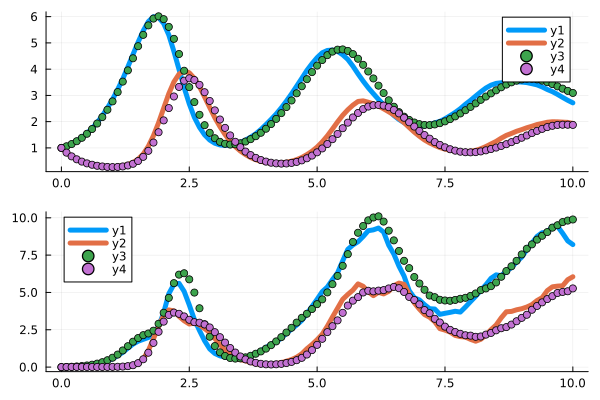

(p, l) = ([1.5399751763728828, 0.9803828789734633, 3.0377165437100526, 1.0287506366756571, 0.28300601829188643, 0.3166551318587508], 12.923189158640227)


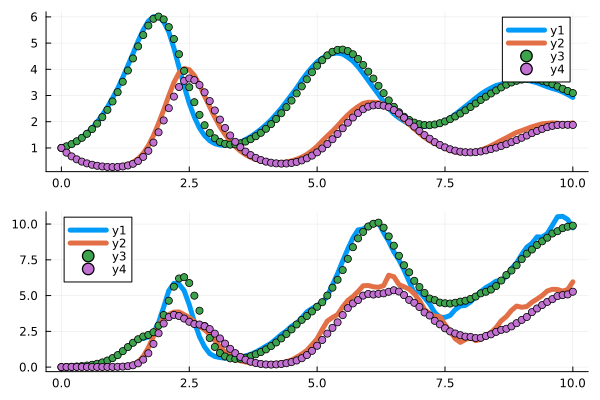

(p, l) = ([1.5330905112574653, 0.9889231031612482, 3.036080826944956, 1.0160547651245146, 0.28836328543782497, 0.32521668774311496], 17.8197692359771)


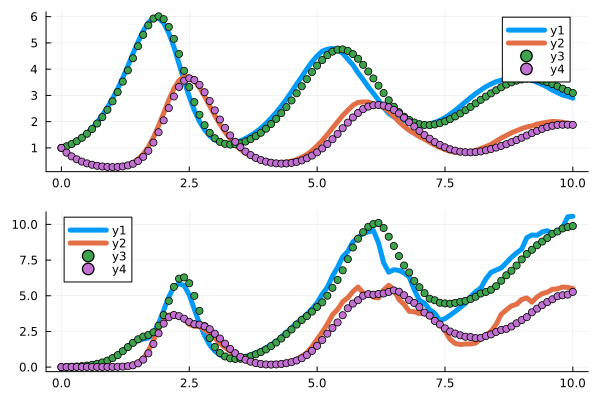

(p, l) = ([1.5233246739924928, 1.000804642152043, 3.030802929298816, 1.0015060041576997, 0.2959693203156194, 0.33584887849245754], 7.1774533941521135)


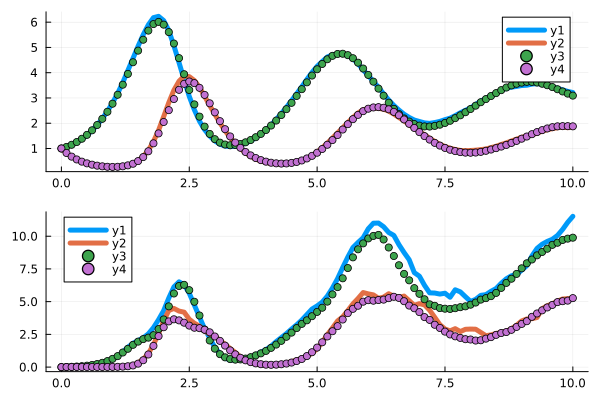

(p, l) = ([1.5109302303903756, 1.0148172691679496, 3.0214250559091167, 0.9859732582391894, 0.3056991240079023, 0.3465285441220484], 10.46646886890942)


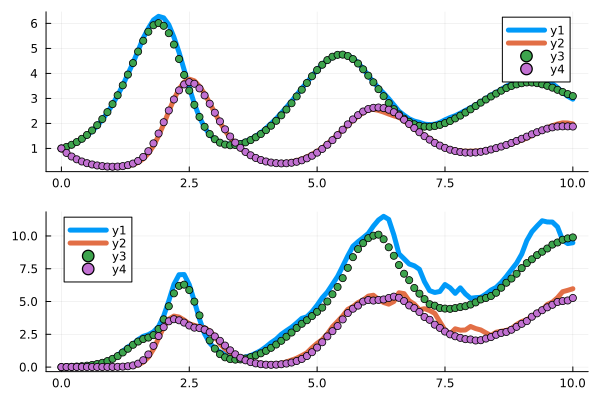

(p, l) = ([1.5005781689568396, 1.0271954587985879, 3.0113821198716524, 0.9753504646187313, 0.3142648410770631, 0.35508583001235894], 22.00161107226377)


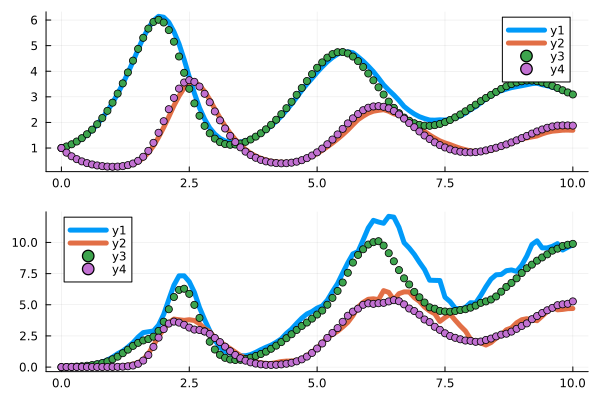

(p, l) = ([1.493355196996552, 1.0362546836738422, 3.0016410835473653, 0.9702328396665362, 0.3201766840240603, 0.35710114785578], 25.51015929565736)


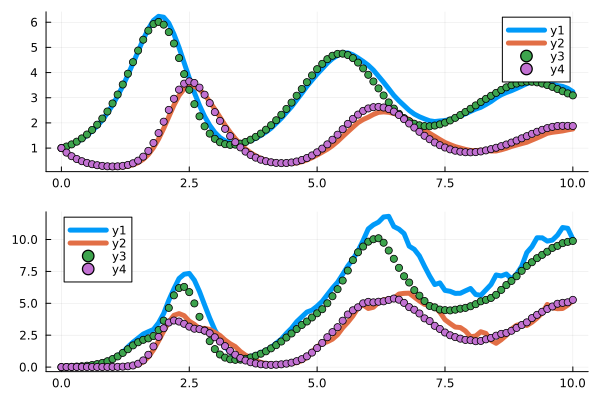

(p, l) = ([1.4931443365462866, 1.0391080798208254, 2.9957824157859796, 0.9741870475075868, 0.3192348990851482, 0.3557665018565576], 28.51295601784227)


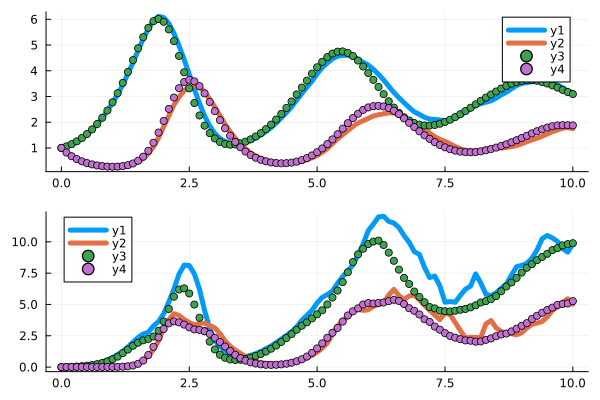

(p, l) = ([1.4967627816283218, 1.0374128962651143, 2.992150596220464, 0.9825914362618807, 0.3153468477218272, 0.35423056195727265], 22.322144637138965)


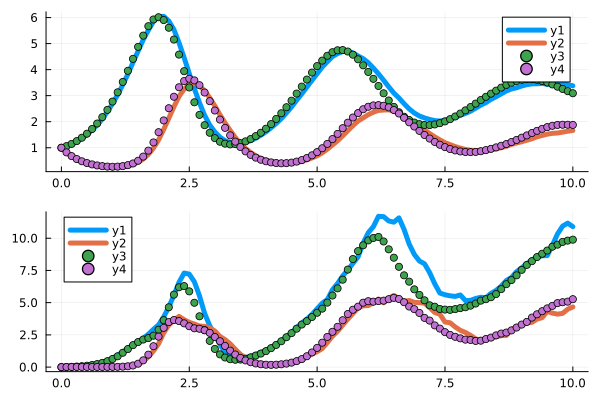

(p, l) = ([1.5032511184750412, 1.0324092376904597, 2.9910342302822444, 0.9939846083747048, 0.3092923125118203, 0.3504273540360447], 13.065171552408156)


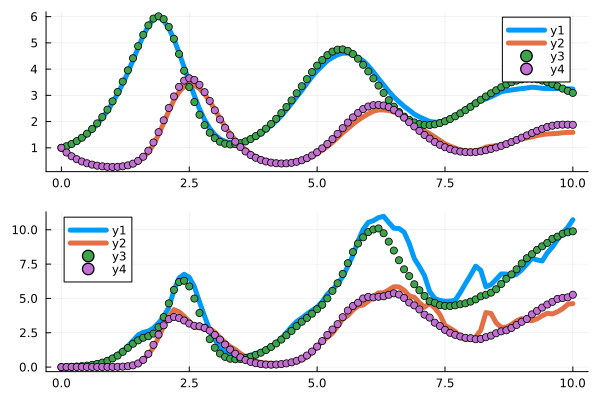

(p, l) = ([1.5109307041596631, 1.0255245652462095, 2.9925747889449994, 1.0051185016625555, 0.3013110558899182, 0.3429778948342624], 5.964950423443025)


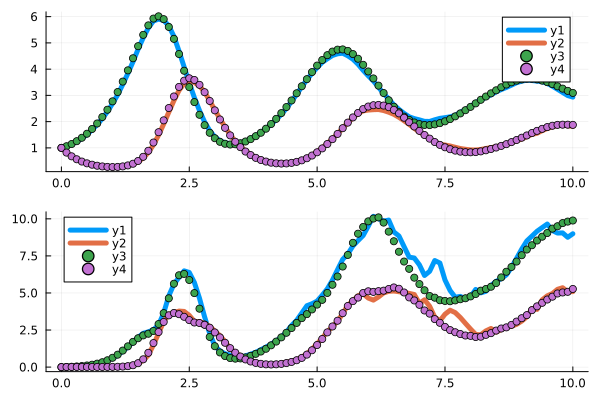

(p, l) = ([1.5191963886602216, 1.017396805127641, 2.99672333301356, 1.0148911047655038, 0.29196601275070394, 0.3339349197923557], 5.106771572884631)


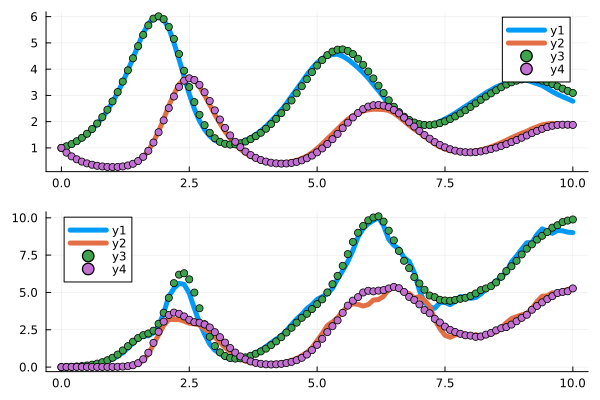

(p, l) = ([1.5248073359454186, 1.0108901484128412, 3.000760686916503, 1.0199618622662574, 0.2842164527041659, 0.32685335732006854], 7.767486455934257)


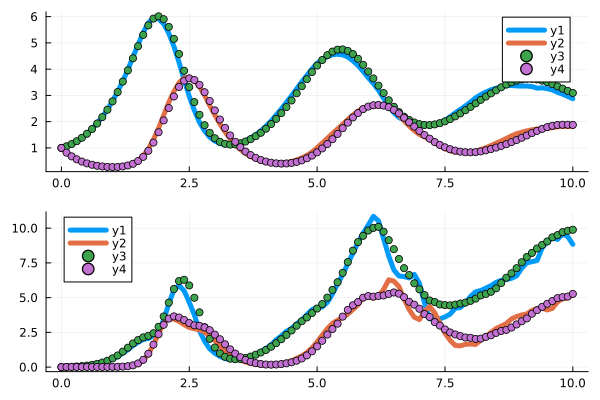

(p, l) = ([1.5255874443147537, 1.0085886246051177, 3.000819762132357, 1.019796766811897, 0.28110405968527036, 0.3247433444756284], 7.231857245946946)


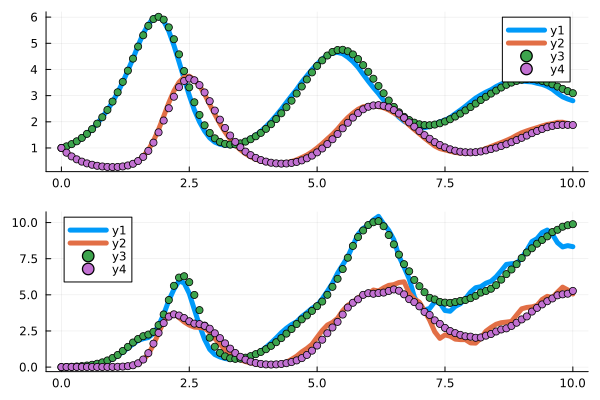

(p, l) = ([1.5223965972337214, 1.0088086810125385, 2.99842805967029, 1.0142768950078958, 0.28152334420540454, 0.3259584863917334], 7.607441622545577)


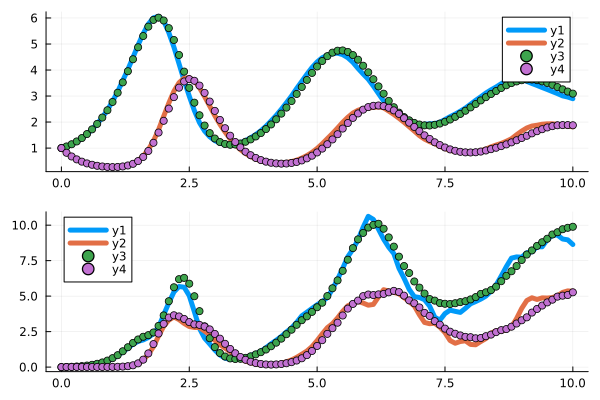

(p, l) = ([1.5162678930495825, 1.012246027591154, 2.9924398094009366, 1.0066095220765943, 0.2852994027342893, 0.33153910478042503], 5.580060720266554)


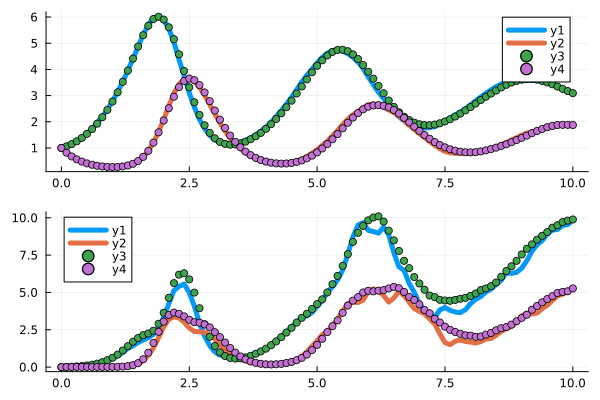

(p, l) = ([1.5088507141237983, 1.016324333204214, 2.98483161686079, 0.9972793041413015, 0.289659276694558, 0.33784523670283023], 4.76959638442785)


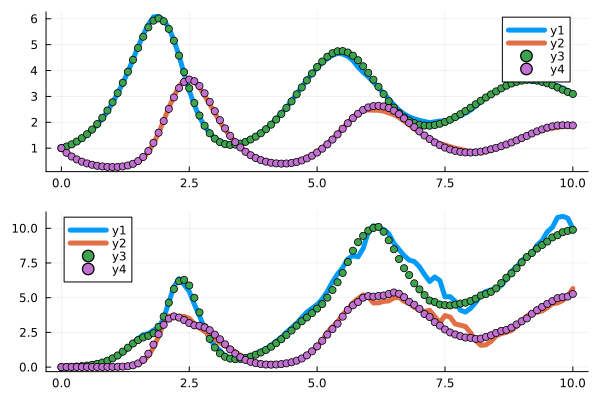

(p, l) = ([1.5018866628319776, 1.0195560068337244, 2.9768666647779134, 0.9887238085596531, 0.2938801081222131, 0.34352241858139165], 3.5083984720441026)


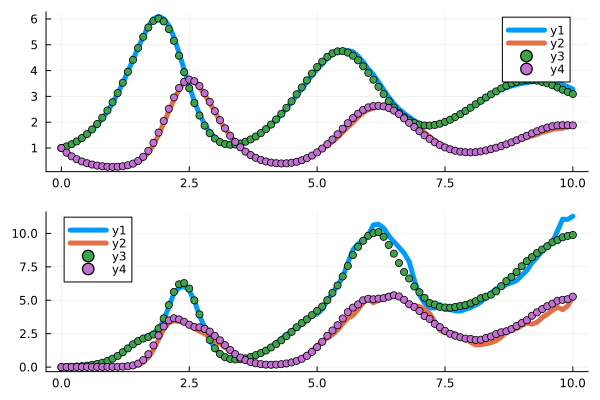

(p, l) = ([1.4954140993039944, 1.0212681299927049, 2.9683361561664348, 0.9807679451171929, 0.29724981621341795, 0.3483590967882271], 5.737351917915966)


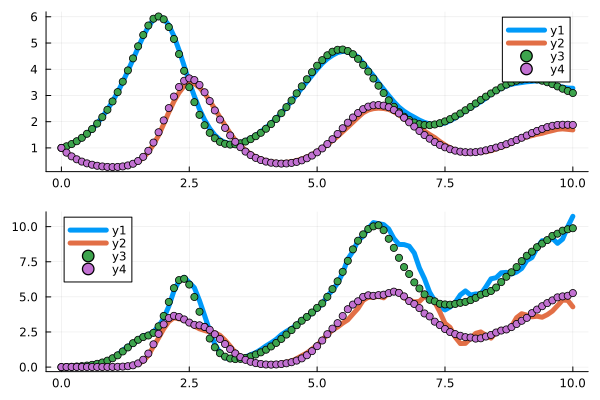

(p, l) = ([1.4921181448175564, 1.020577671944499, 2.961270937025678, 0.977618408948019, 0.2989440735734908, 0.35131824179371124], 17.142298728349342)


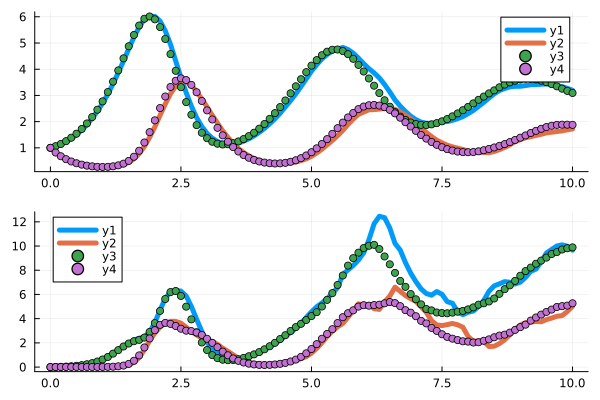

(p, l) = ([1.4915819718243795, 1.017280878745714, 2.9555853200717546, 0.9783210404622258, 0.2988735528354176, 0.3531698646769709], 6.747356811544707)


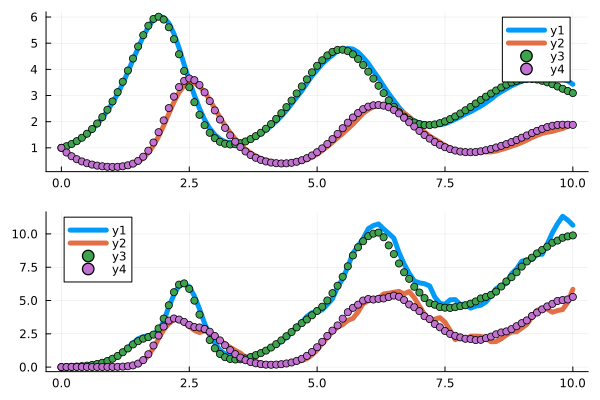

(p, l) = ([1.4940485567897182, 1.0116693074342786, 2.952553749122418, 0.9824909414001822, 0.2962342801051889, 0.3515026432487696], 13.509397107553202)


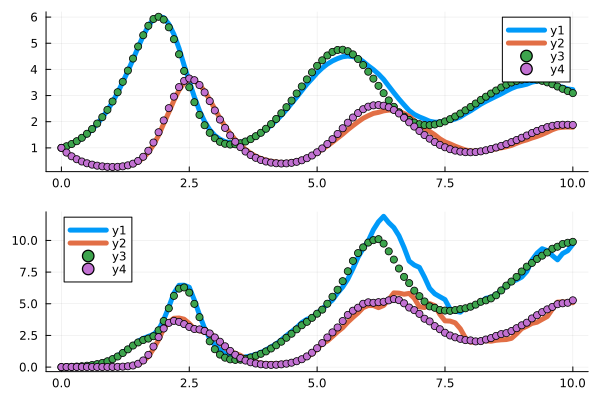

(p, l) = ([1.4990052633615725, 1.003863867911601, 2.9529456536334697, 0.9884230903867313, 0.2912266236313279, 0.34774812055187393], 7.808527765101605)


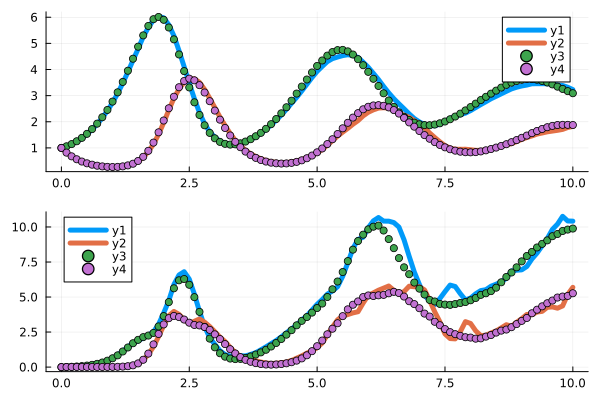

(p, l) = ([1.506045995603285, 0.9951751572176197, 2.9567944078001474, 0.9960191251527857, 0.28444037420476526, 0.3418698279765884], 2.7861597566837397)


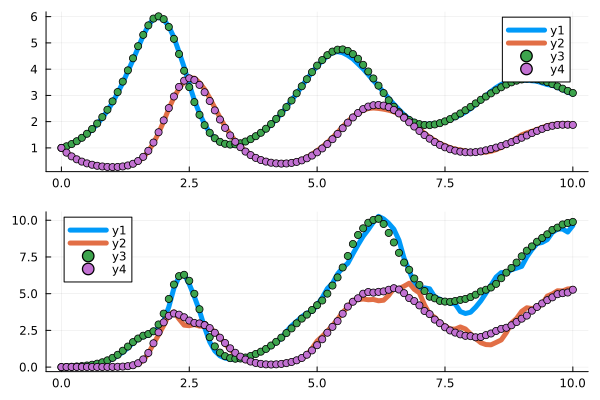

(p, l) = ([1.5130661916791164, 0.9878920272024403, 2.9621478906852516, 1.0031805746689748, 0.2774959755205248, 0.3352510399471797], 4.407956293663627)


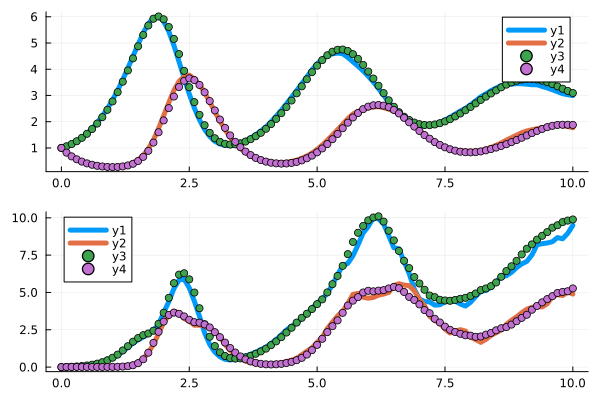

(p, l) = ([1.5173868644657478, 0.9840252031896853, 2.9655907888471997, 1.0073223554473856, 0.27258648123609, 0.33053615958262367], 8.594759422860834)


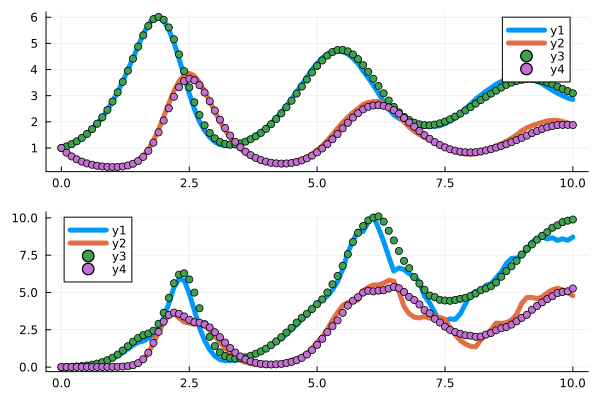

(p, l) = ([1.5156720349515977, 0.9857732079787282, 2.963578467914515, 1.005226079689963, 0.27366536162377825, 0.3313746612310389], 7.248646665989021)


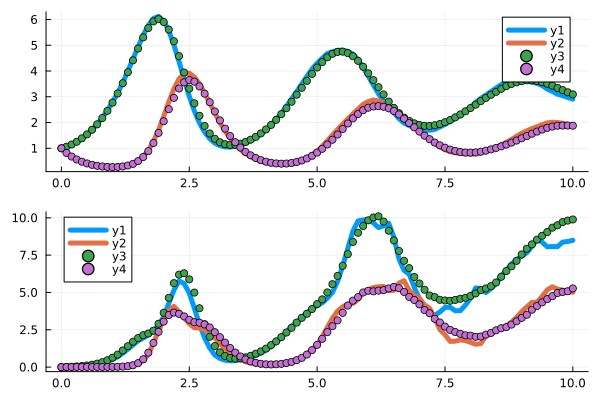

(p, l) = ([1.511782569661813, 0.9904389209536828, 2.9597884558244267, 1.001023332330705, 0.27706931543111035, 0.3342219419531994], 7.242178594836419)


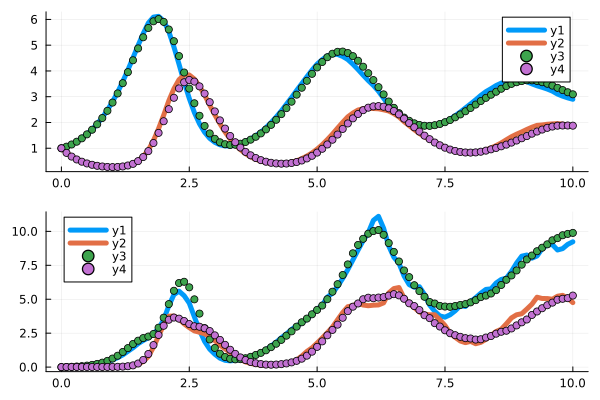

(p, l) = ([1.5062225757340733, 0.9971480120538995, 2.9545067652336487, 0.9950784047400746, 0.28154059876709225, 0.3383510560551362], 3.9712204126818484)


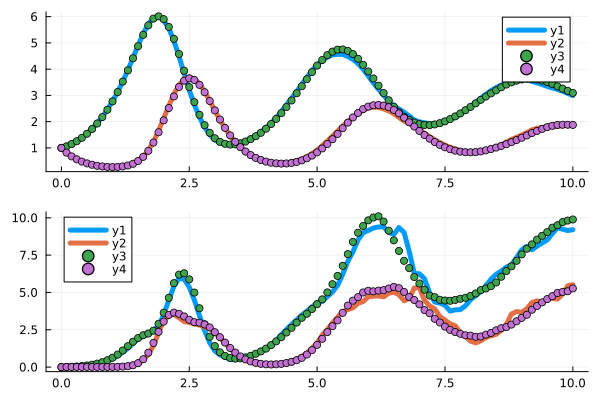

(p, l) = ([1.5022218293345095, 1.003462708917514, 2.9508746412950706, 0.9913519554344398, 0.285592799334872, 0.34158929787573306], 3.4482533355131055)


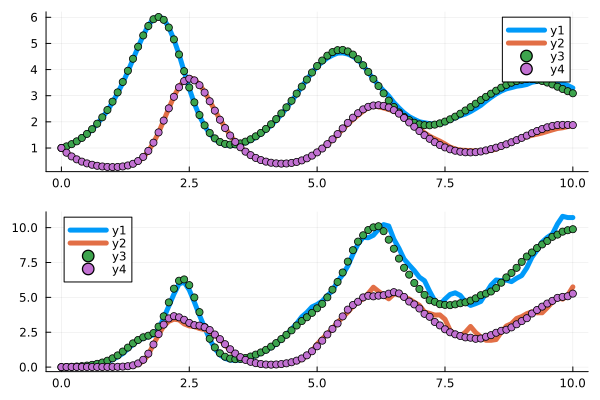

(p, l) = ([1.4994538476173163, 1.0084307953564098, 2.949280230151962, 0.9878705359877861, 0.28780699591874453, 0.3433080499840832], 7.99471937789482)


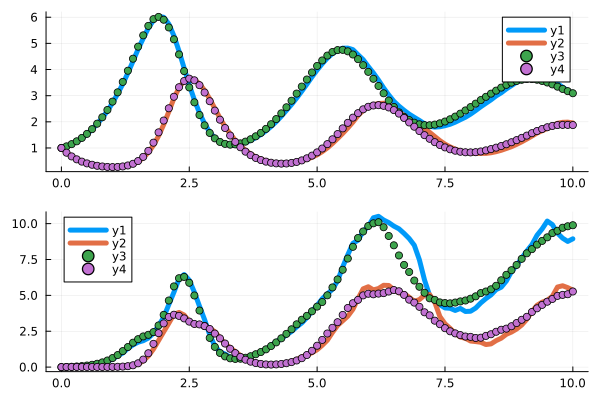

(p, l) = ([1.4983482382412328, 1.011433618061233, 2.9499373803978464, 0.9853537893361026, 0.28800343853960286, 0.3416114633041782], 4.644602733541927)


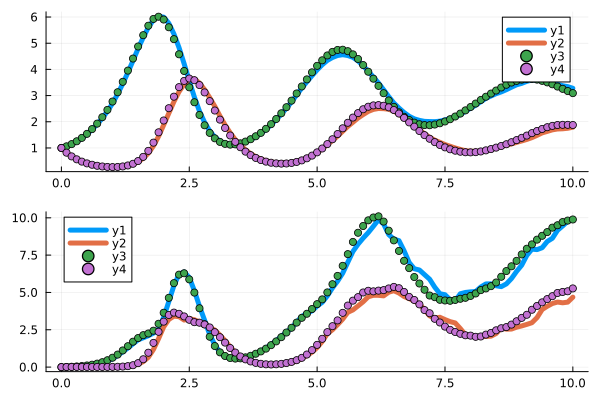

(p, l) = ([1.4979698657407337, 1.0142948248090047, 2.9495183948487664, 0.9853494429029377, 0.28879657640569834, 0.3393694727557024], 2.8659011288486322)


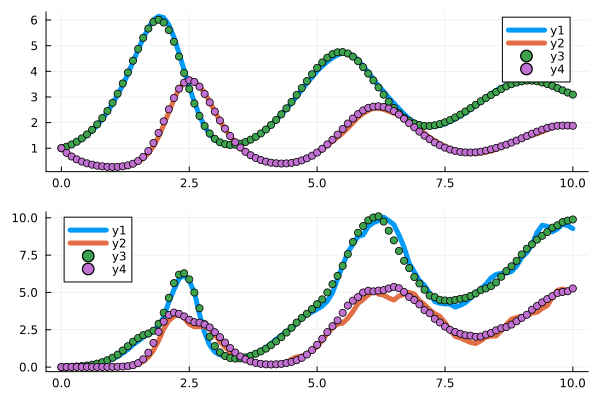

(p, l) = ([1.500443595492341, 1.014353150218516, 2.9507364685459327, 0.9888149622482818, 0.2873758566379635, 0.33467430056115527], 4.258988959234131)


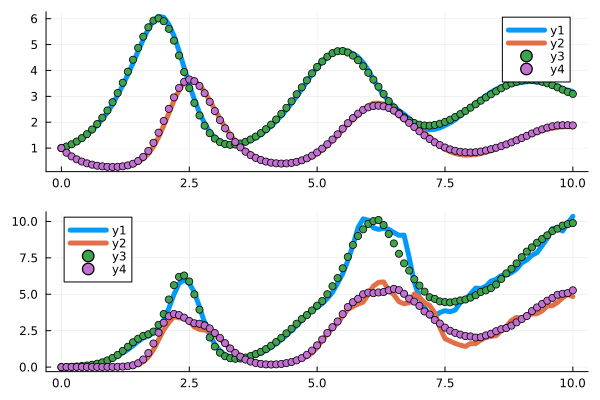

(p, l) = ([1.5029222953201304, 1.0128774990402736, 2.9515773613705485, 0.9914726512669074, 0.28559274866758255, 0.3309289544749527], 2.7971323768795195)


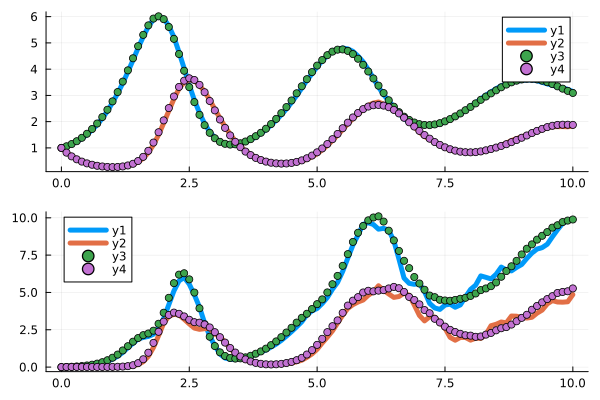

(p, l) = ([1.5066434316288573, 1.0101673888835538, 2.954723470214989, 0.9946136238978651, 0.28215103673167397, 0.3256033793036241], 2.574907178340727)


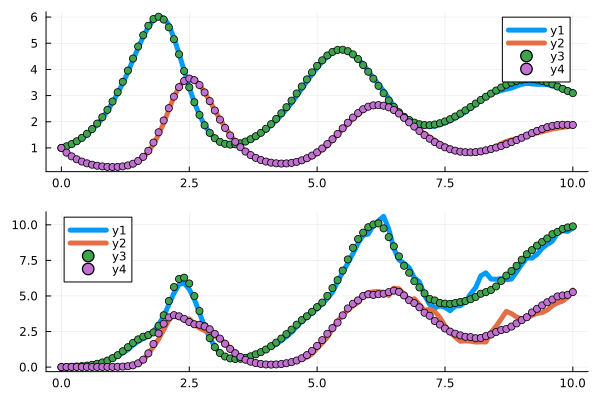

(p, l) = ([1.508932895090802, 1.008262175201264, 2.9564593350481747, 0.9961548982970804, 0.28003771905365665, 0.3223634985363969], 4.294212861047424)


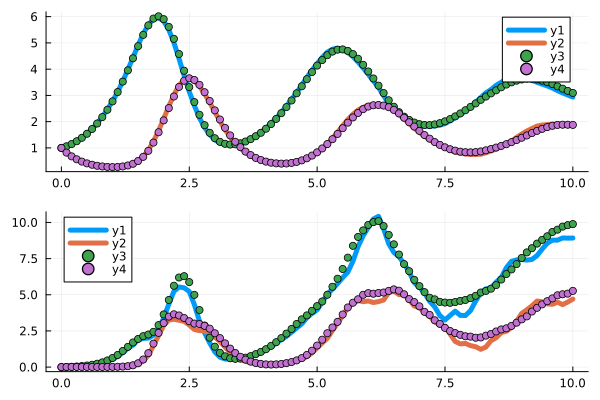

(p, l) = ([1.5096916842636607, 1.0072576323952371, 2.957513434707033, 0.9956041803946283, 0.27932595285520423, 0.3196427088841021], 2.925563275154441)


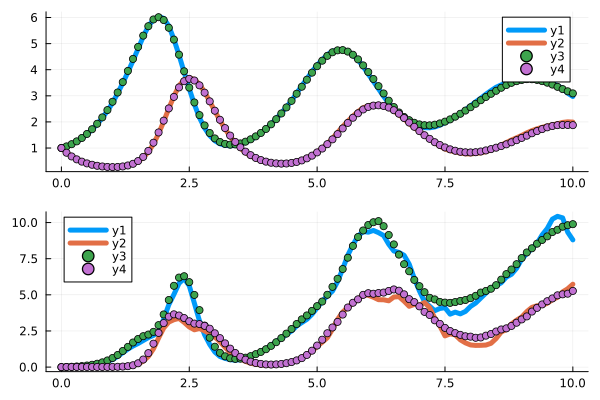

(p, l) = ([1.5086487923824643, 1.0081675257782388, 2.95653777693802, 0.9939967153599042, 0.28078077260068757, 0.31945040170817846], 10.173906606583213)


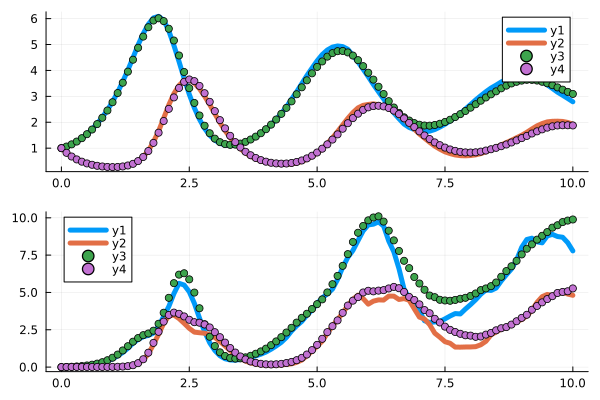

(p, l) = ([1.5066871752895534, 1.010279825092069, 2.953994548922292, 0.9922720554450342, 0.2836457215959647, 0.320921393532646], 4.044874397652137)


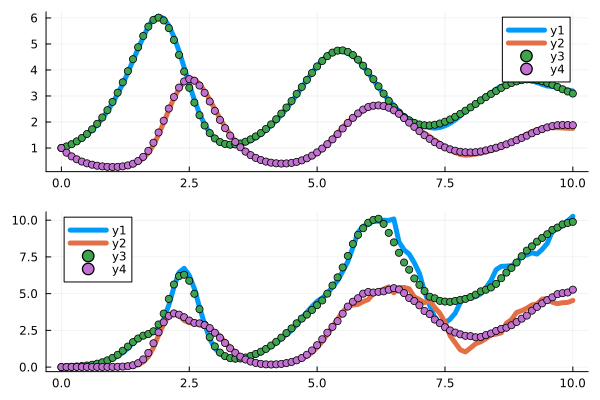

(p, l) = ([1.5062399238016826, 1.0116858913027174, 2.952962973242415, 0.9923901328890061, 0.2852524360932757, 0.3194897516507083], 3.653748903715938)


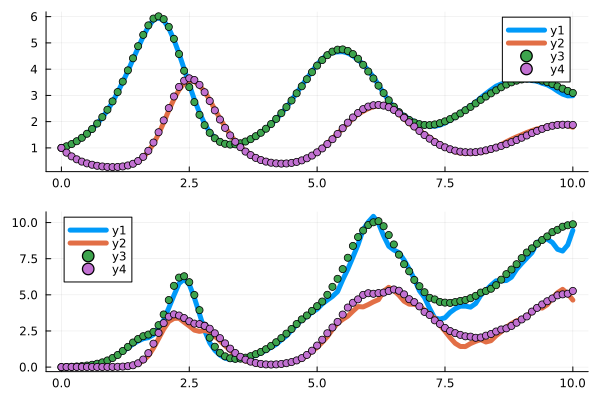

(p, l) = ([1.506547401590865, 1.0122915495692917, 2.9528371174064727, 0.9930131974862124, 0.28611509331773266, 0.31755394035392187], 3.2871938778893584)


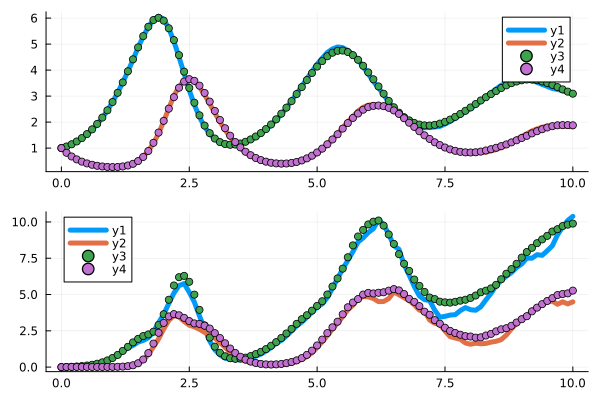

(p, l) = ([1.5075856698212482, 1.0124928731346243, 2.95415773849298, 0.9944300631462903, 0.2869566055549657, 0.3154591594597495], 3.2020117454986954)


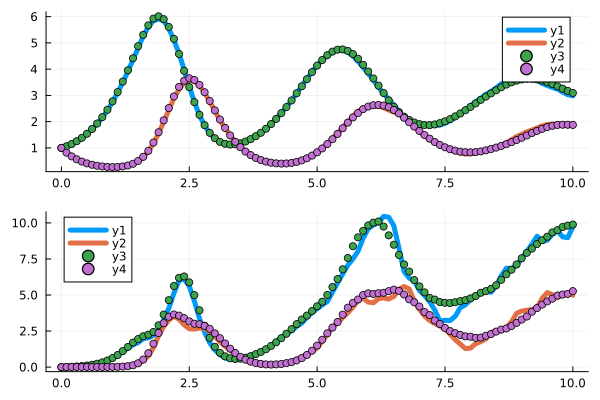

(p, l) = ([1.5084360270339081, 1.0128122922230767, 2.9560151773869876, 0.9953326529424602, 0.2875978020852687, 0.31312843013817965], 3.718560791653723)


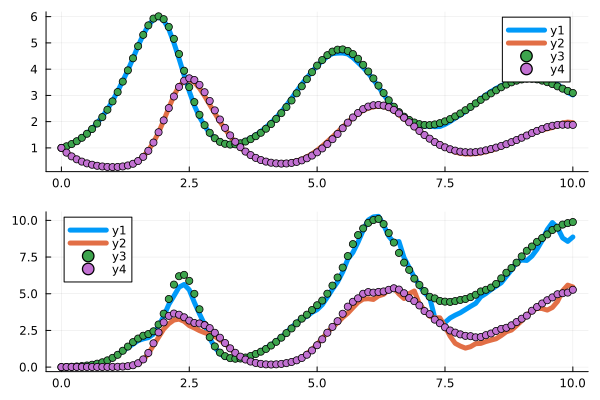

(p, l) = ([1.5085733809105446, 1.0128166986229572, 2.957669705315273, 0.9948337398670521, 0.28913633886325113, 0.312656708959007], 2.7362695067260154)


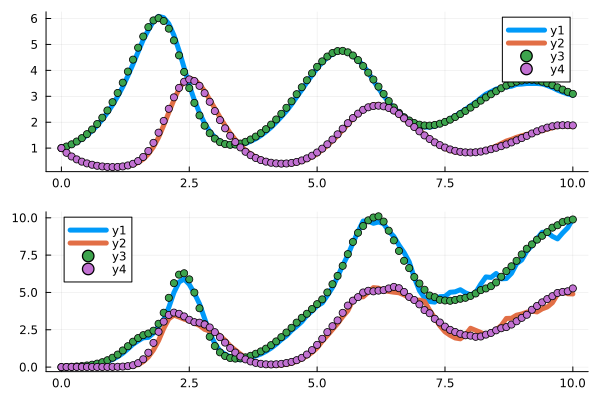

(p, l) = ([1.5083803614549043, 1.0129988760046194, 2.9592435955143053, 0.9937372861942324, 0.2909991902079786, 0.3131075386705703], 3.160118179869549)


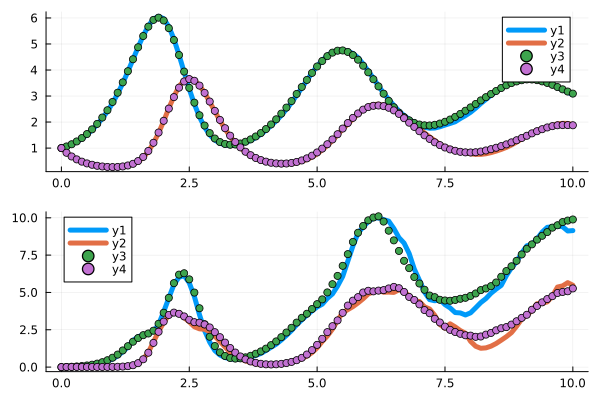

(p, l) = ([1.5080834396337337, 1.0126521370398605, 2.9610485473263797, 0.9919539395256973, 0.2924307110764785, 0.31378084355794333], 2.63917387497455)


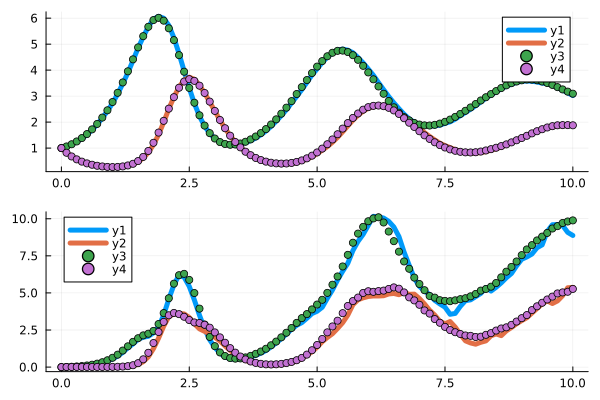

(p, l) = ([1.509573475889024, 1.0110132391220108, 2.9648112778720446, 0.9920292472705959, 0.29246458482732673, 0.3122486407502439], 3.0984271037346853)


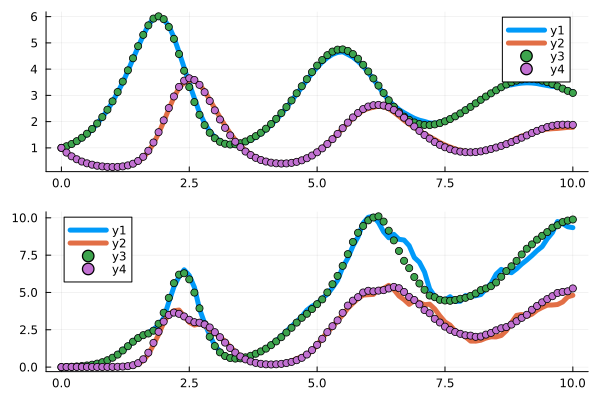

(p, l) = ([1.5125777349756968, 1.0077183278595518, 2.970798325449731, 0.9928161418752238, 0.29052979179349897, 0.30936779950577026], 3.33942412420749)


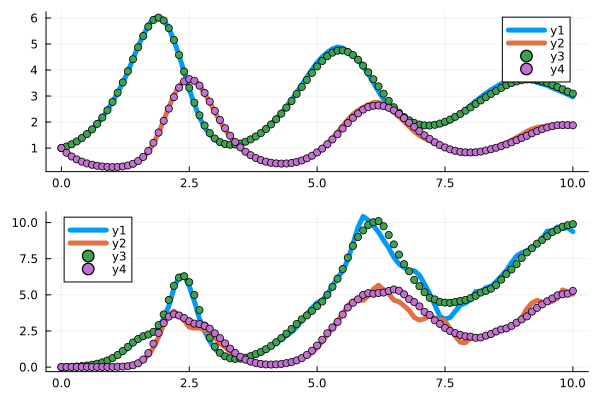

┌ Warning: dt(1.7763568394002505e-15) <= dtmin(1.7763568394002505e-15) at t=6.762888826847077. Aborting. There is either an error in your model specification or the true solution is unstable.
└ @ SciMLBase ~/.julia/packages/SciMLBase/o0qGB/src/integrator_interface.jl:532


LoadError: ArgumentError: number of rows of each array must match (got [202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 136, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202, 202])

In [55]:
using Optimization, Zygote, OptimizationFlux
pinit = [1.5, 1.0, 3.0, 1.0, 0.3, 0.3]
adtype = Optimization.AutoZygote()
optf = Optimization.OptimizationFunction((x, p) -> loss(x), adtype)
optprob = Optimization.OptimizationProblem(optf, pinit)
@time res = Optimization.solve(optprob, ADAM(0.05), callback = cb2, maxiters = 100)

In [56]:
#Example: Controlling SDE's to an objective

In [53]:
using DifferentialEquations, DiffEqFlux, Optimization, OptimizationFlux, Plots

function lotka_volterra!(du, u, p, t)
    x, y = u
    α, β, δ, γ = p
    du[1] = dx = α * x - β * x * y
    du[2] = dy = -δ * y + γ * x * y
end

function lotka_volterra_noise!(du, u, p, t)
    du[1] = 0.1u[1]
    du[2] = 0.1u[2]
end

u0 = [1.0, 1.0]
tspan = (0.0, 10.0)
p = [2.2, 1.0, 2.0, 0.4]
prob_sde = SDEProblem(lotka_volterra!, lotka_volterra_noise!, u0, tspan)

function predict_sde(p)
    return Array(solve(prob_sde, SOSRI(), p = p,
                       sensealg = ForwardDiffSensitivity(), saveat = 0.1))
end

loss_sde(p) = sum(abs2, x - 1 for x in predict_sde(p))

[ Info: Precompiling DiffEqFlux [aae7a2af-3d4f-5e19-a356-7da93b79d9d0]
┌ Warning: Module SciMLSensitivity with build ID 337162397450801 is missing from the cache.
│ This may mean SciMLSensitivity [1ed8b502-d754-442c-8d5d-10ac956f44a1] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:1325
[ Info: Skipping precompilation since __precompile__(false). Importing DiffEqFlux [aae7a2af-3d4f-5e19-a356-7da93b79d9d0].


loss_sde (generic function with 1 method)

In [54]:
callback = function (p, l)
    display(l)
    remade_solution = solve(remake(prob_sde, p = p), SOSRI(), saveat = 0.1)
    plt = plot(remade_solution, ylim = (0, 6))
    display(plt)
    return false
end

#7 (generic function with 1 method)

4041.085549465325

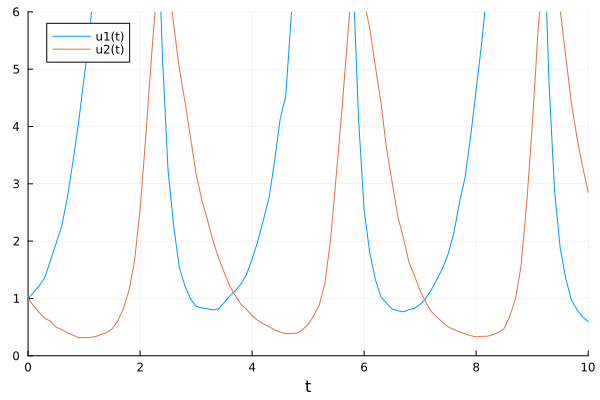

2187.0320328588946

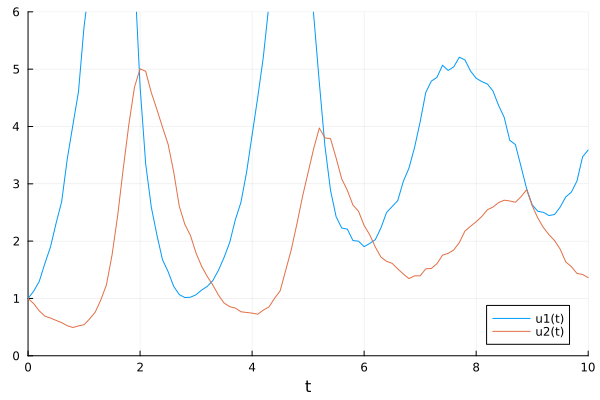

1512.0991553098372

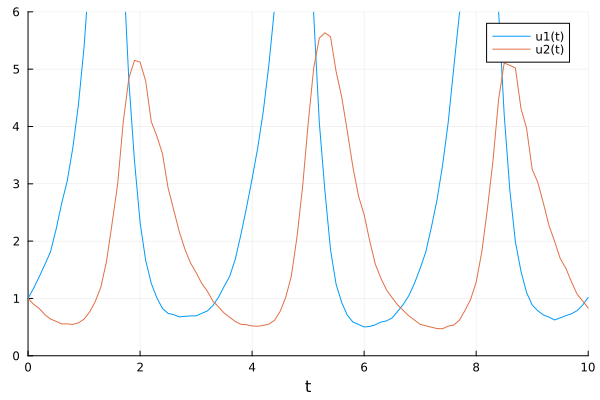

1207.9861647876592

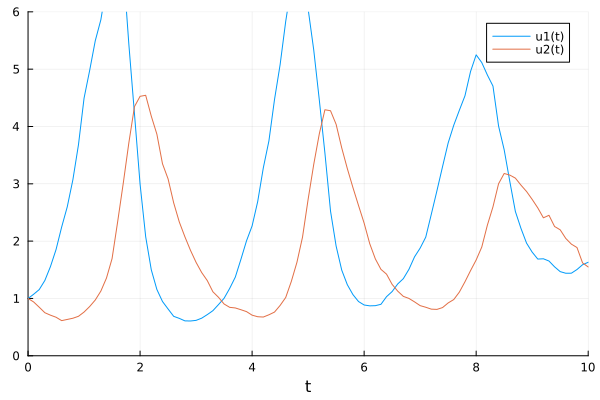

709.7838748482121

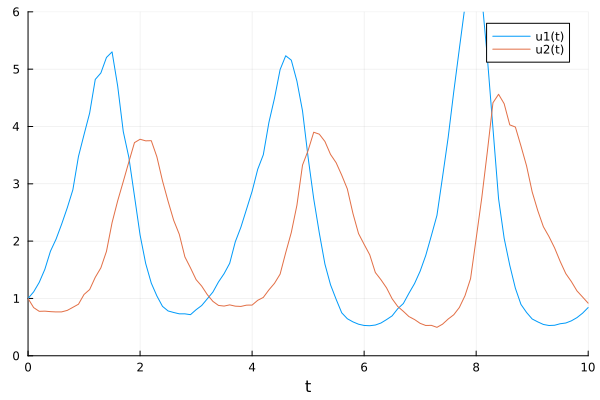

541.3471784301548

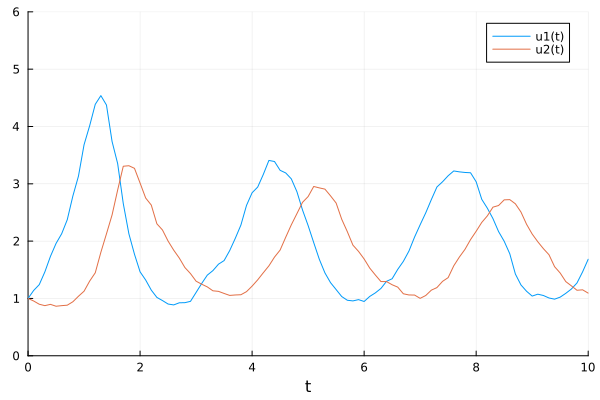

286.6982692880542

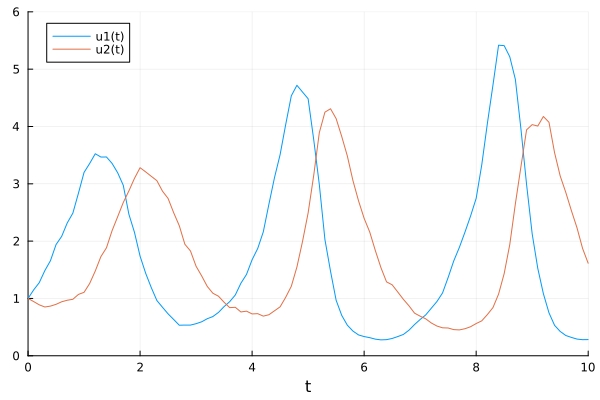

254.22789923639064

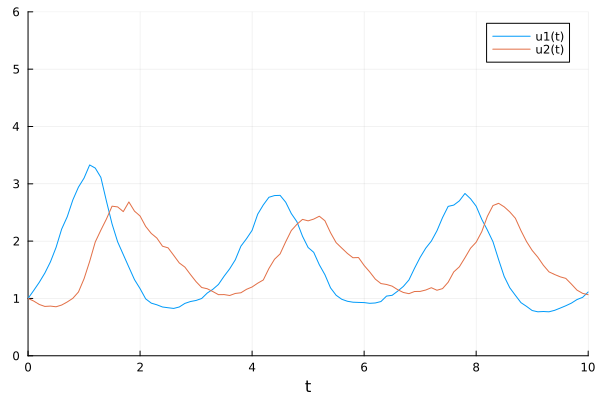

234.12766455398236

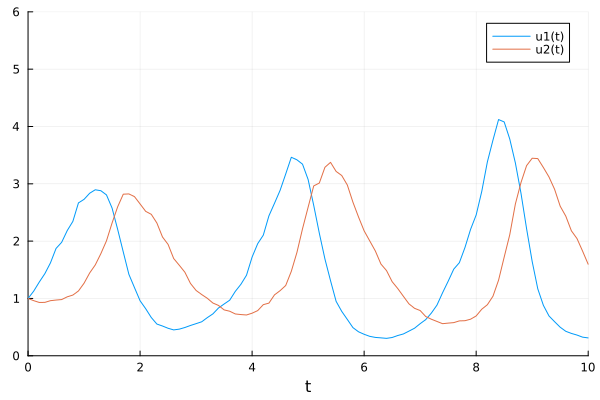

174.7302295224638

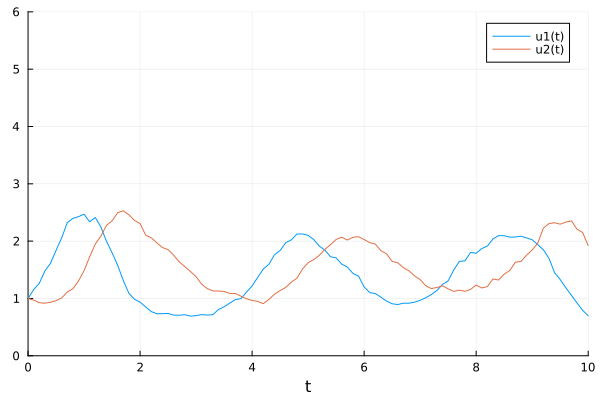

103.6758237259499

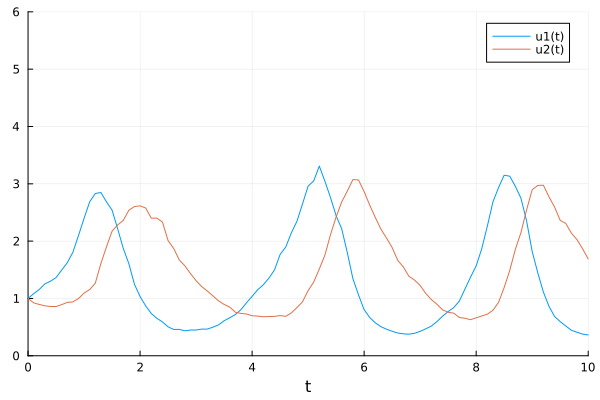

101.74768769908883

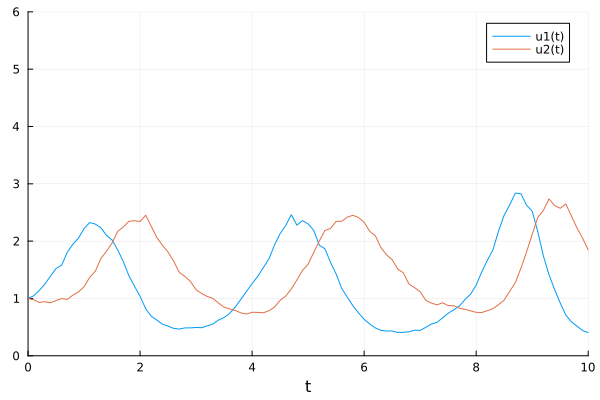

71.71315584232049

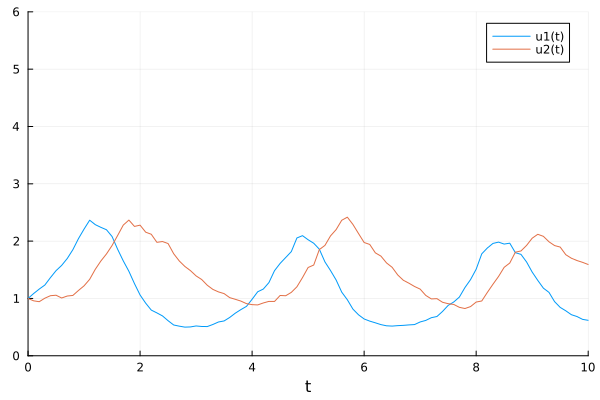

49.64261871711102

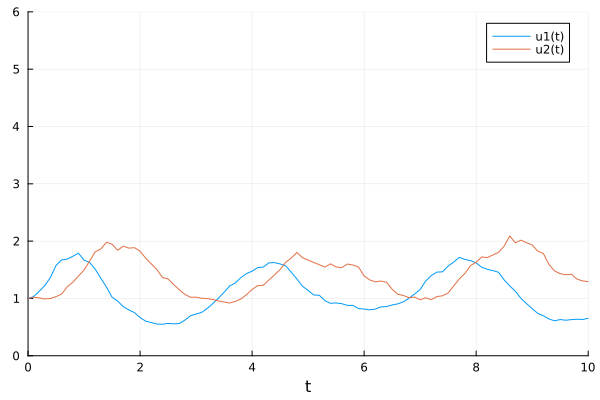

69.41939036372959

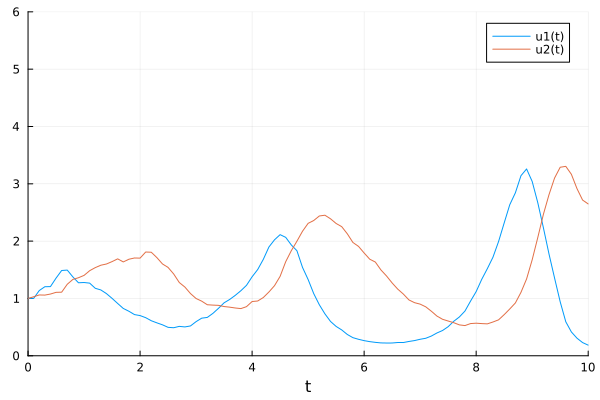

29.055351288545523

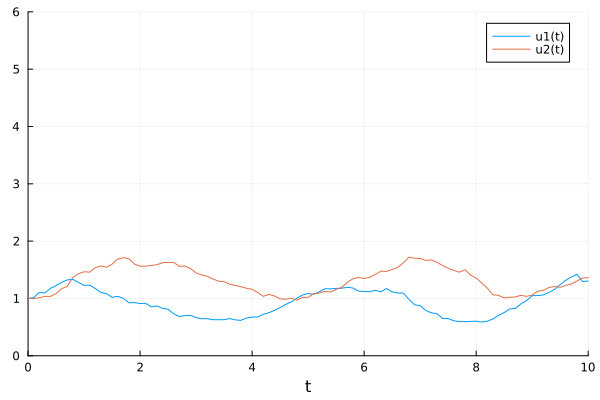

80.77395233173424

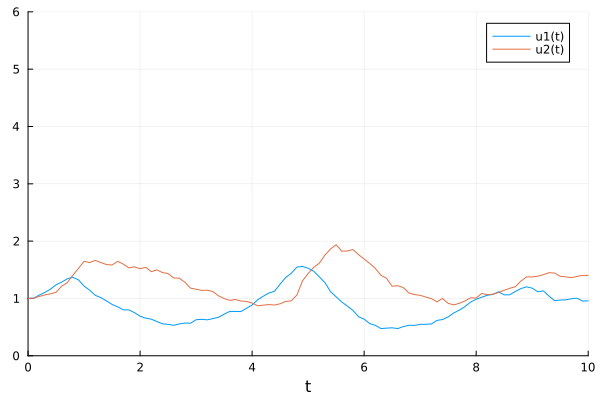

30.552328432670503

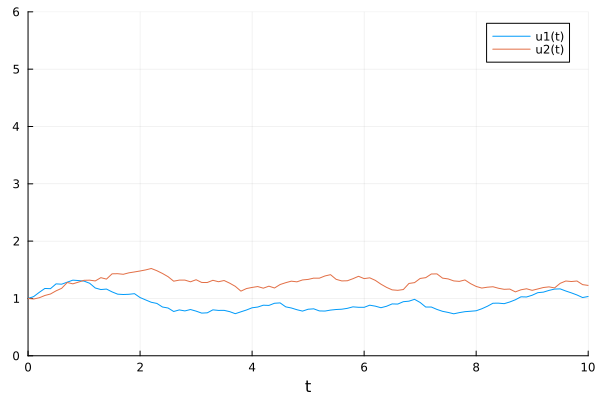

14.911683588640004

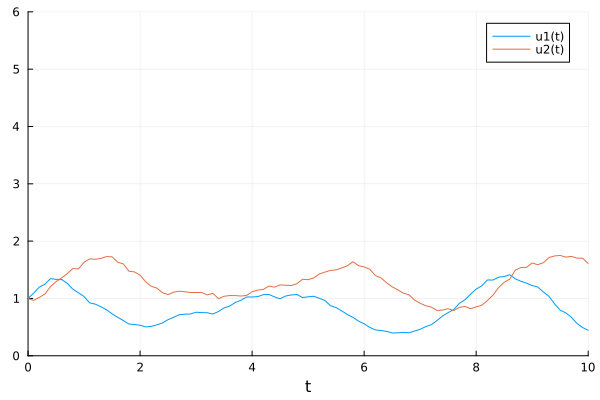

47.71118745181945

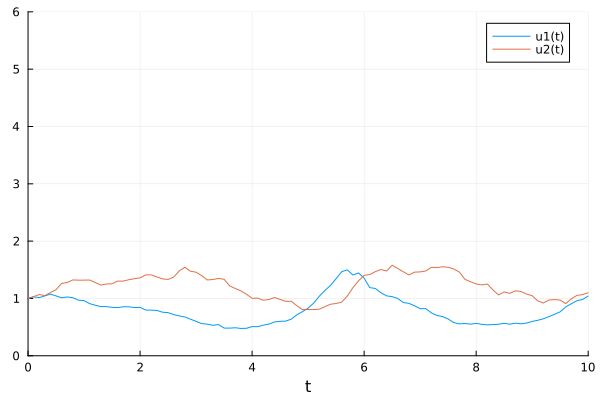

31.640829728947317

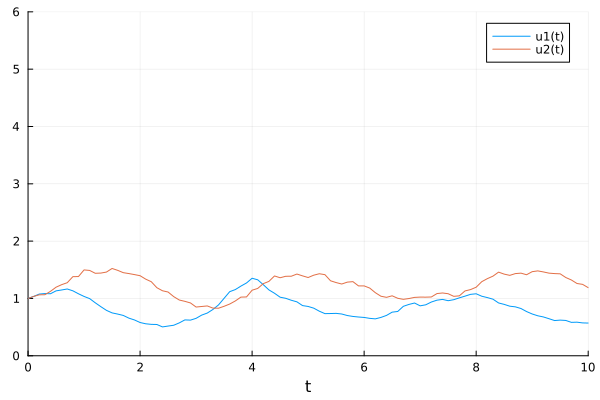

36.03928205096142

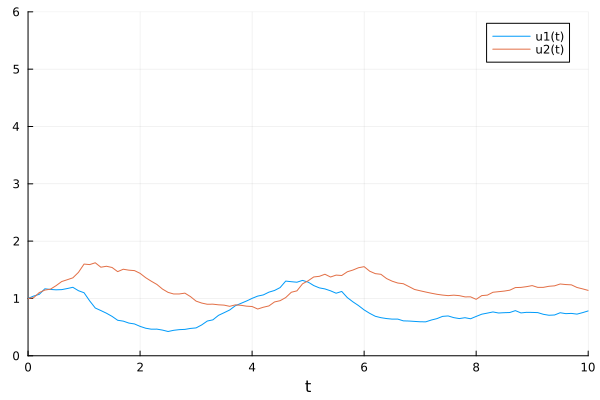

19.979849252551592

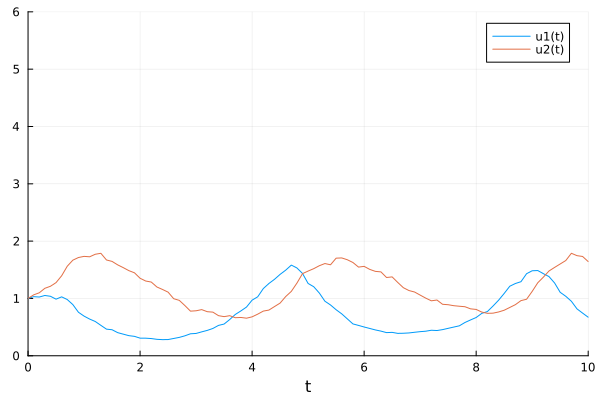

23.62923304498287

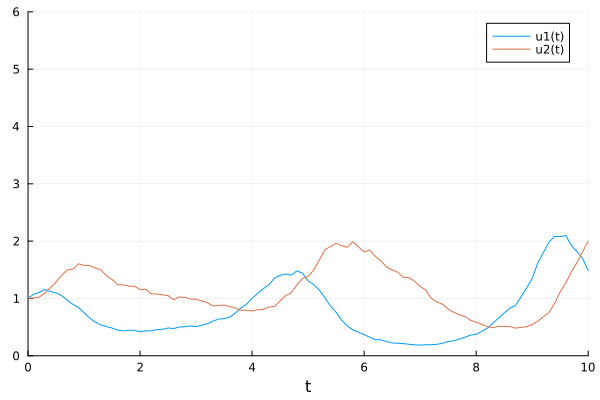

20.175654569129687

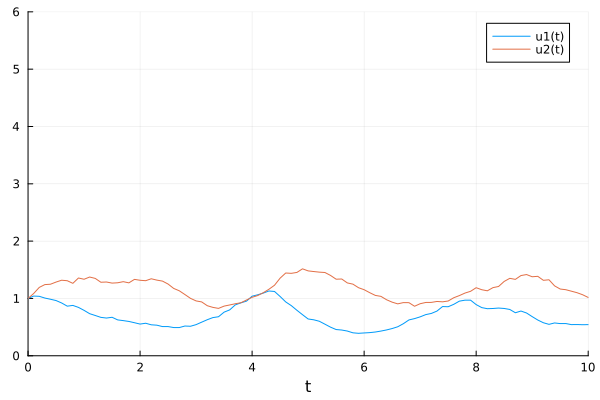

31.867609765899907

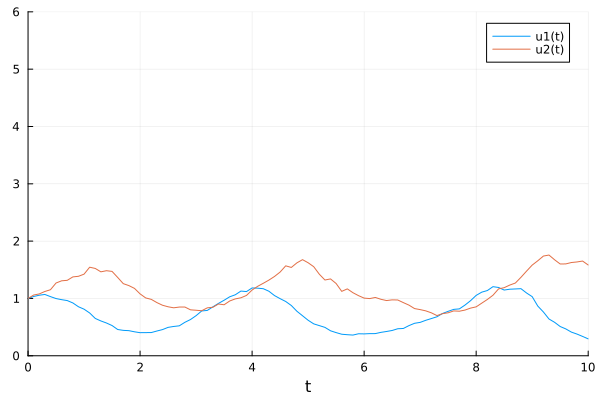

22.28236343220457

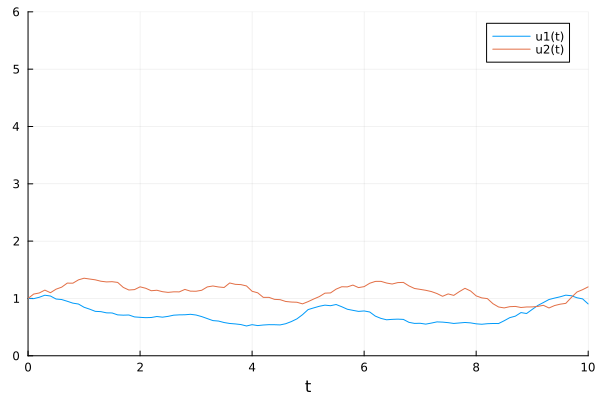

39.12602341078222

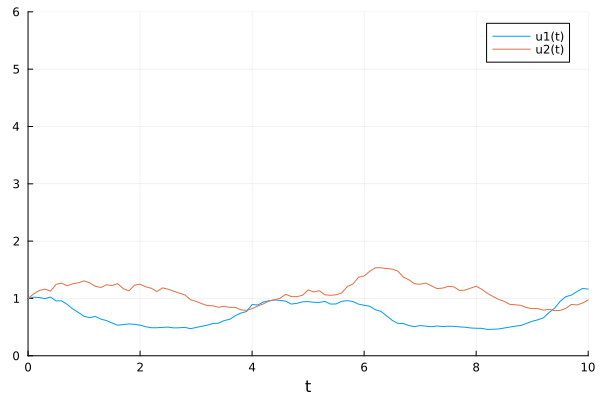

21.22188097677805

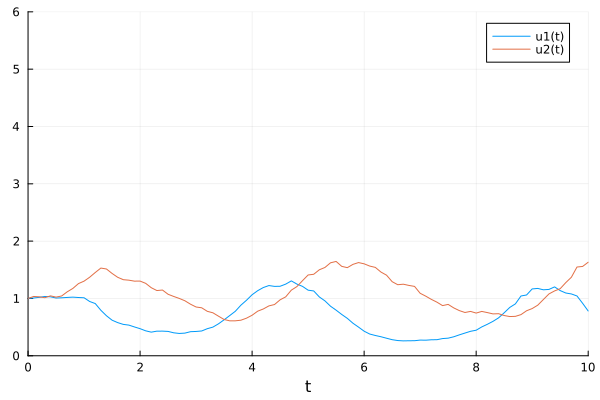

36.8770680271833

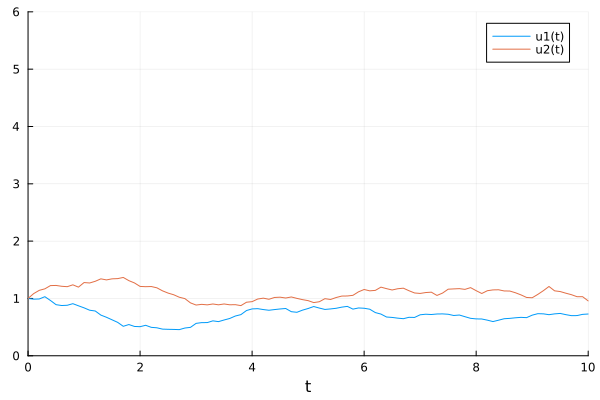

16.84914639507257

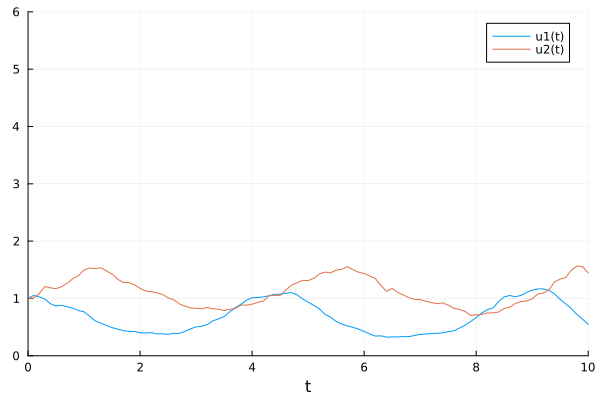

21.44573556259442

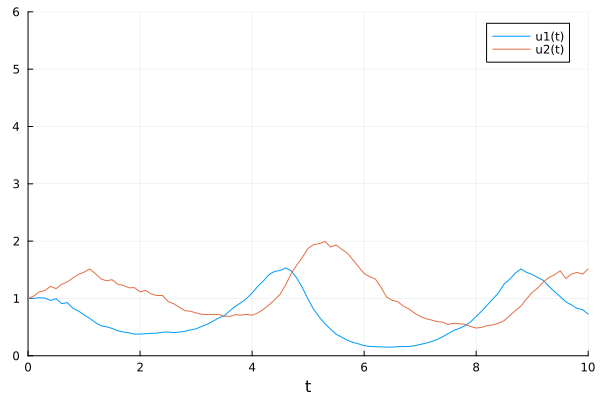

29.611186142442584

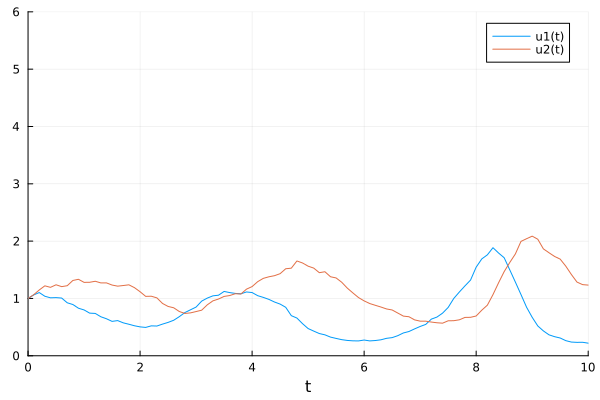

14.491120788028468

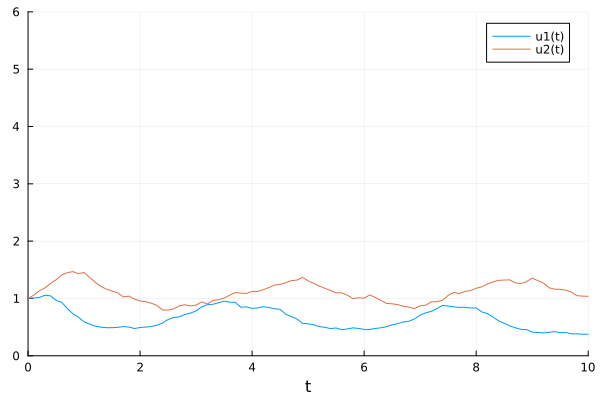

43.92161370144084

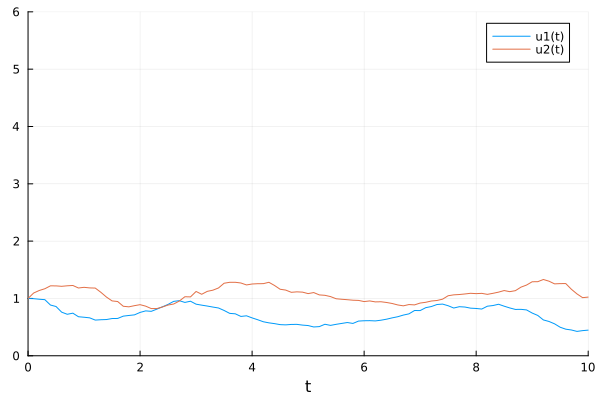

12.832497917043094

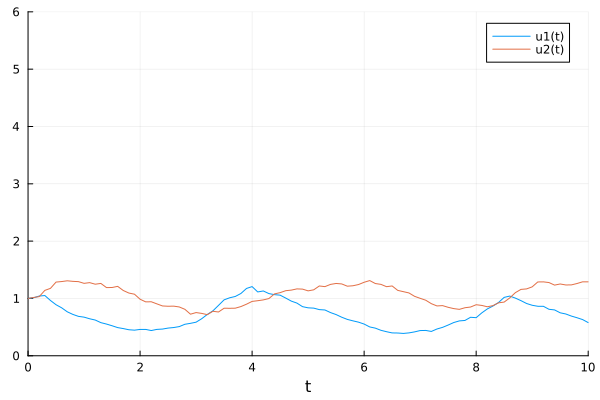

21.63306663000481

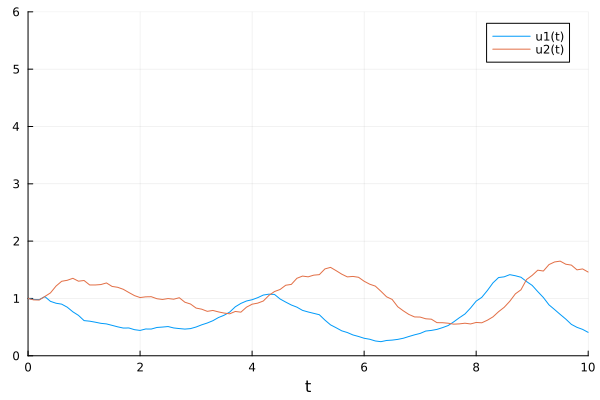

62.52547826946966

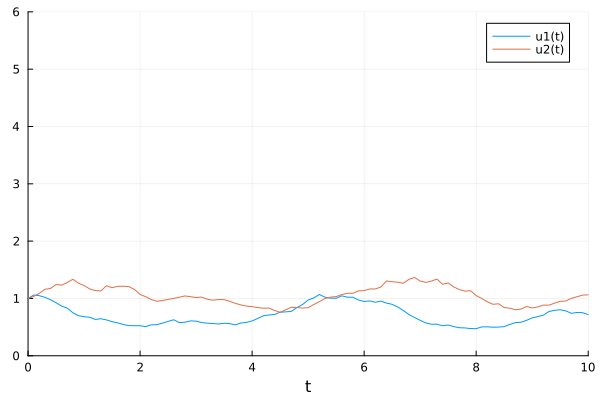

13.911200310897598

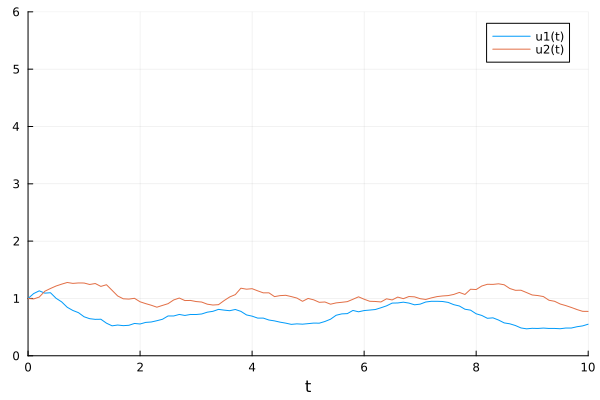

16.256074553700365

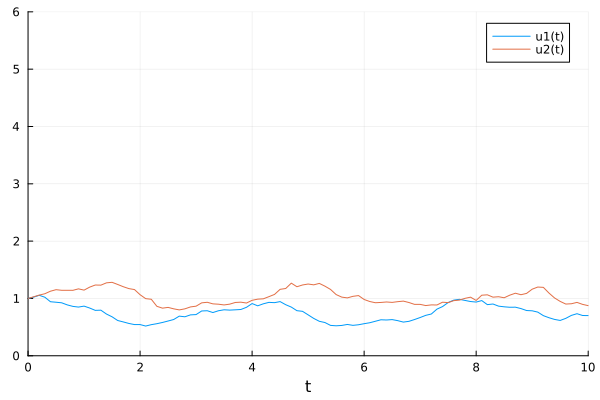

20.53377470364785

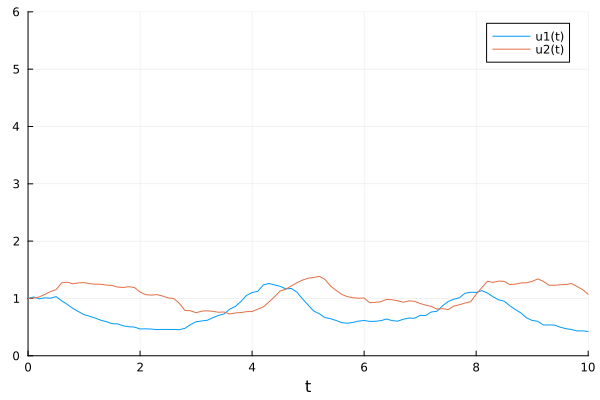

46.45753820770557

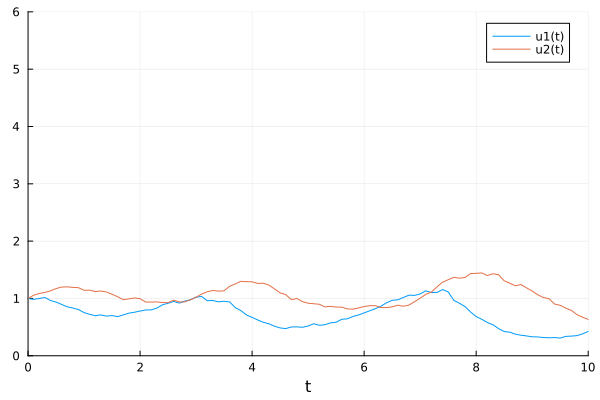

14.56222194106361

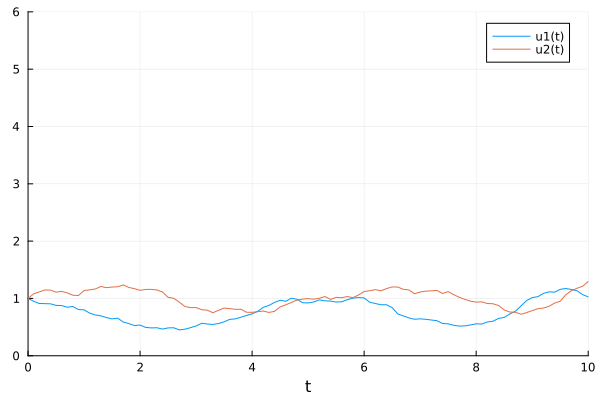

27.387811961399947

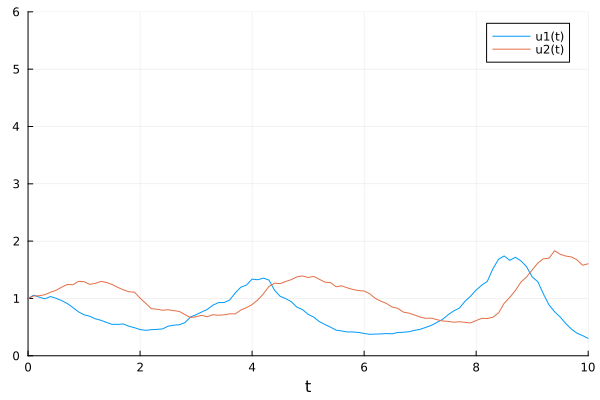

23.80181122451867

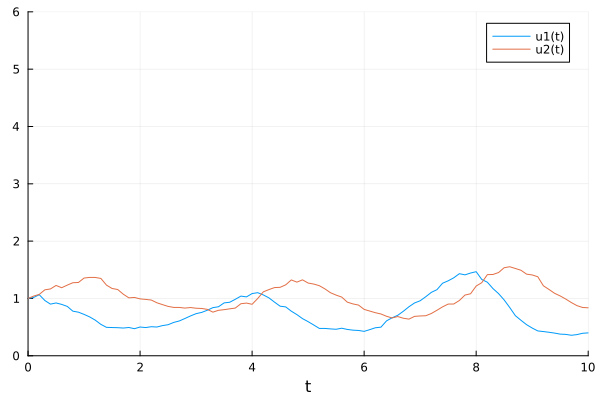

7.7212195166816375

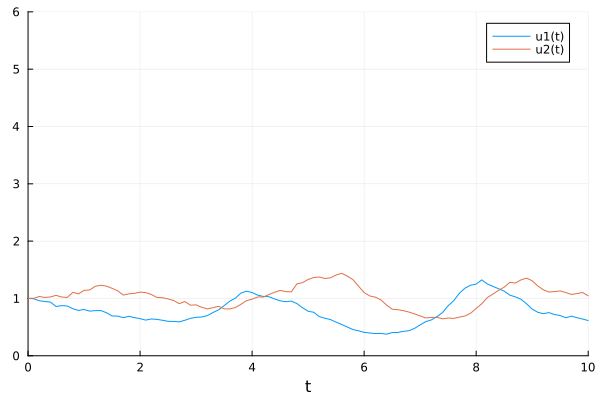

19.698500232473005

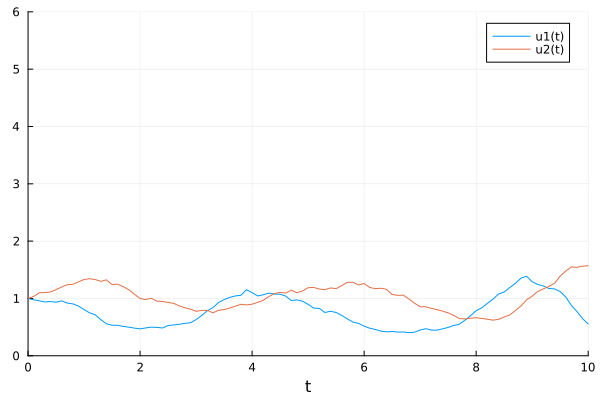

13.688347133921447

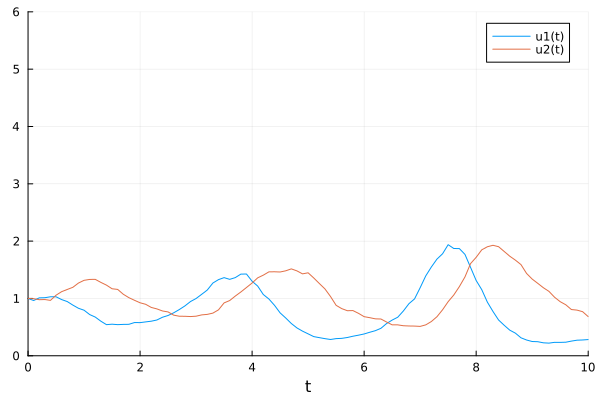

6.952710289225399

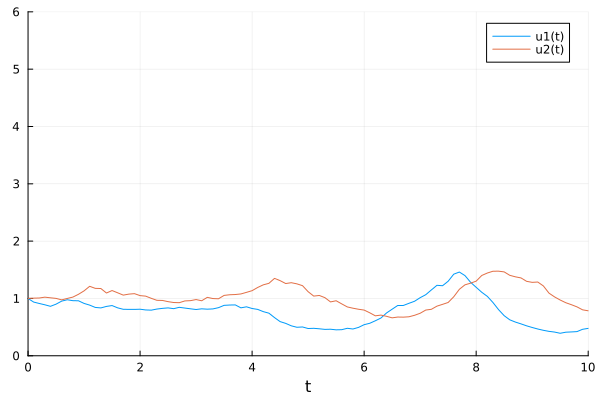

3.236659562911717

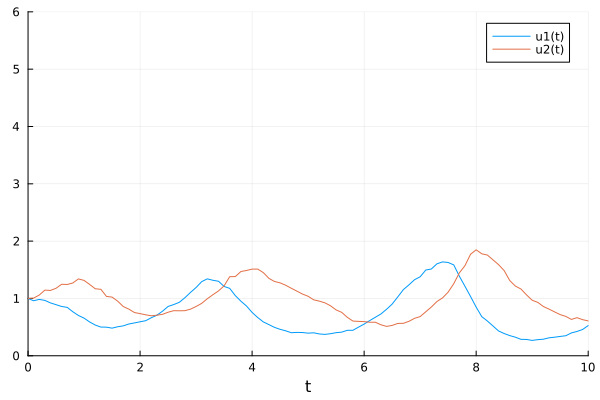

13.908673049199635

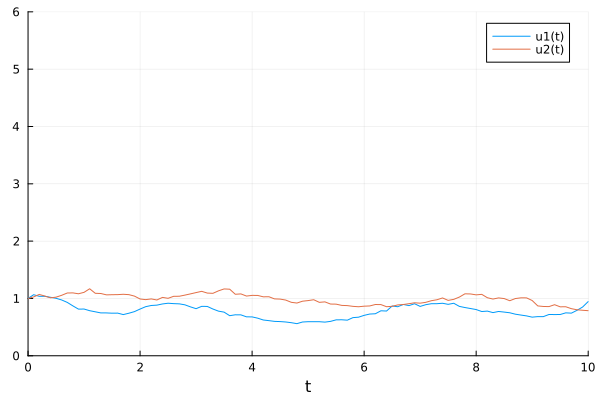

7.189707732039164

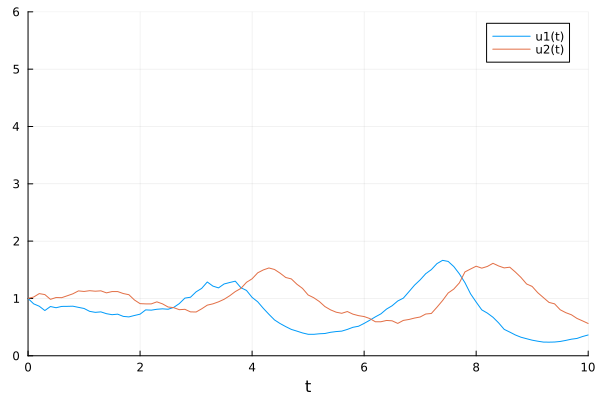

10.823907185397871

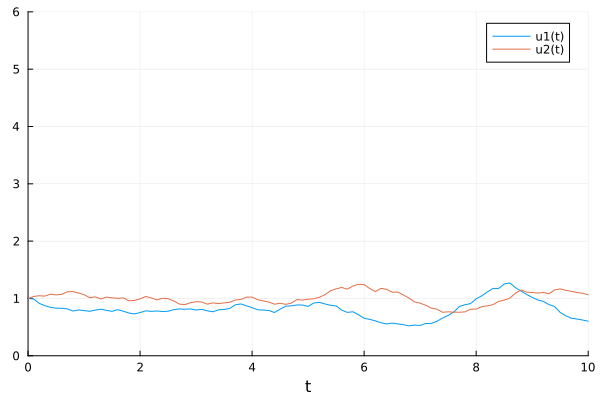

6.165853322778598

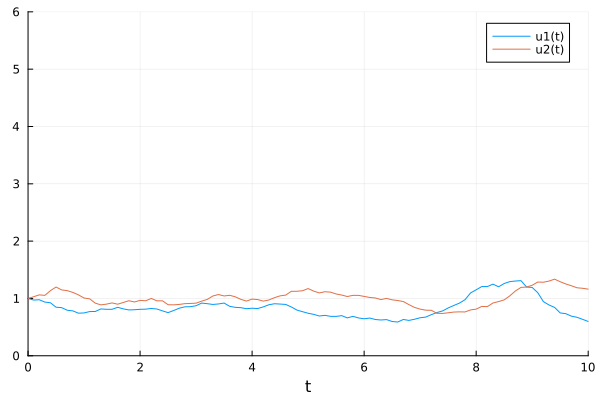

12.761123808712526

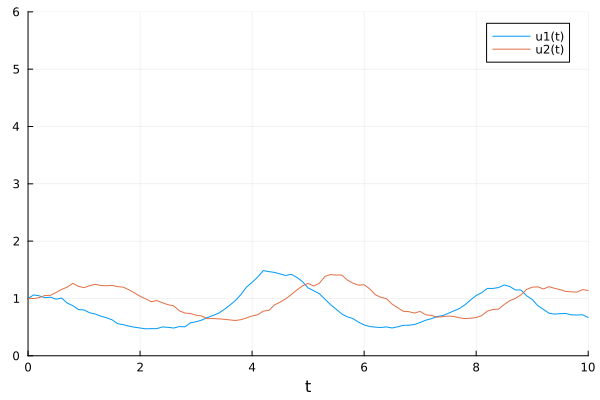

7.219093029292953

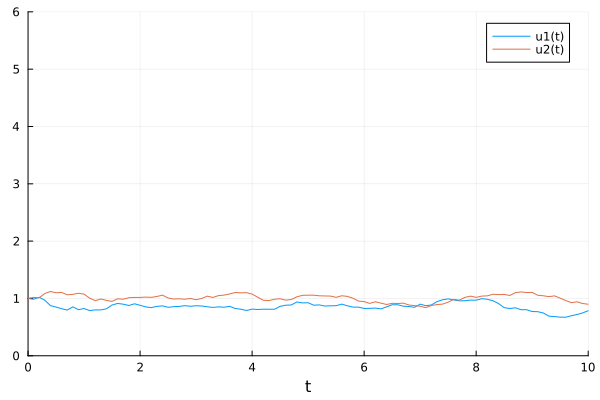

11.430368572593684

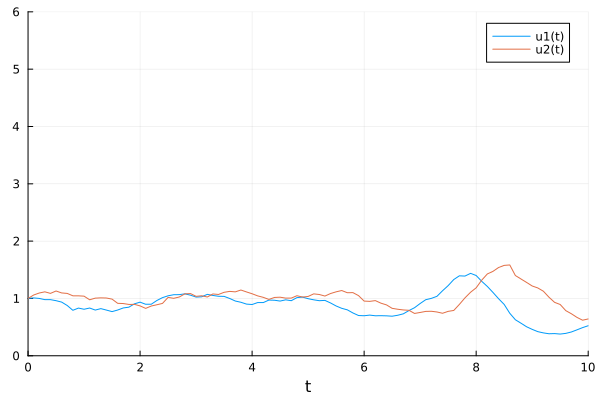

3.857219625556689

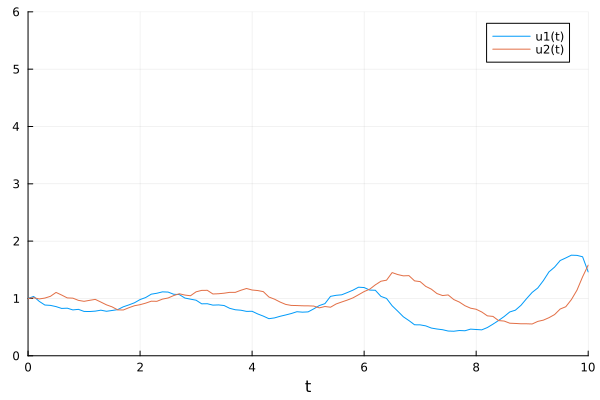

6.201837311791465

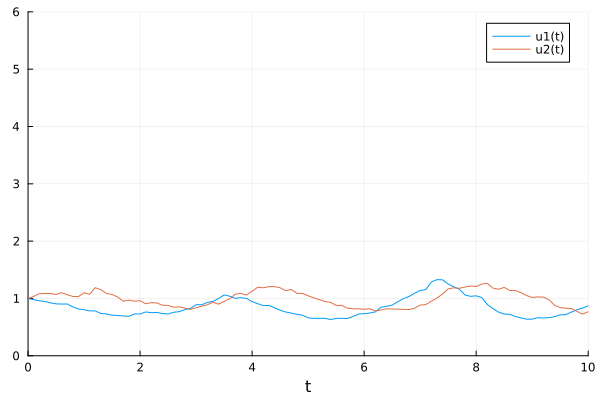

5.3759910252953125

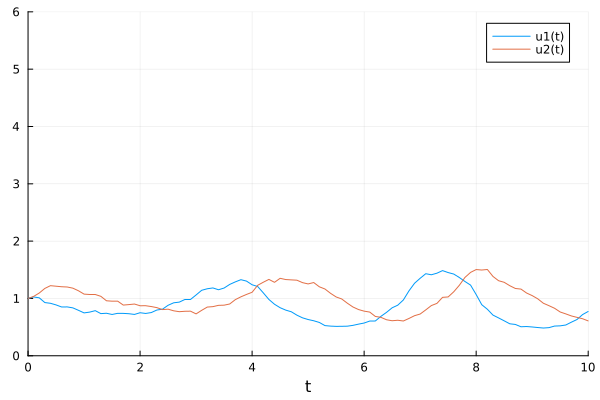

2.81625780832799

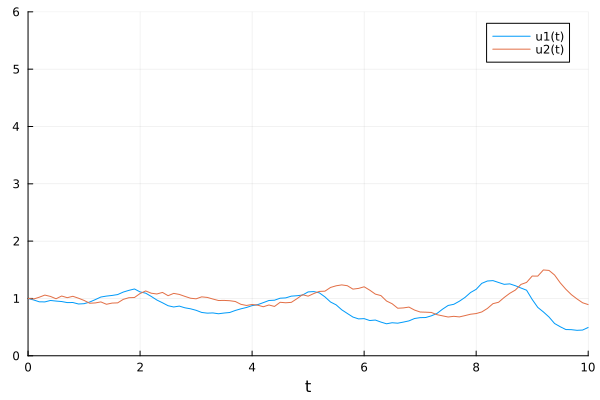

17.39292713005592

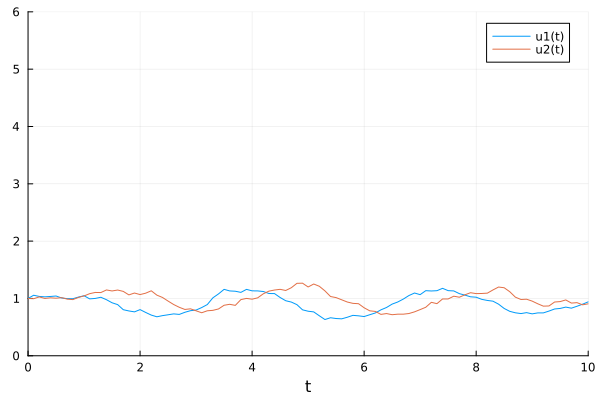

5.031160776671605

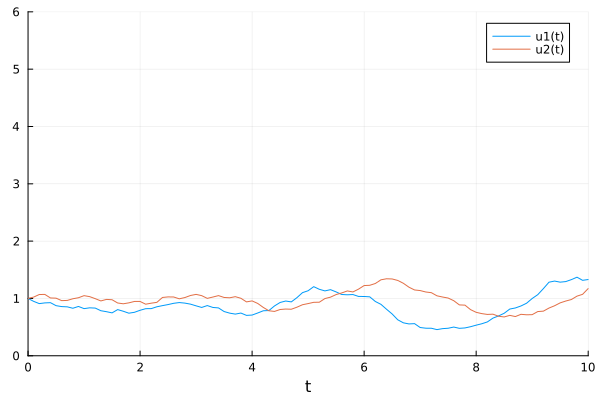

16.177414664827914

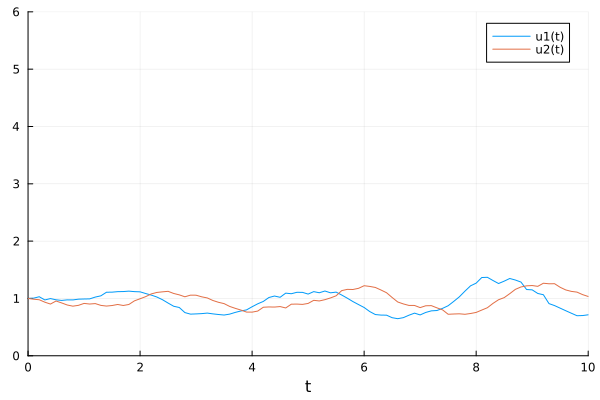

3.7659818639650546

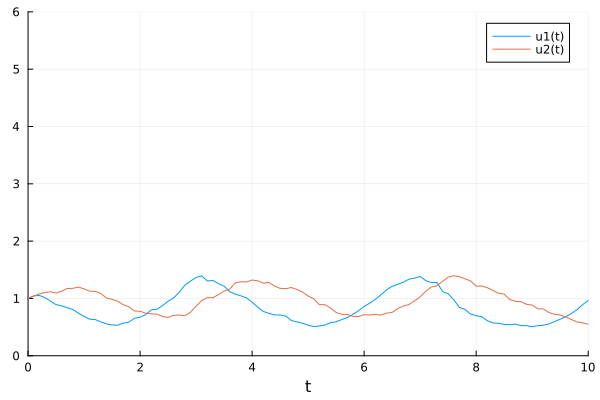

7.723831264368435

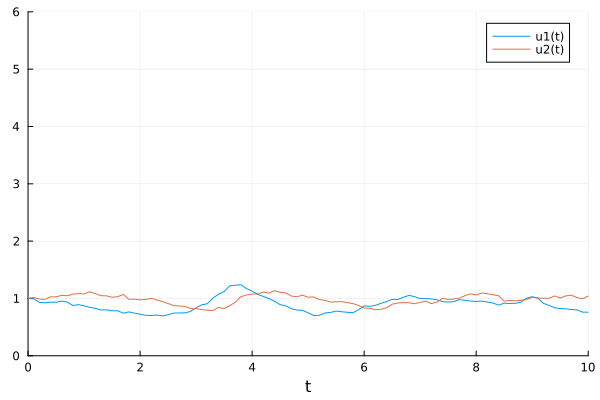

35.152942807160755

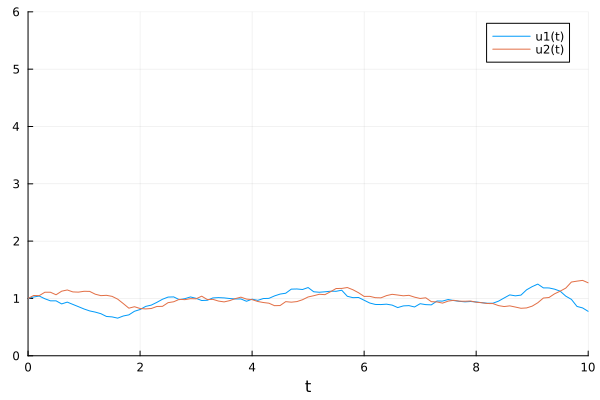

12.701084004306255

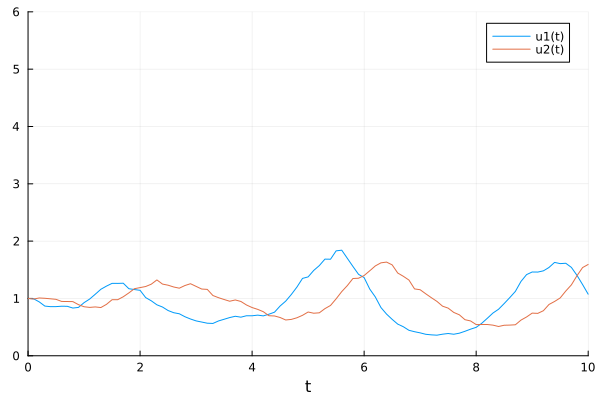

15.300643511557558

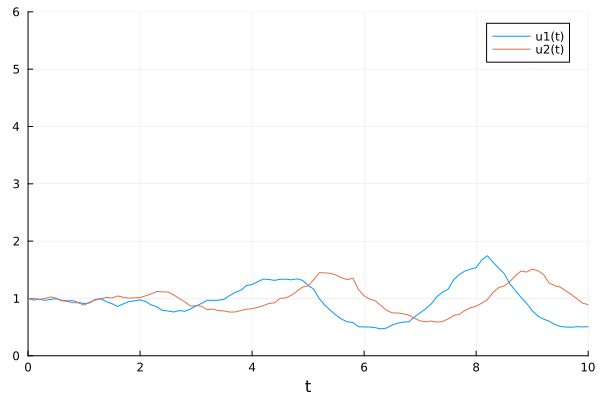

27.28126829359441

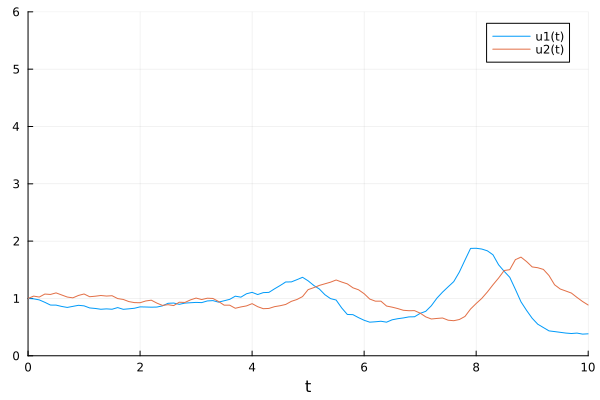

2.7130886382389114

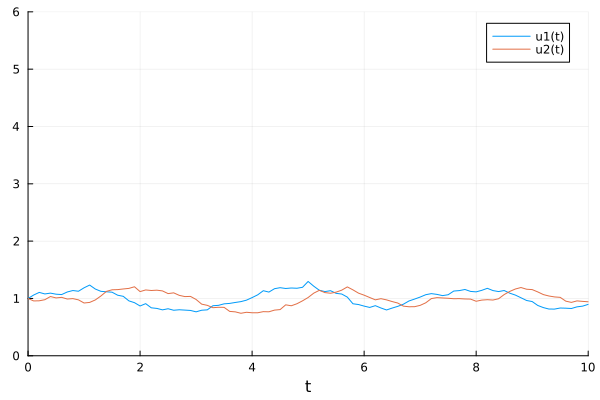

16.879790362715532

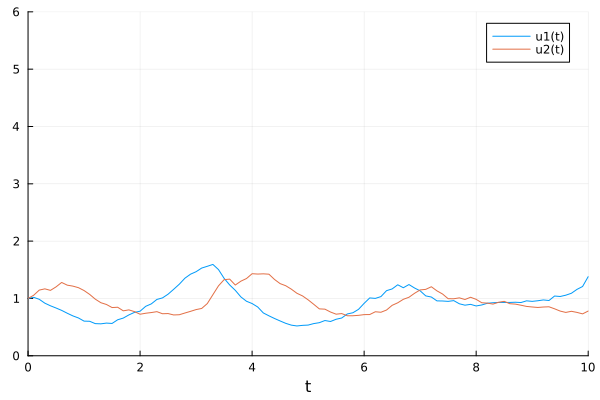

8.244217780997815

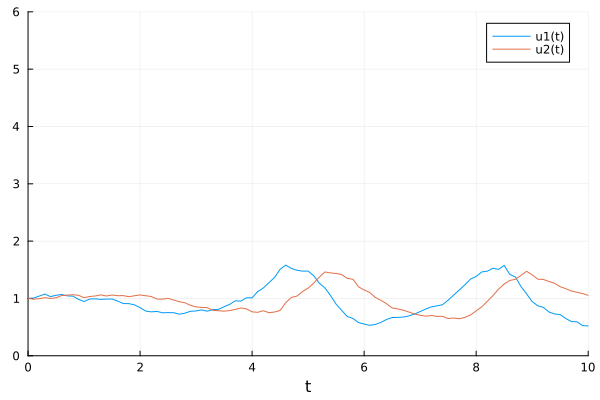

2.826657218276446

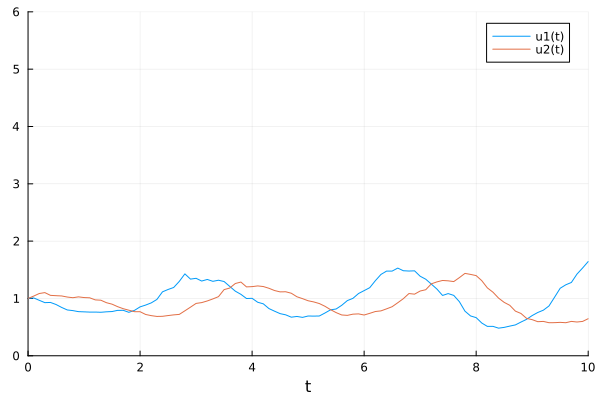

5.684117608201383

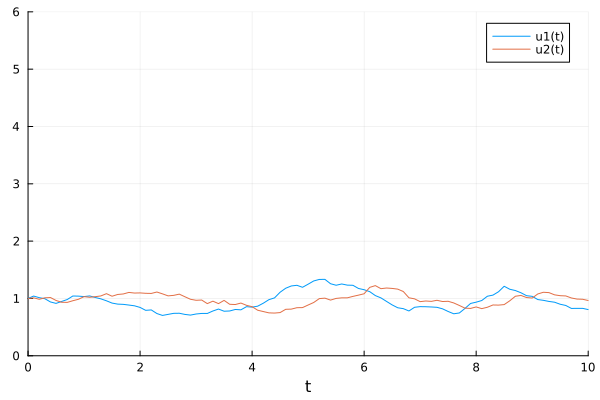

16.760176432185443

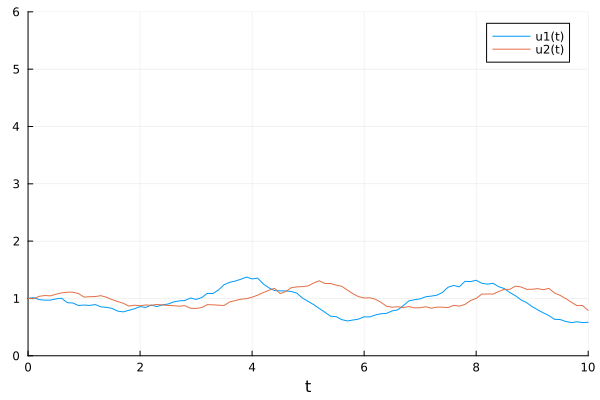

23.42659100035404

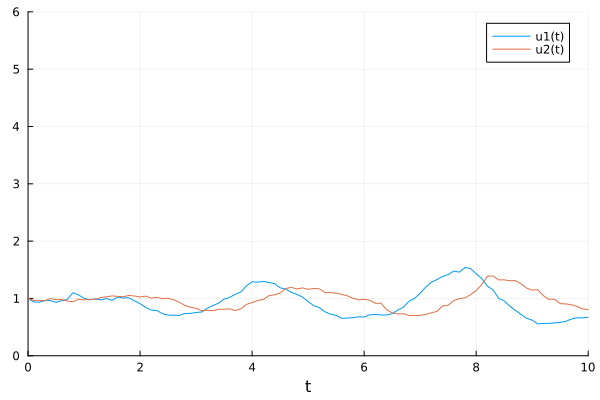

4.617097975336776

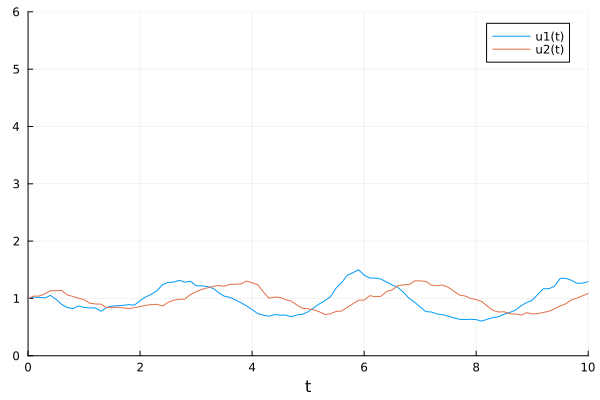

13.725238483921286

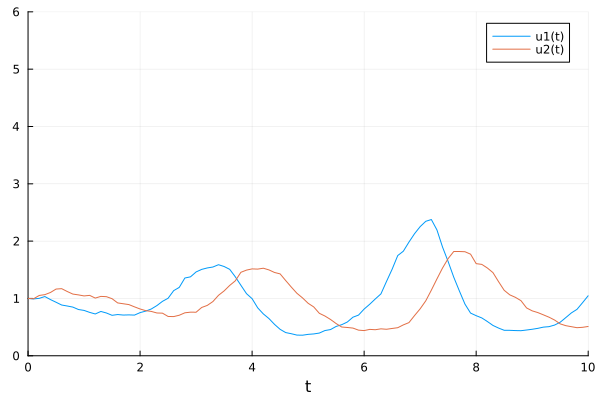

10.188070846536071

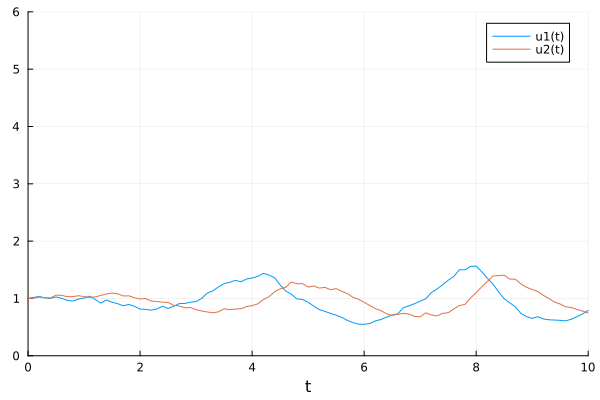

7.961252161568494

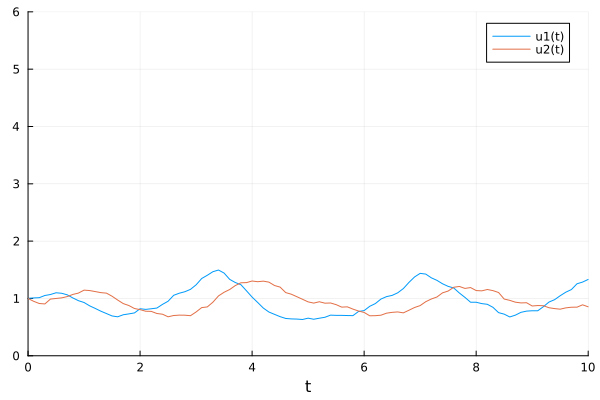

15.620710907106607

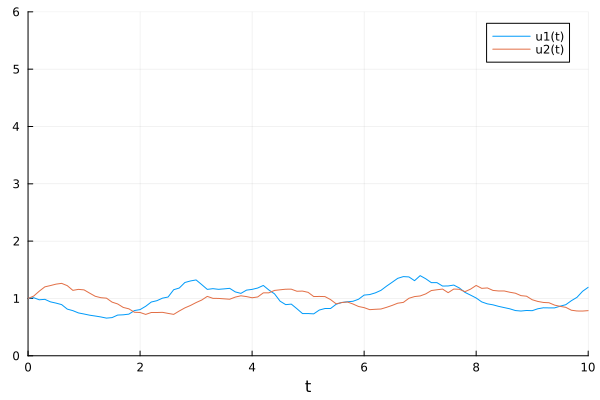

7.604251232247904

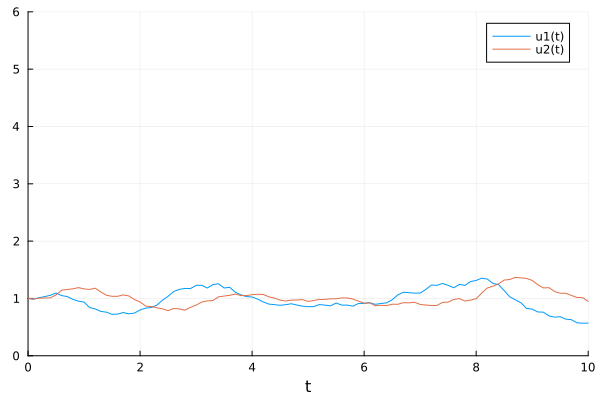

21.32326823114

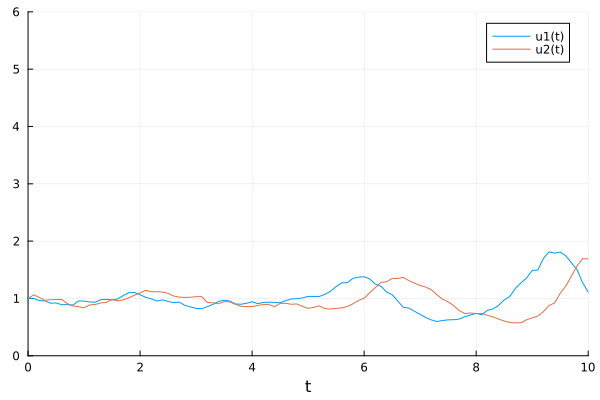

5.6186555505072855

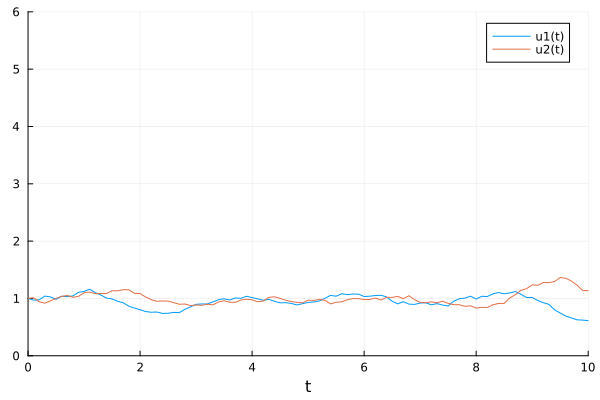

2.548755983737923

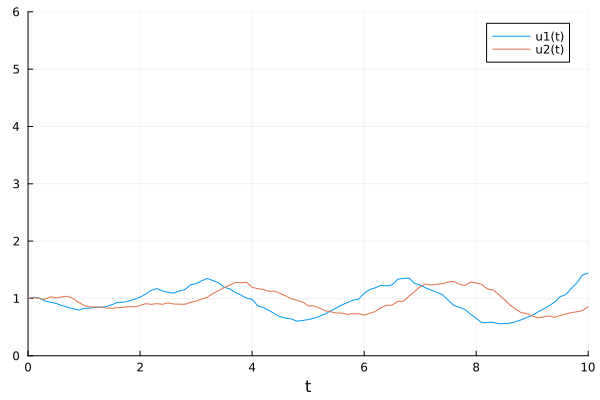

3.2461057125930273

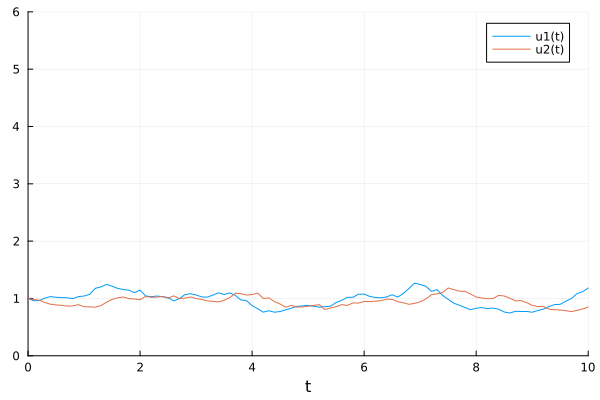

6.605571574882024

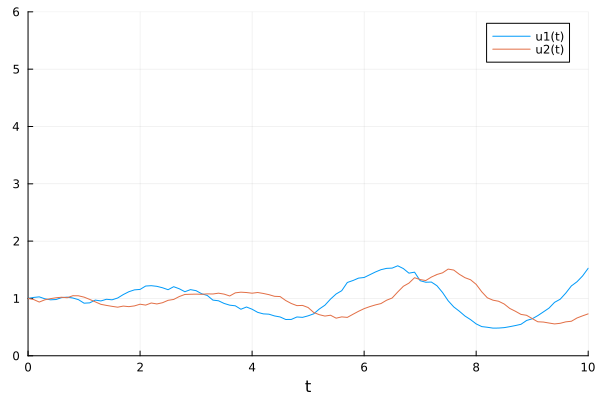

7.497482424529974

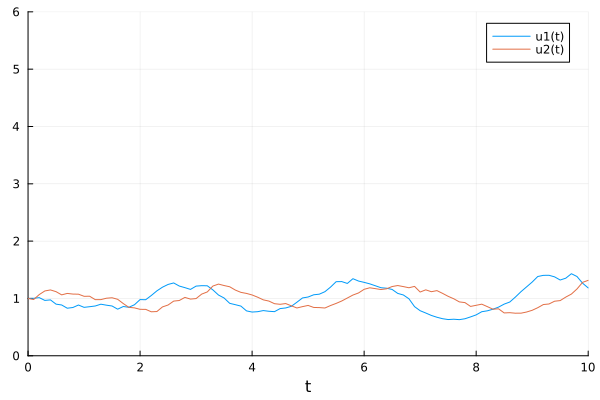

6.885577870099581

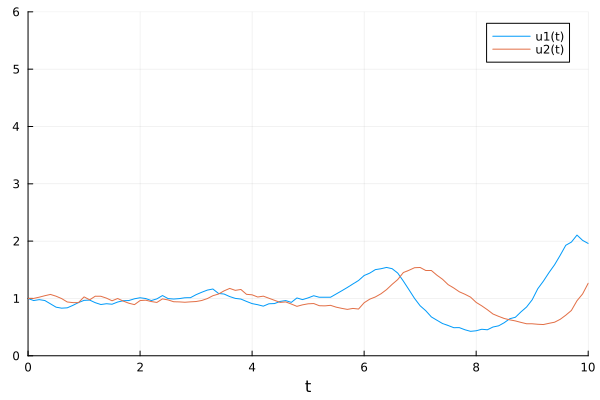

17.16646613419349

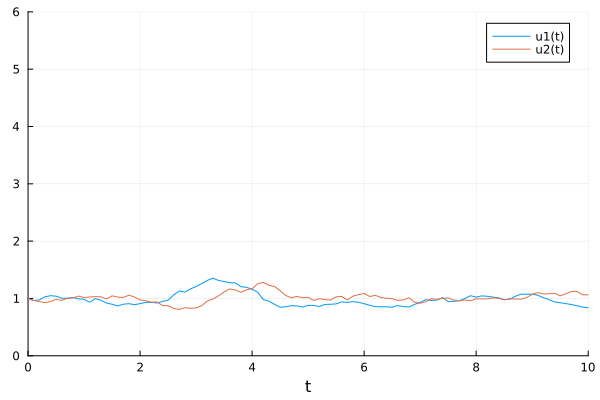

15.665538489140634

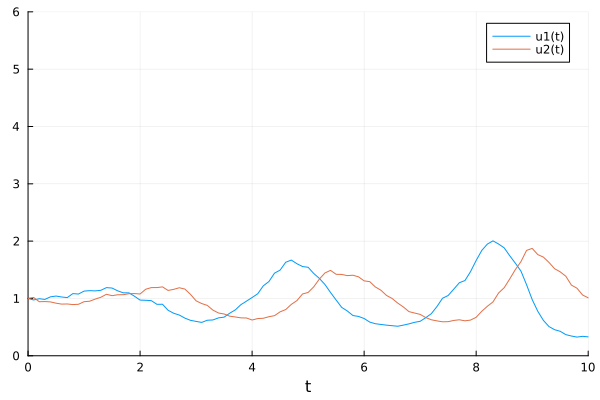

4.306366816186444

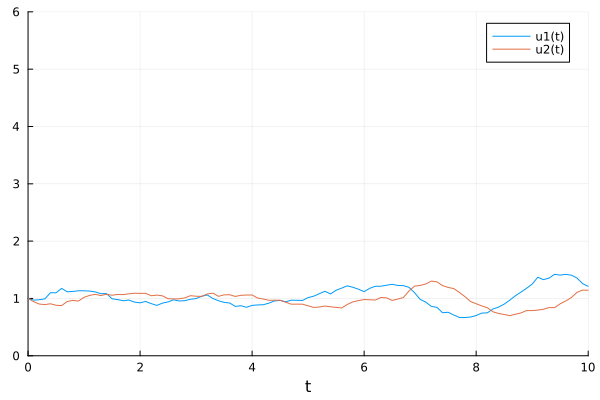

6.627437934831757

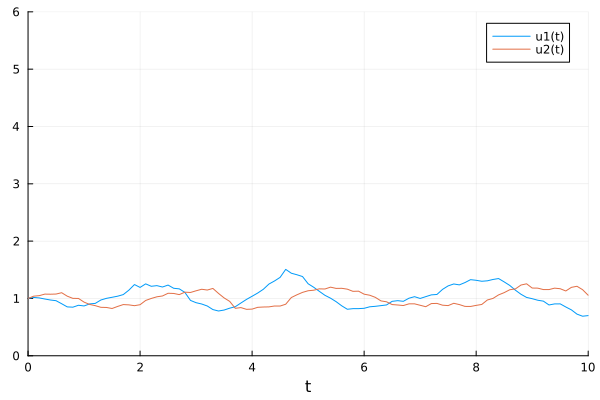

10.781982643083758

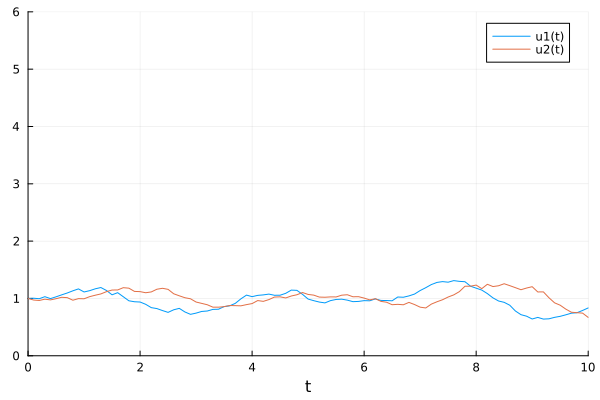

2.3805905709591957

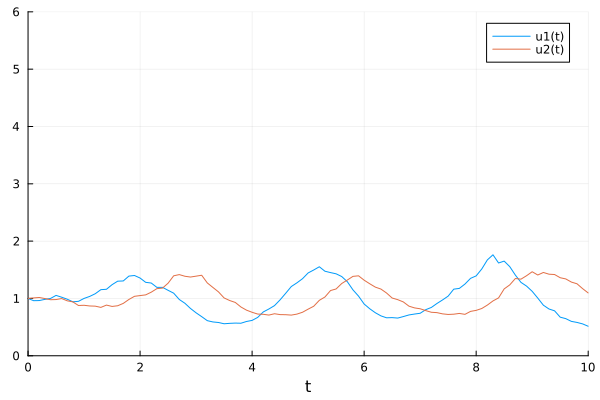

2.8922203532815463

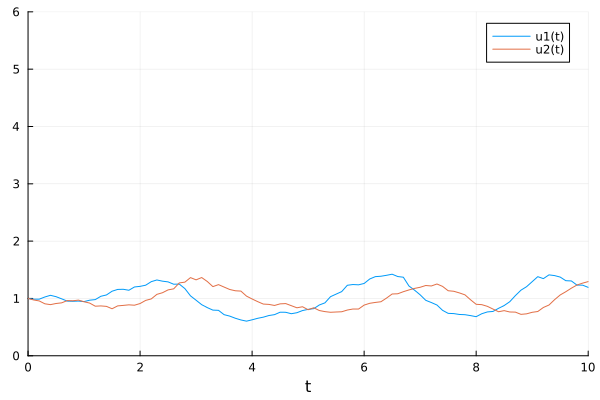

4.430555237663811

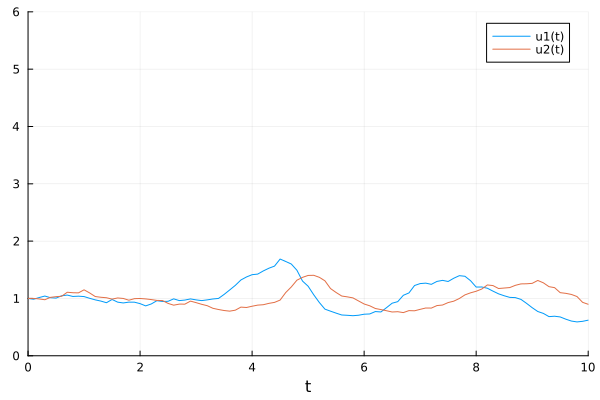

11.462833324606697

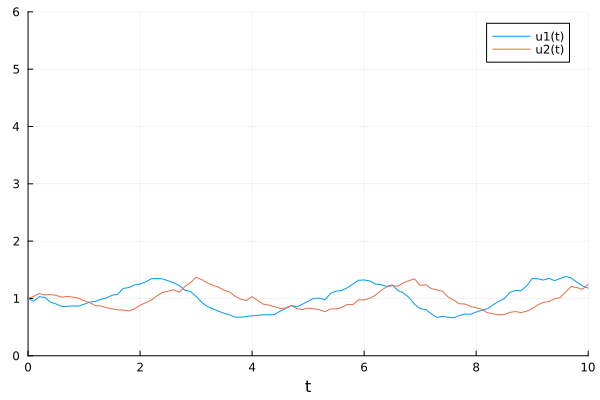

28.140447727610688

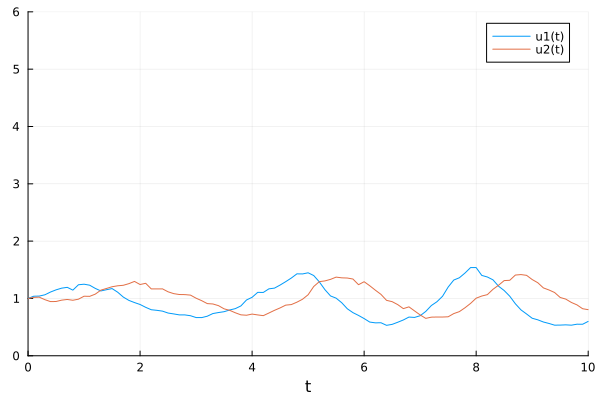

2.3805905709591957

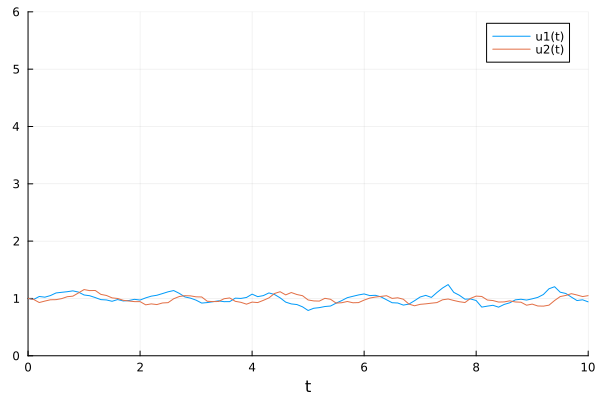

u: 4-element Vector{Float64}:
 2.422543246445382
 2.433123651108404
 1.299648548731134
 1.292801325824013

In [55]:
adtype = Optimization.AutoZygote()
optf = Optimization.OptimizationFunction((x, p) -> loss_sde(x), adtype)

optprob = Optimization.OptimizationProblem(optf, p)
result_sde = Optimization.solve(optprob, ADAM(0.1),
                                callback = callback, maxiters = 100)

4904.337126690064

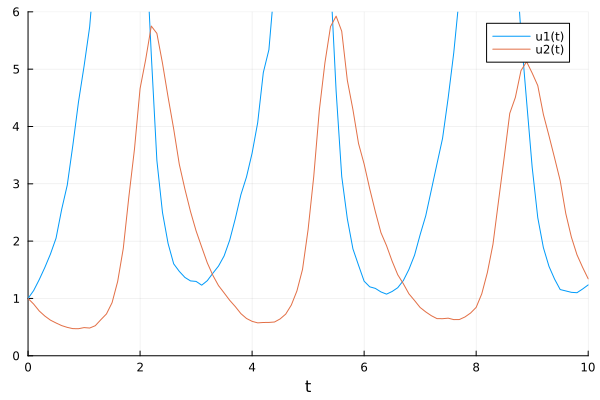

8061.638939665425

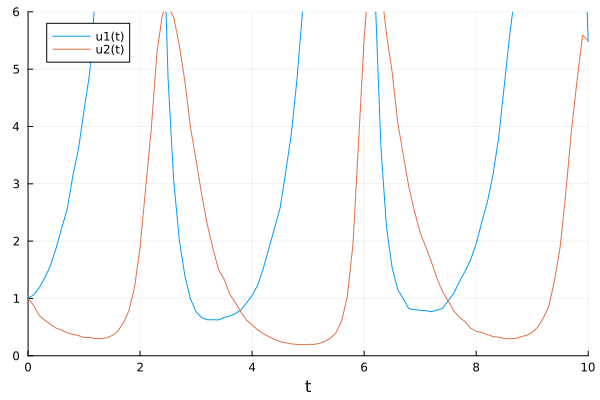

3726.7878747442055

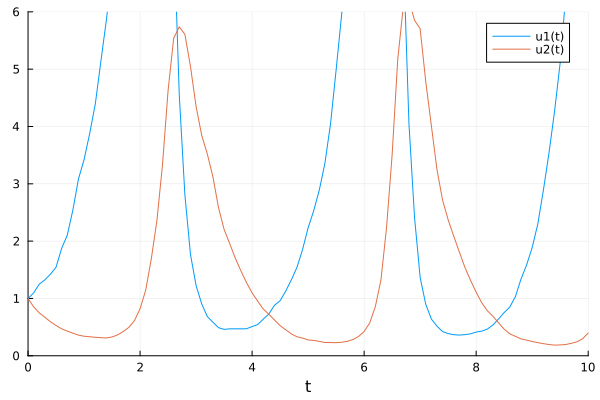

1761.0439102247637

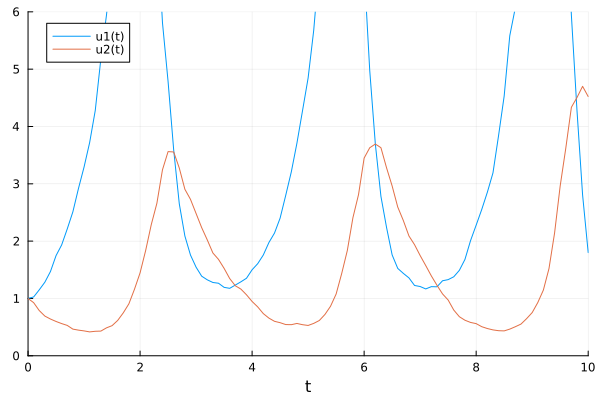

1295.8754840738245

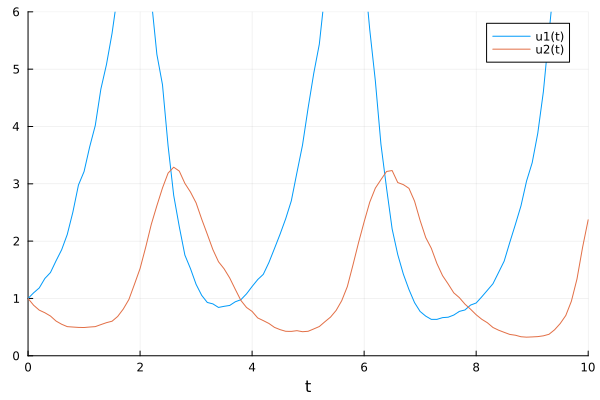

650.3997247926521

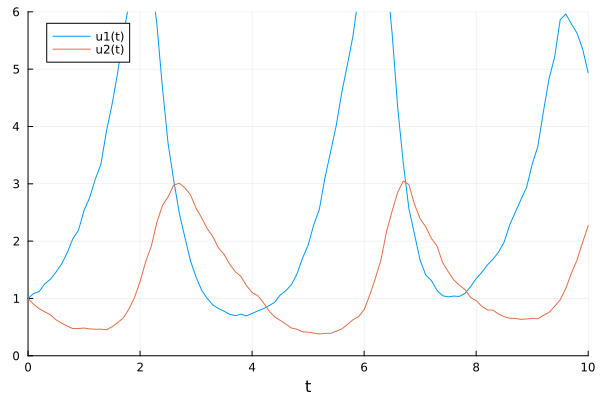

552.9930849063703

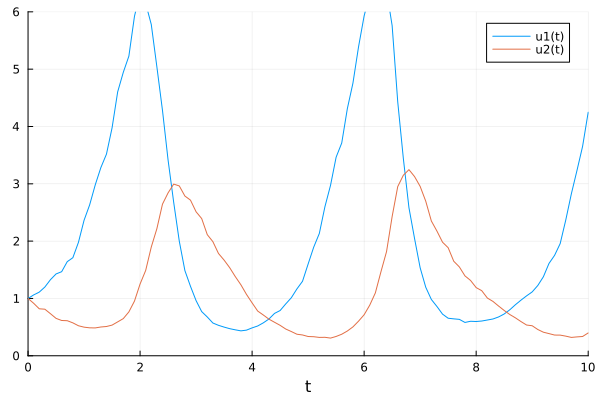

382.1734113544354

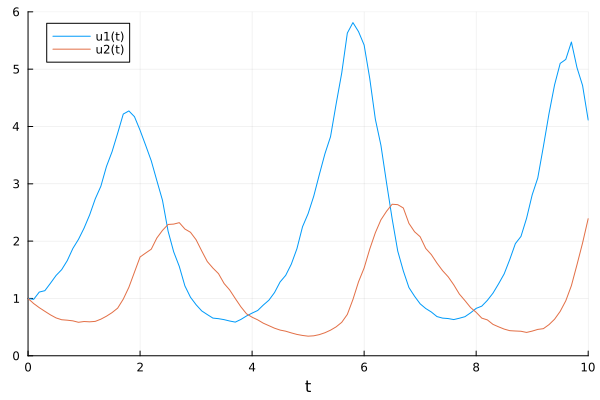

98.62272103212152

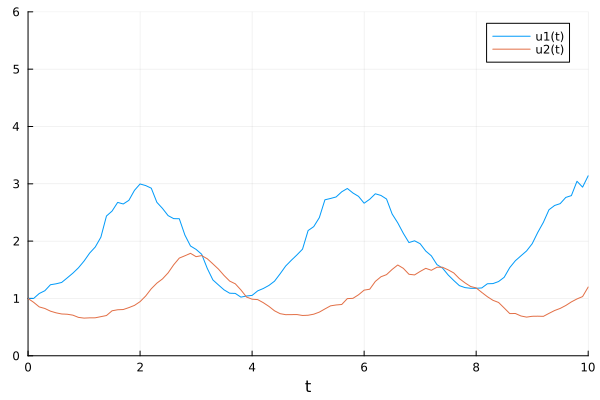

115.78655368187273

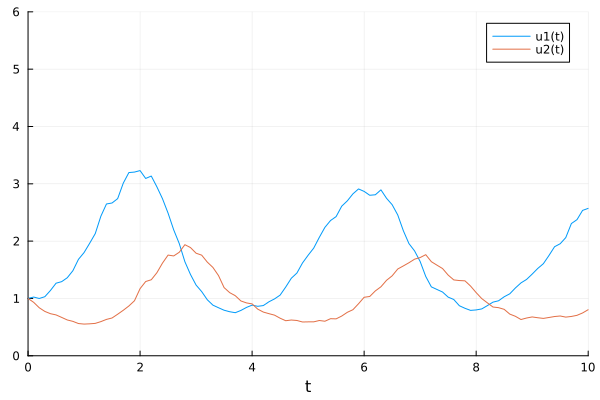

67.50545512234629

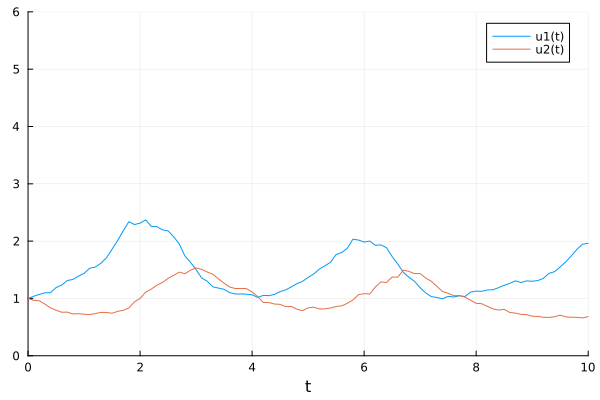

32.84621187493184

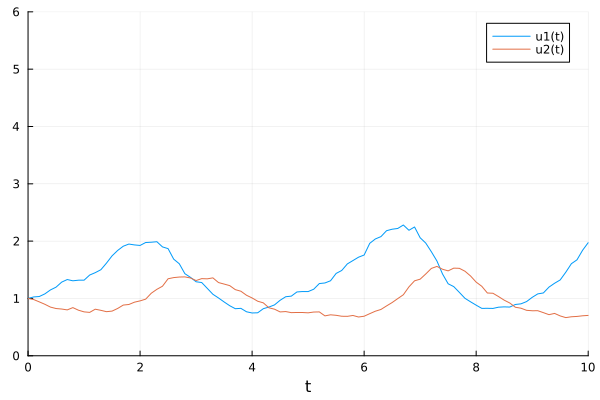

15.374373642050301

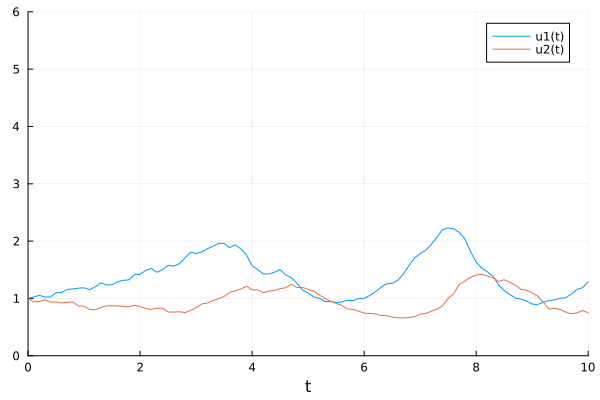

11.952545070435335

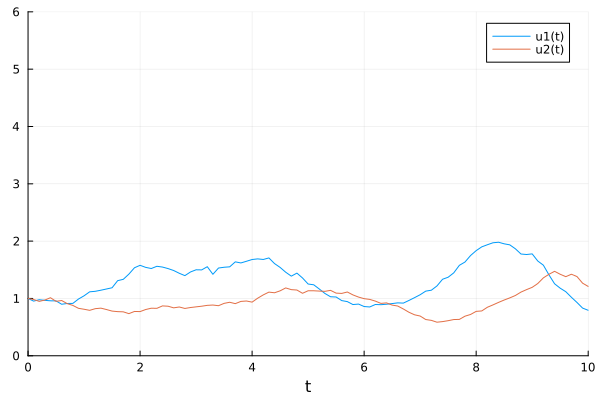

34.34944077738963

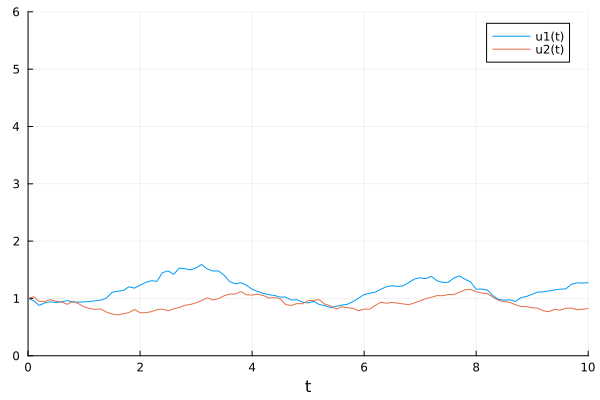

21.170775439773692

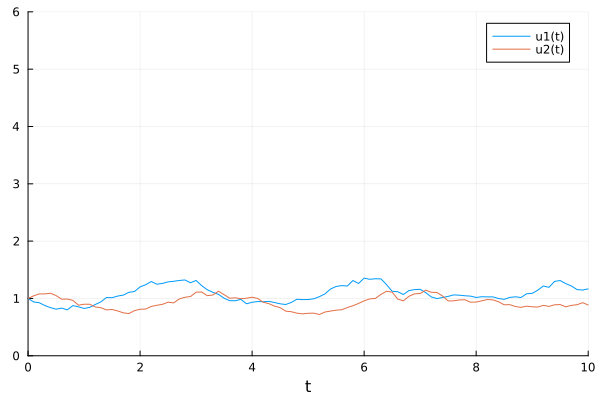

6.274434953601711

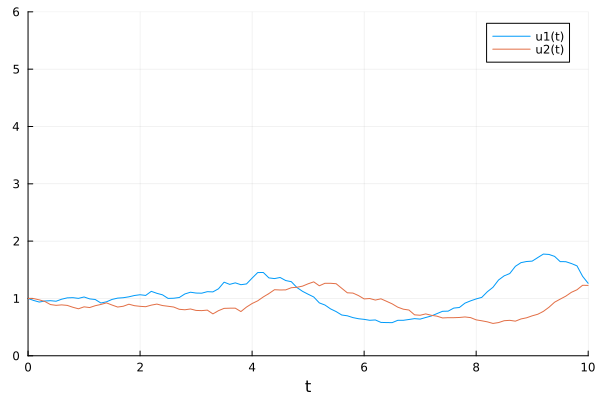

15.346753169308489

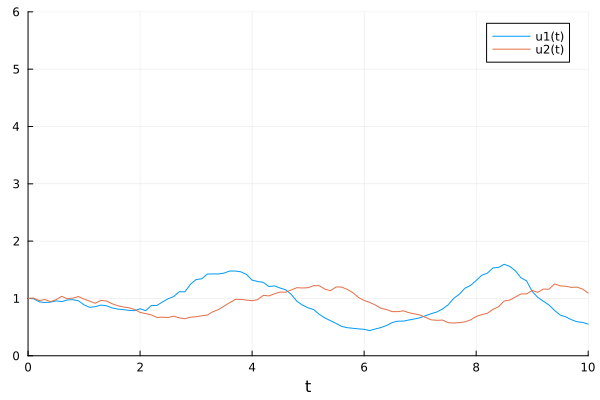

56.75035636025918

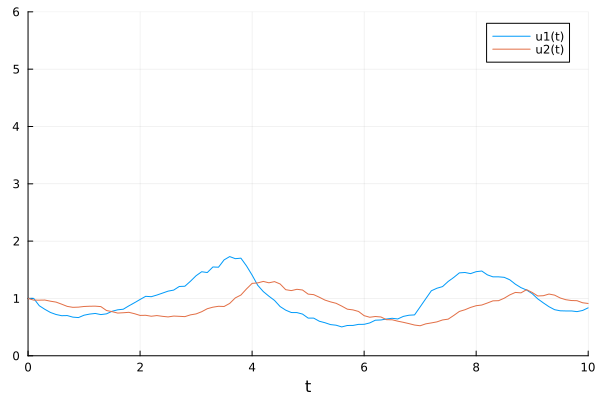

5.881999813745467

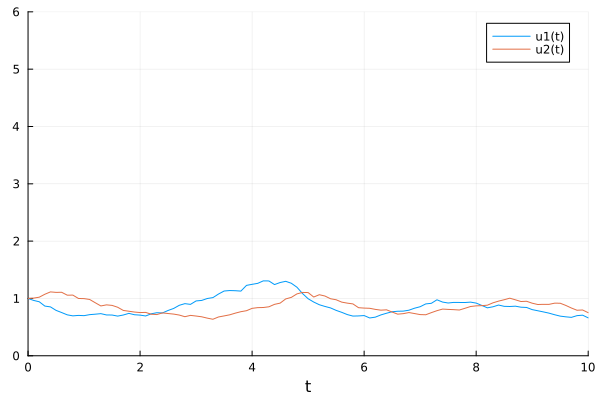

11.645206651709866

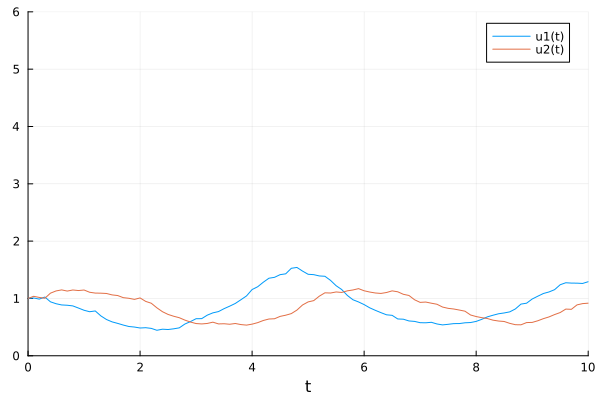

9.654854087611605

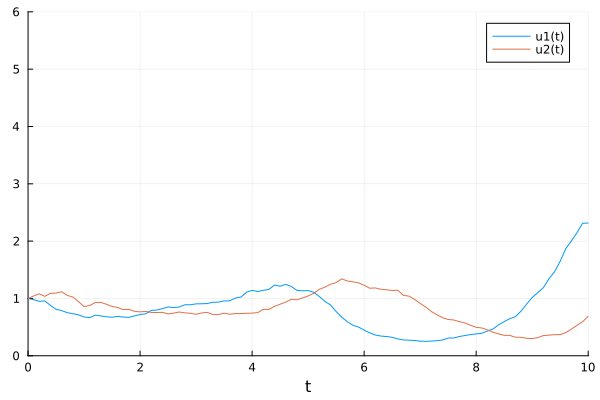

28.228440408385133

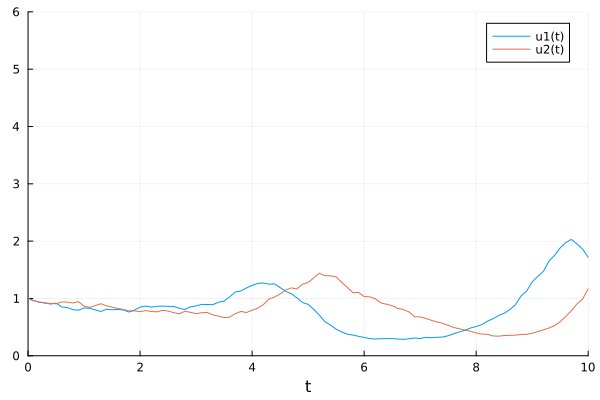

24.825050377326807

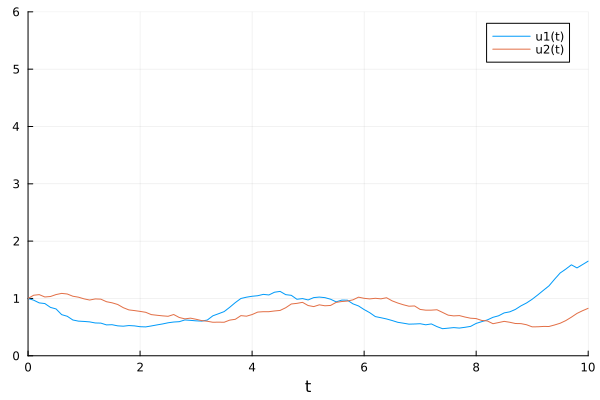

13.05568981756754

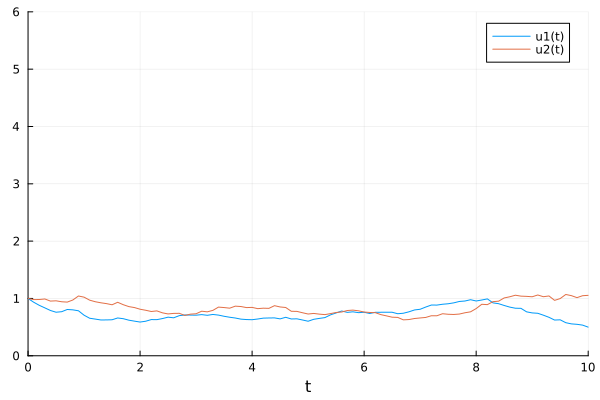

29.384040348510126

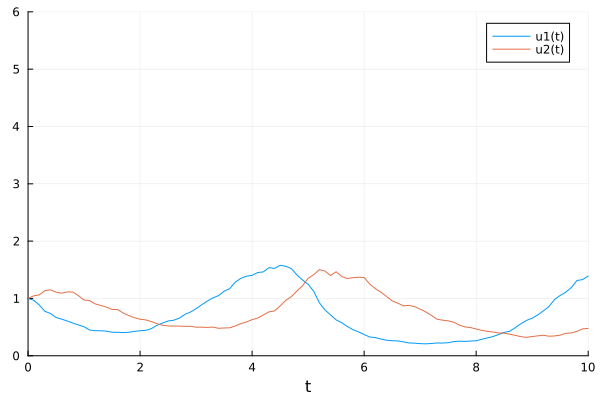

23.55991298146257

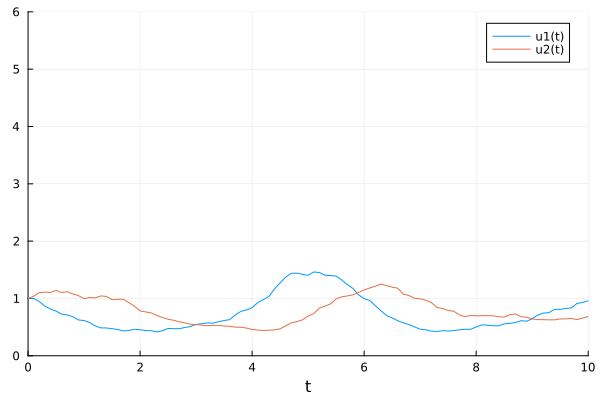

18.23747621568798

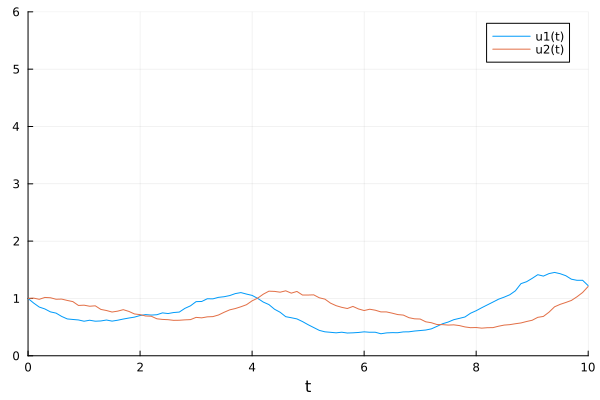

15.828687488381357

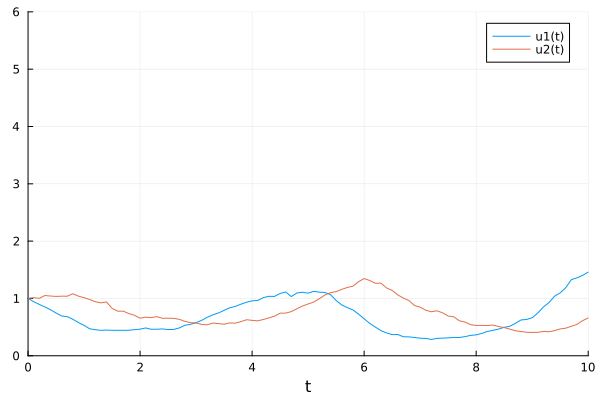

39.442946936525466

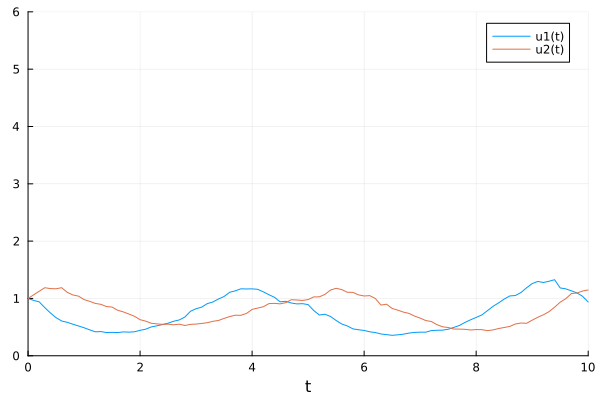

25.224857320738312

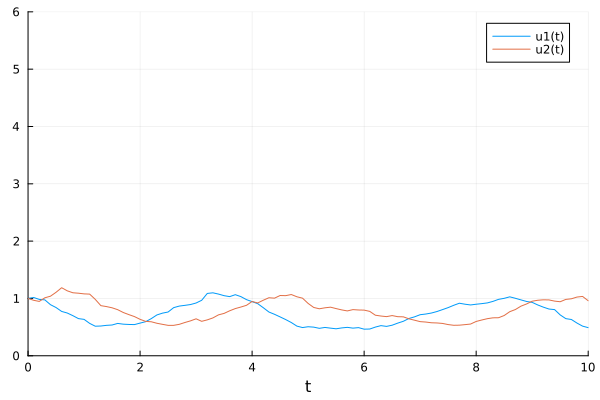

35.02811254926559

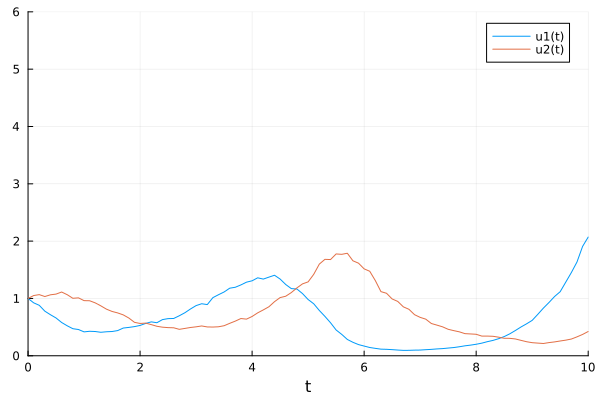

41.742053495349616

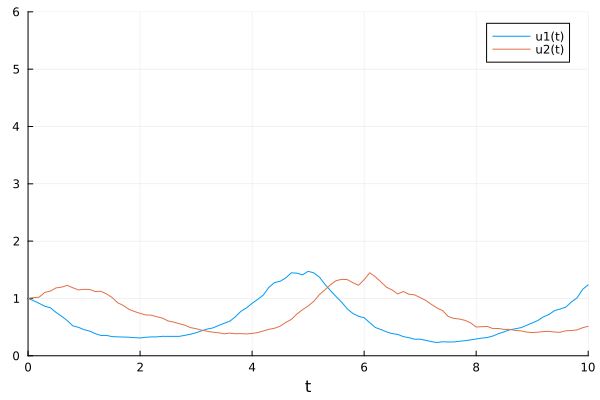

31.25615978998933

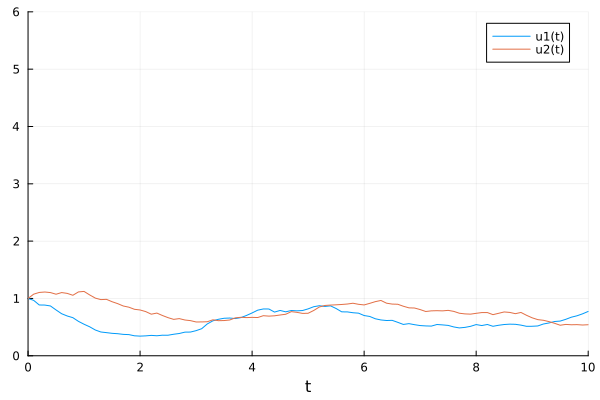

18.68209262097368

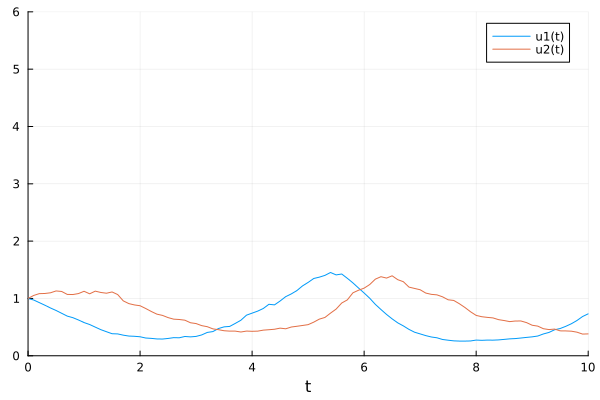

30.6267765467524

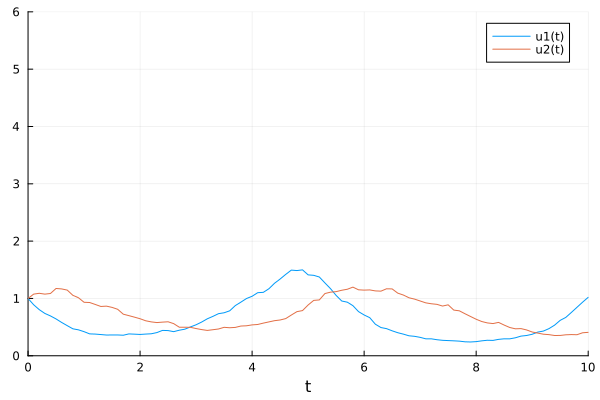

32.699387096421034

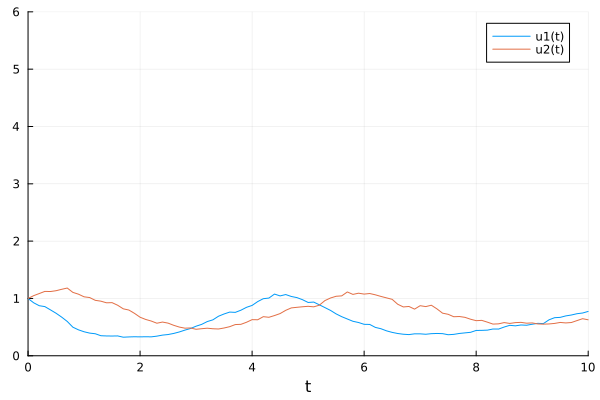

30.27344271997133

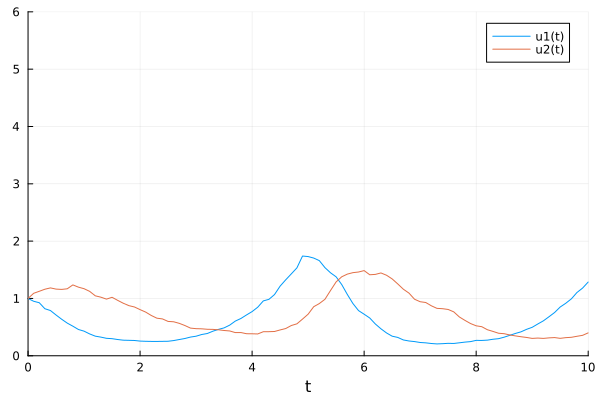

30.73961839075583

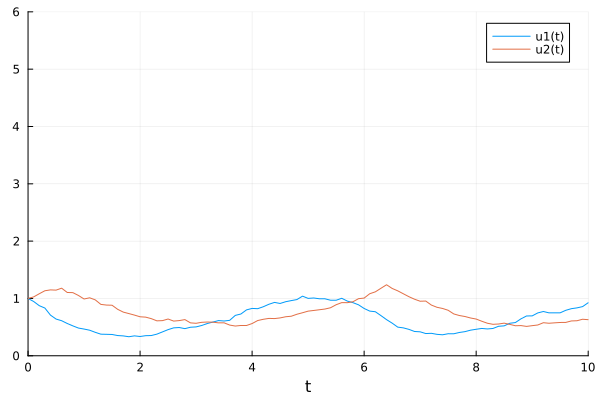

48.606749268957564

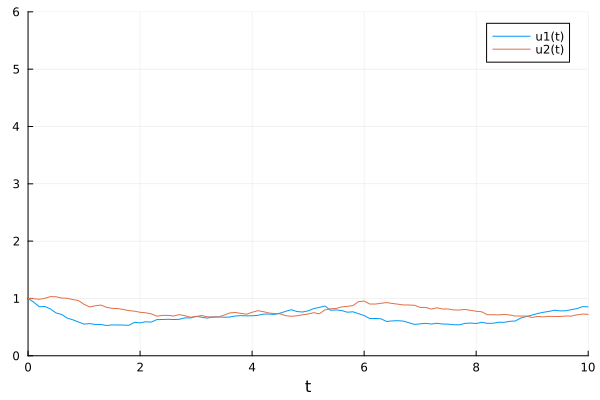

25.835449713645303

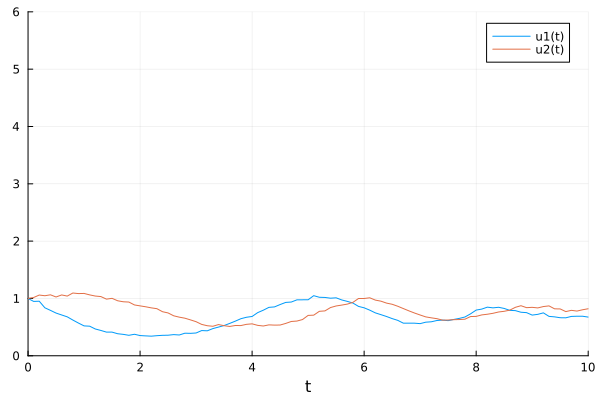

38.53948250527702

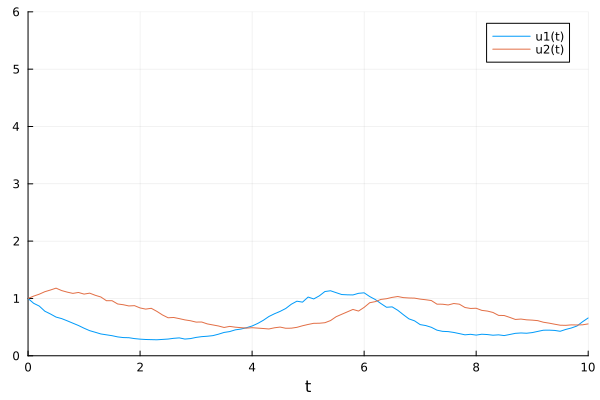

27.01569720846511

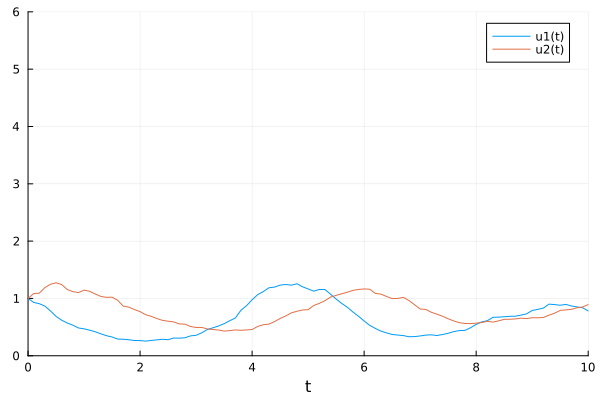

25.876936374118145

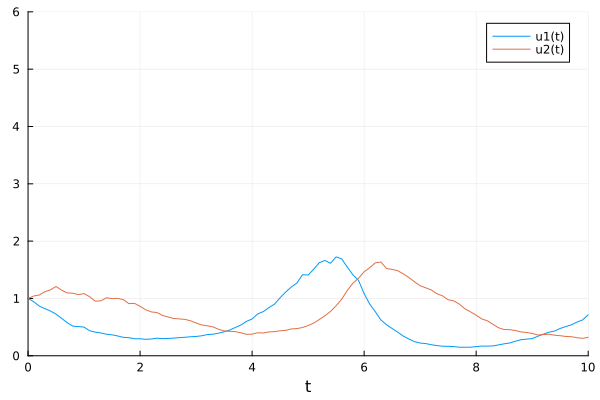

39.26758366123186

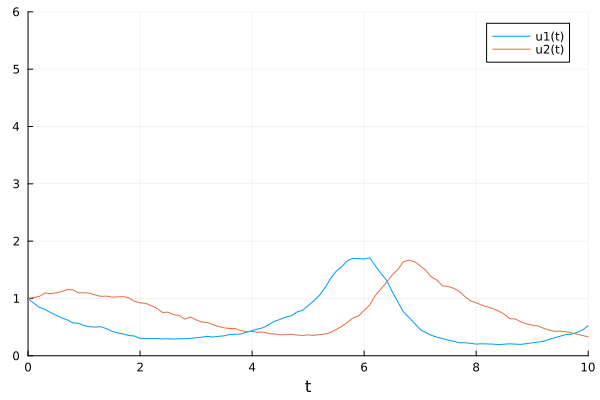

28.537001584413908

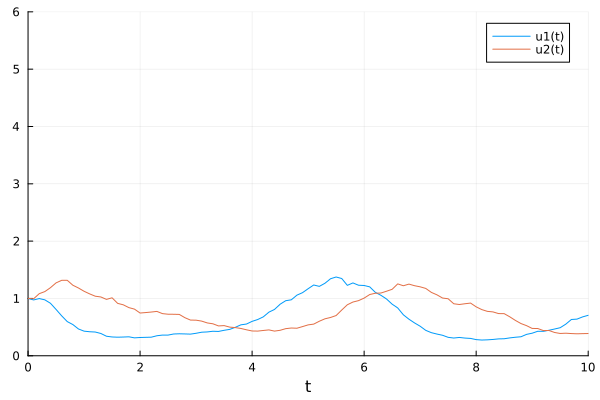

30.92895475883268

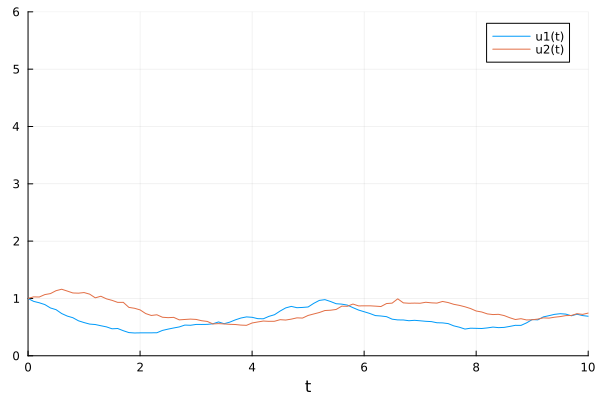

15.422934643245057

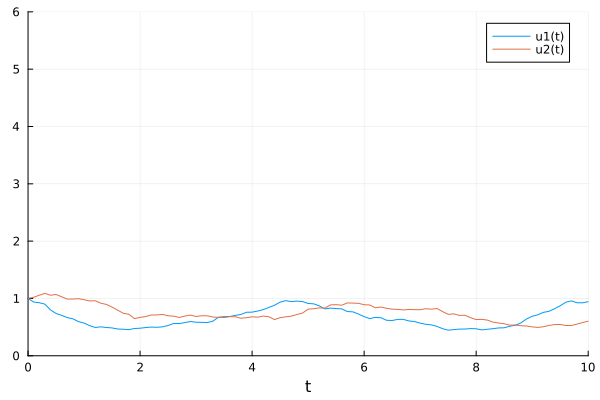

31.981927415780827

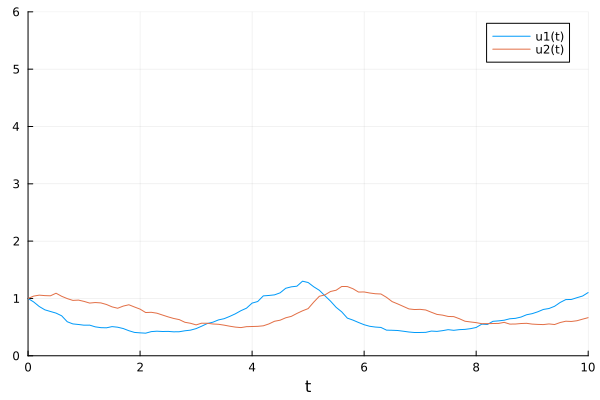

44.19934843219792

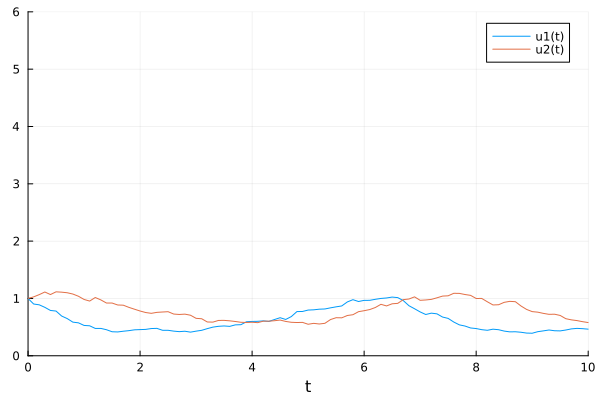

75.92657539761245

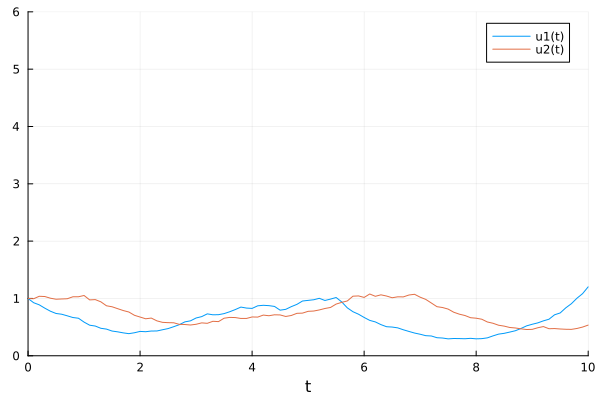

44.65787418408777

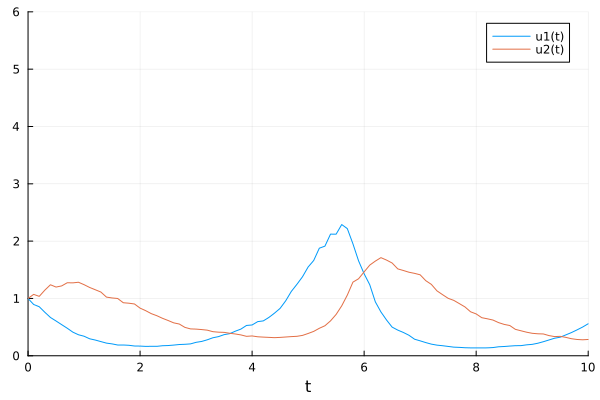

31.929773372171915

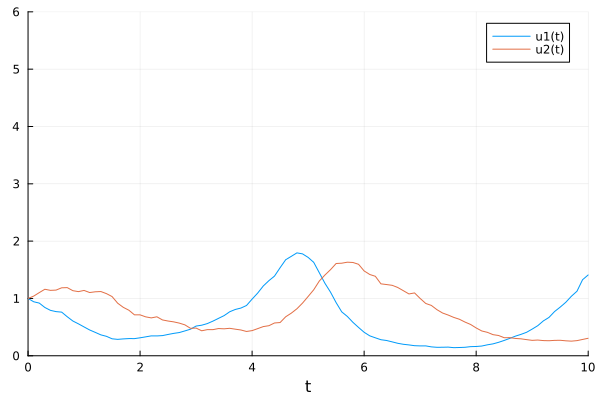

38.566409245608305

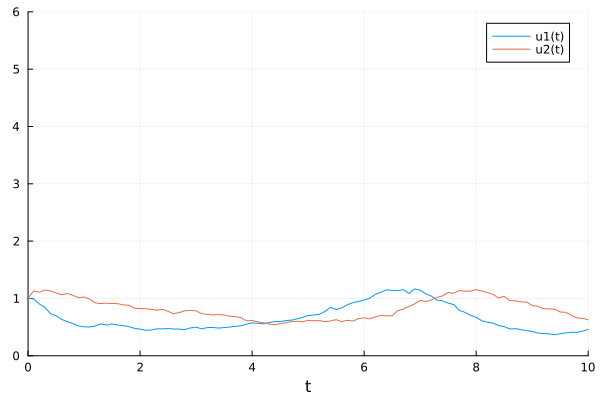

35.09408104287013

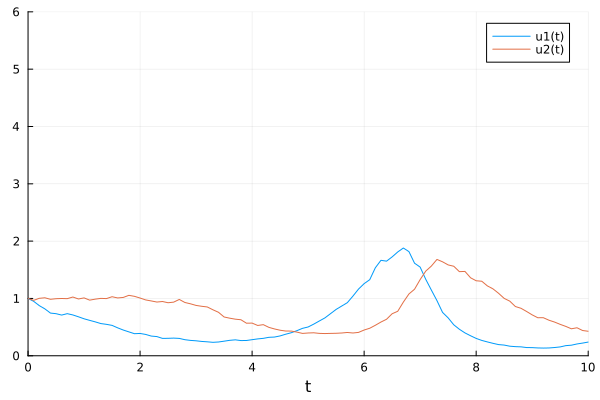

36.43299142002478

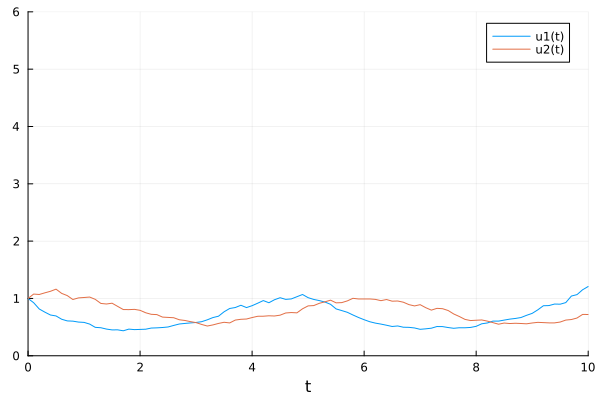

72.5973555515081

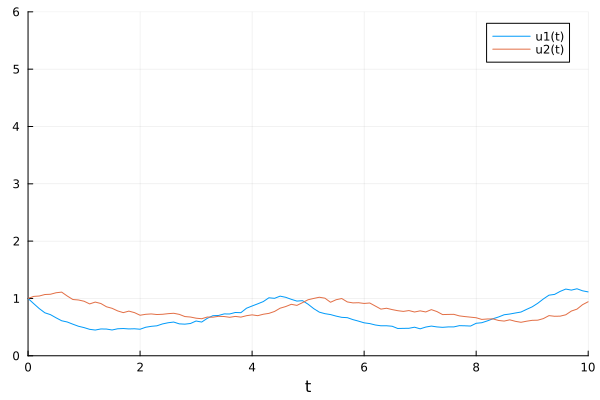

20.453060583398827

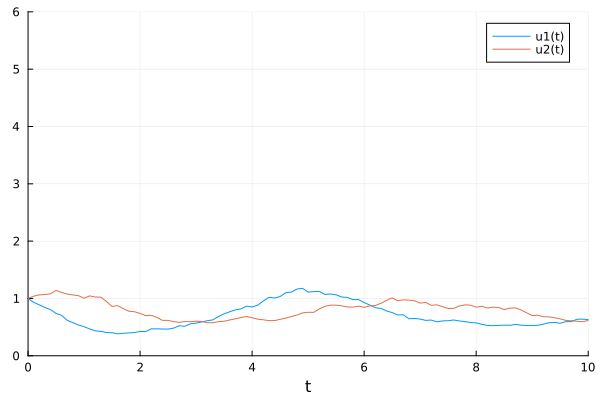

19.70741248819622

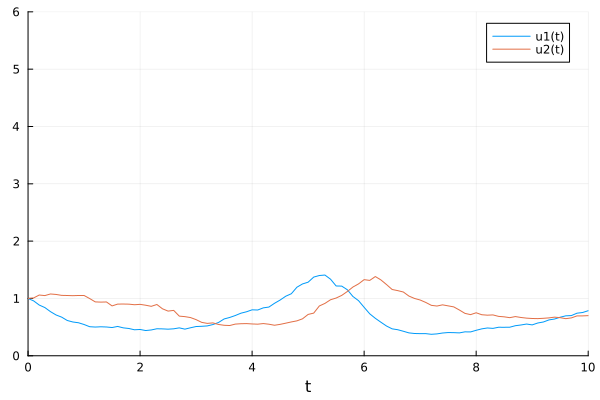

25.625299331892577

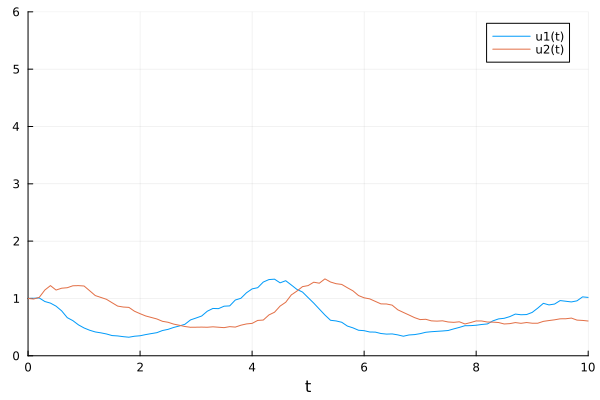

20.25463504484183

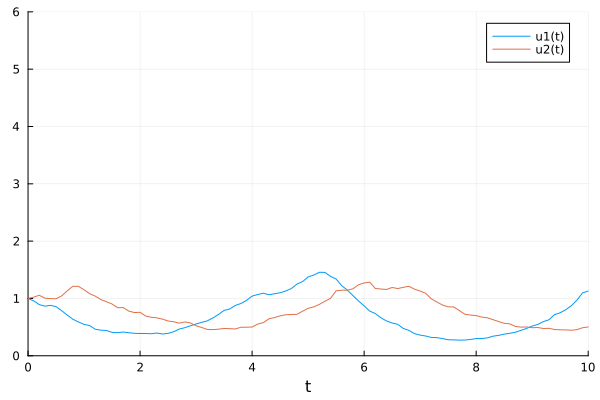

14.780528356035115

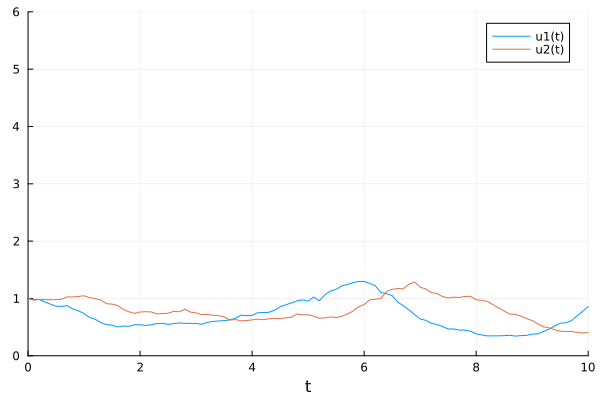

19.088013778641297

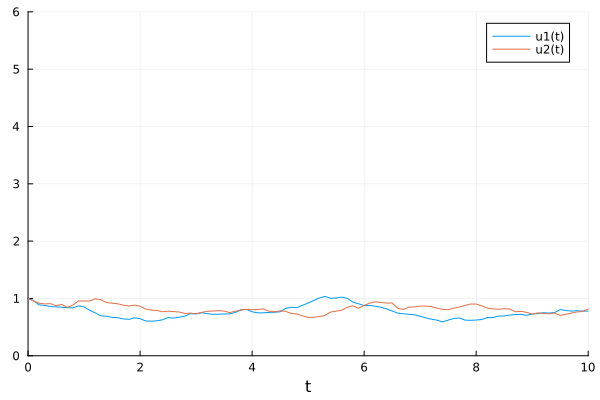

15.51722068996691

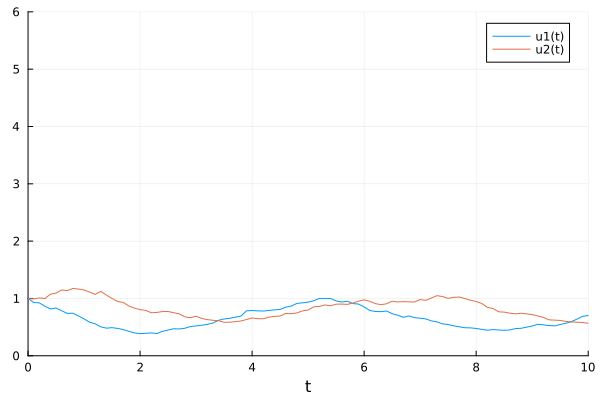

18.779680267774186

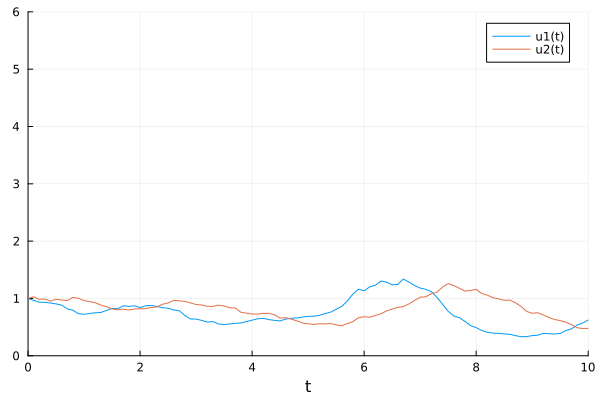

15.68856896953336

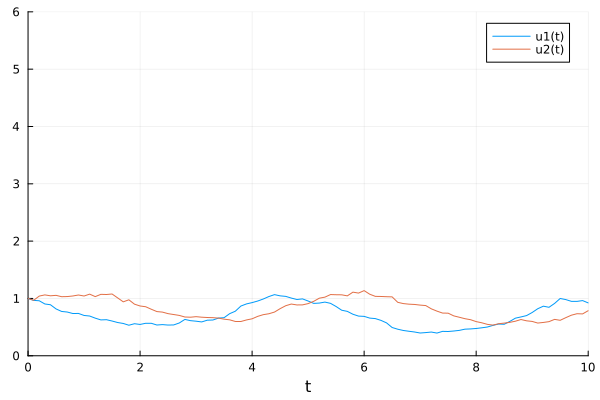

26.96815683088914

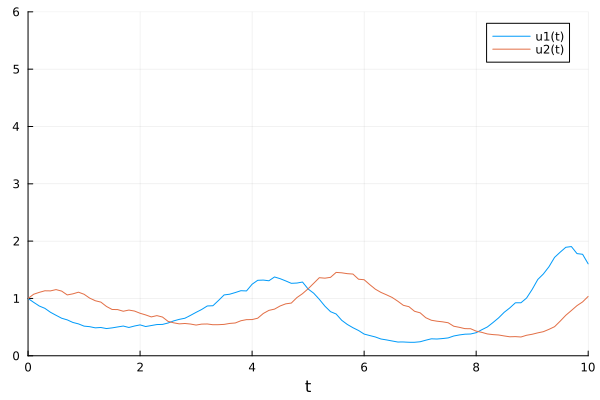

23.60720496113387

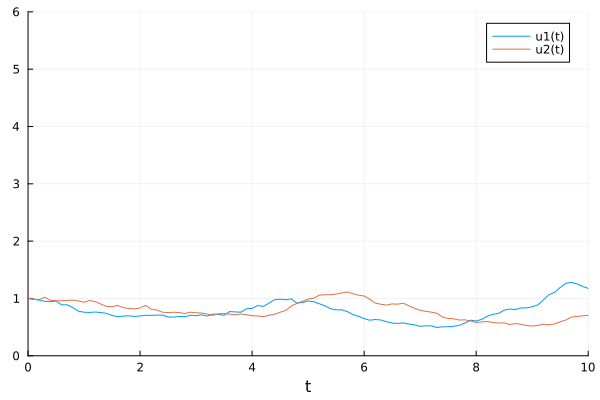

15.496454880897158

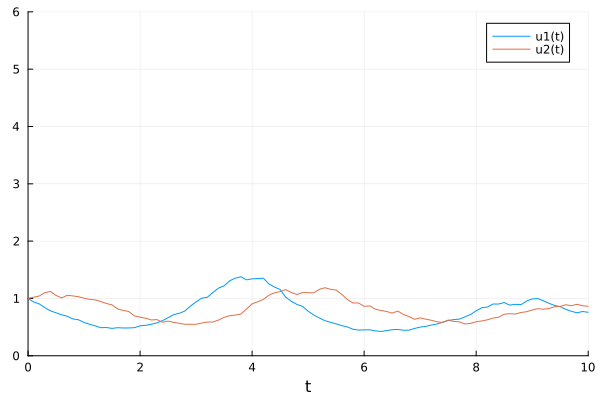

28.1290262317467

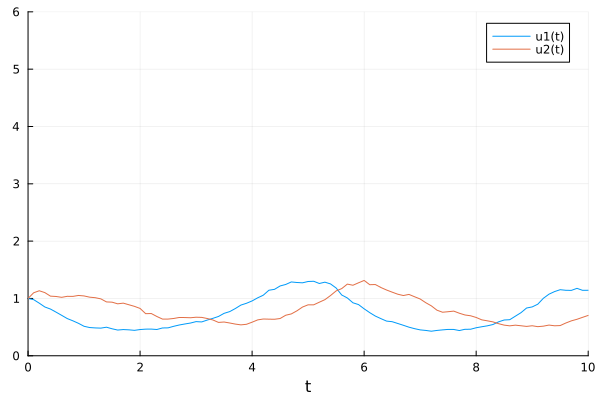

16.101951252596674

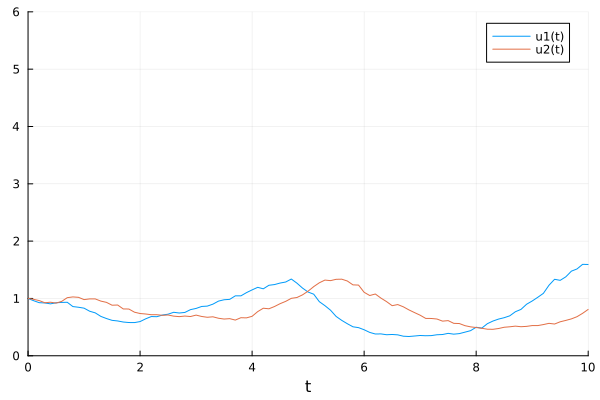

31.744207916208907

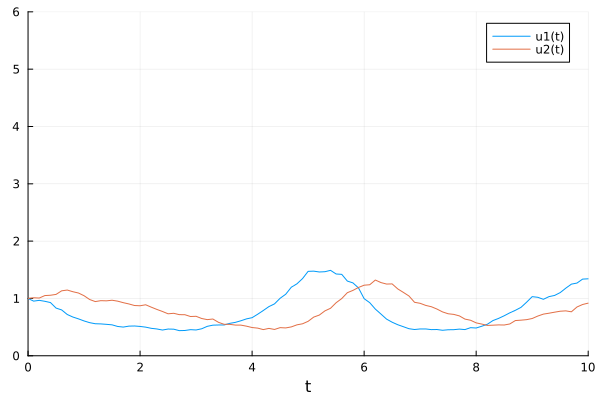

19.569381860508027

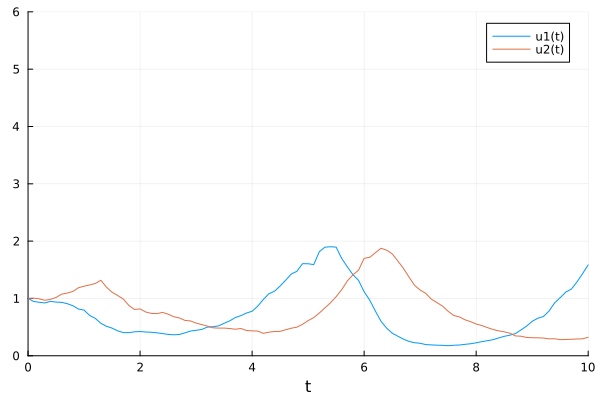

14.533317072311881

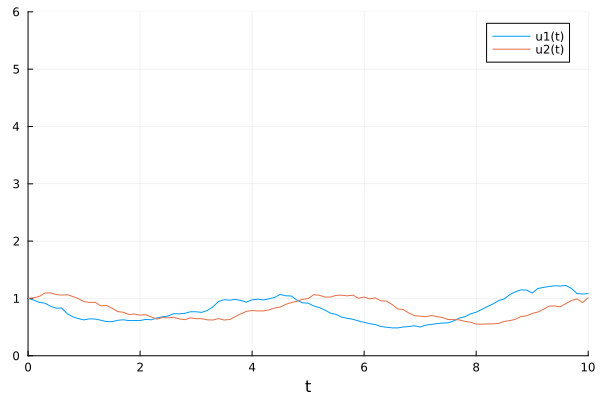

16.53215766667109

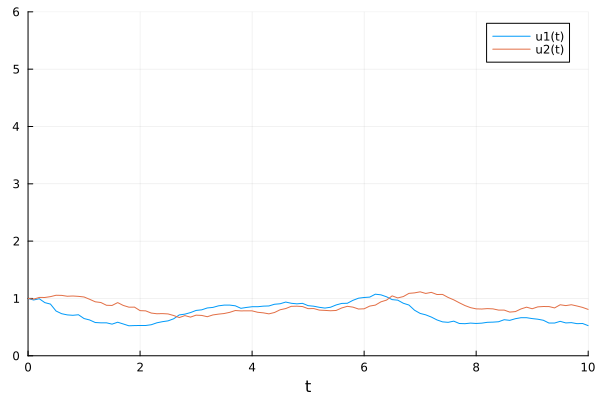

25.151029212705204

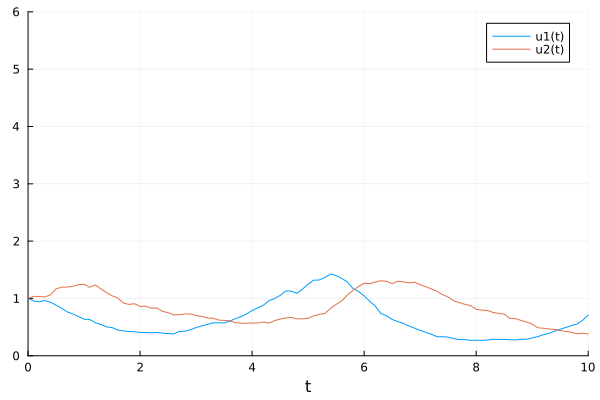

12.191991327023947

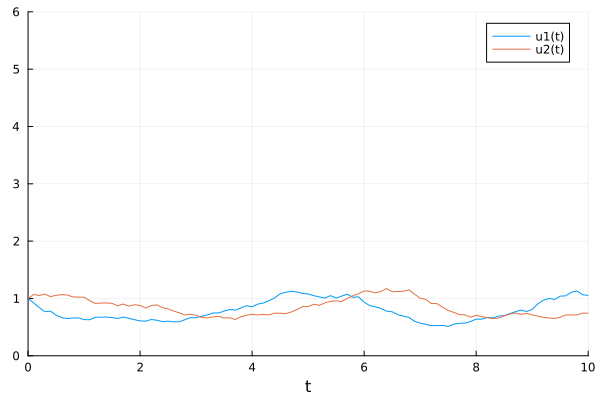

28.86126102912853

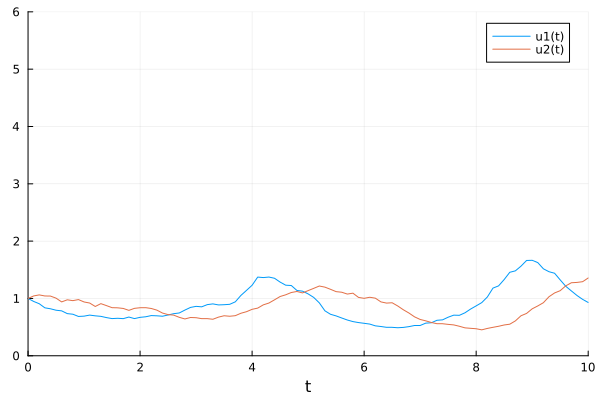

20.076906849362427

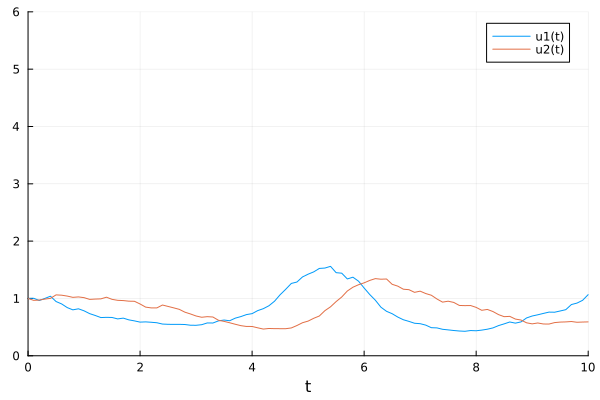

7.516554508610932

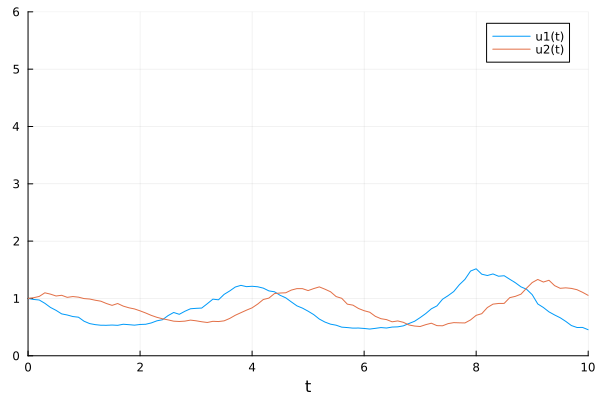

29.30349410259611

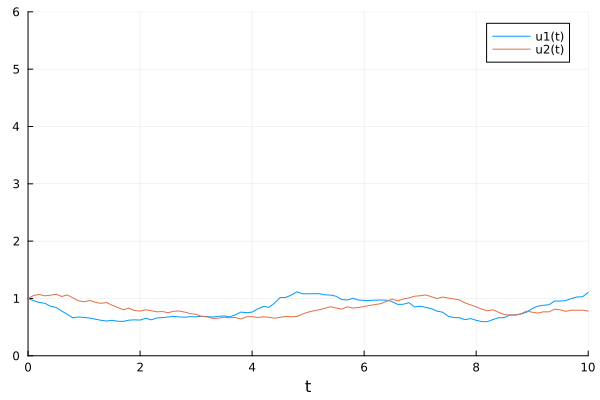

27.42638012281077

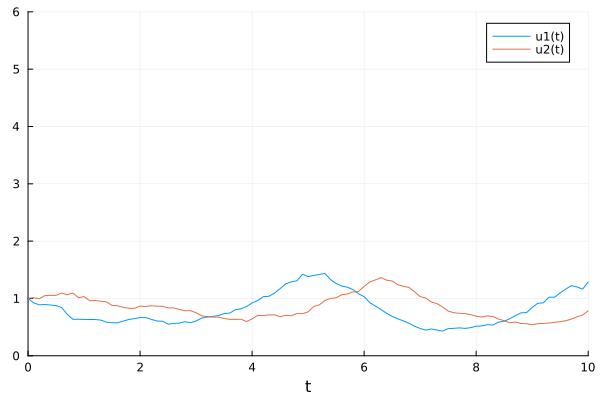

11.961546715418752

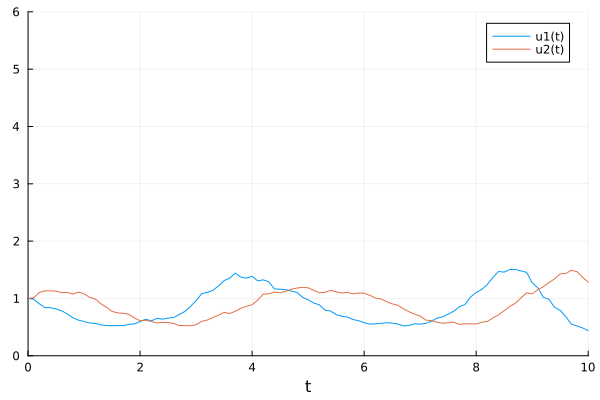

36.86408446122587

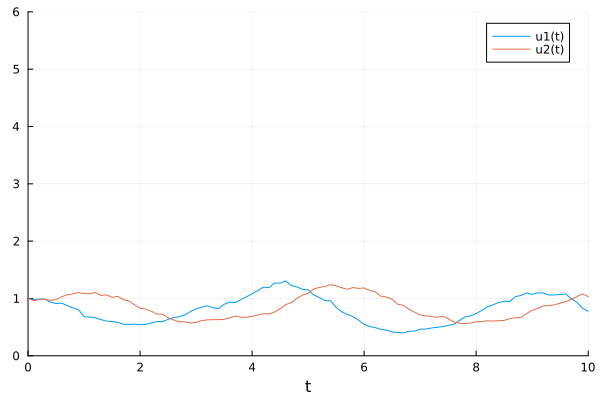

37.051926120769565

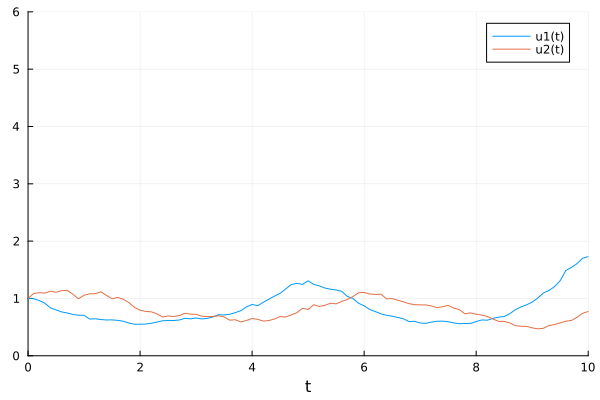

6.146294468653255

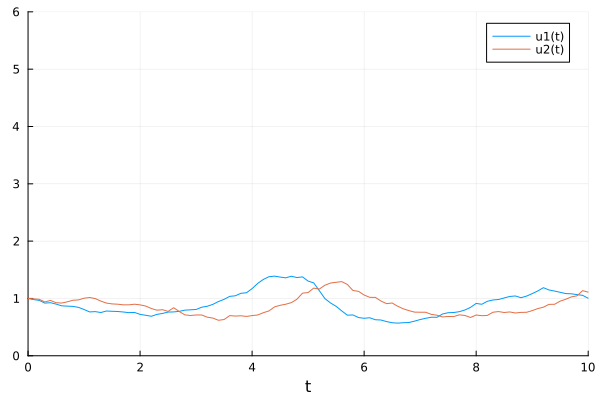

14.381830325113537

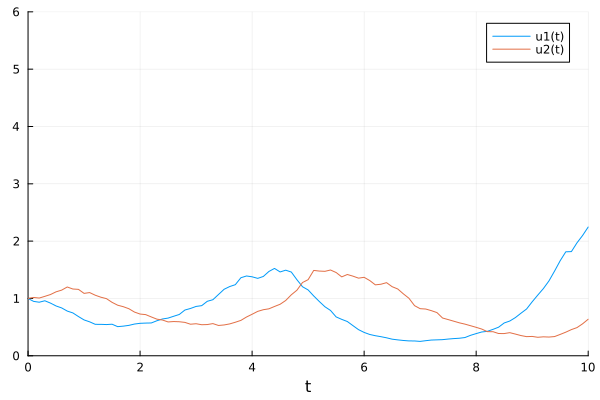

5.279123810385119

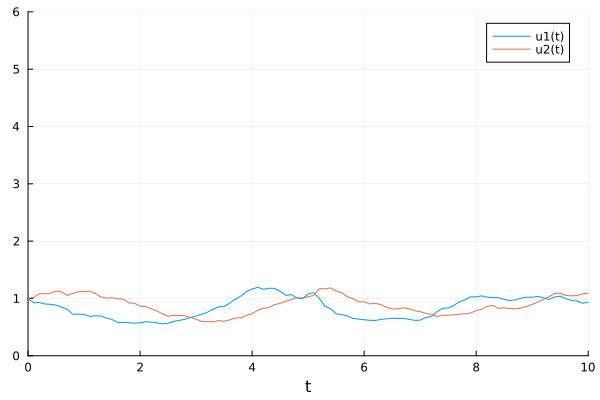

9.812498015004596

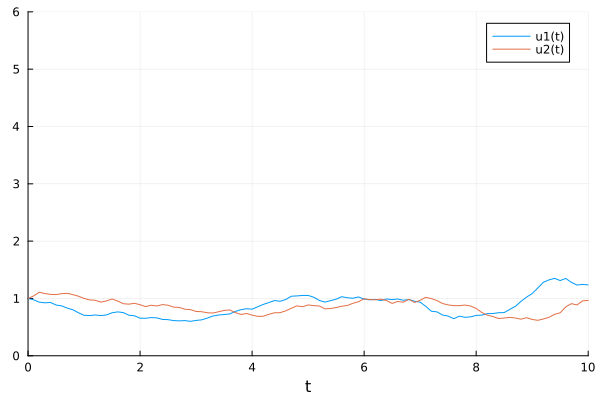

10.42942112934108

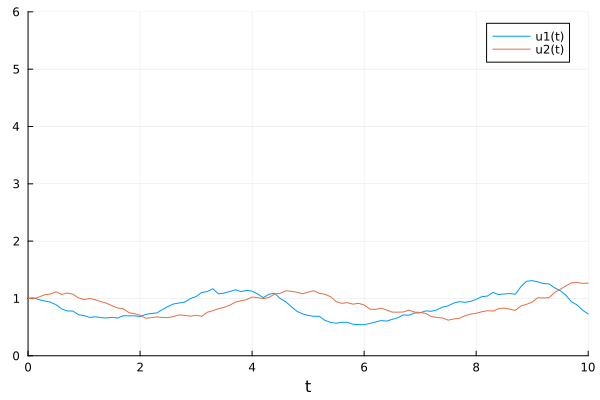

17.89104126415626

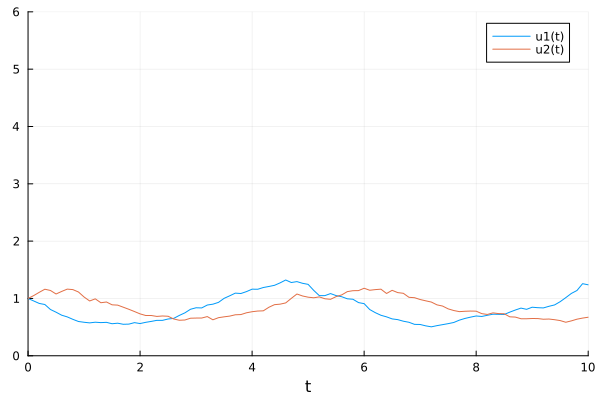

16.261022358662384

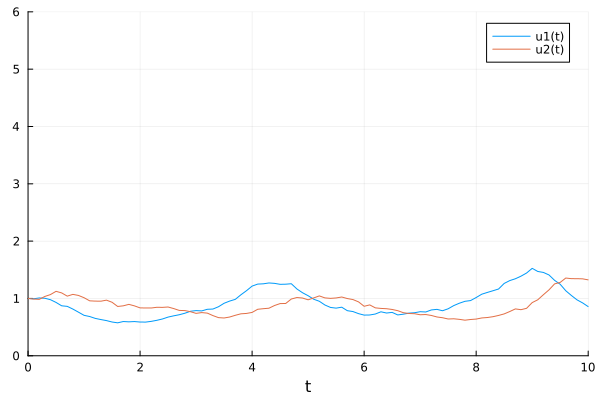

25.655094101178587

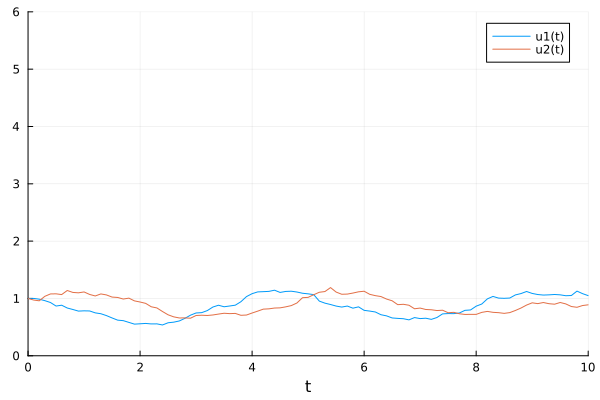

13.866264841681883

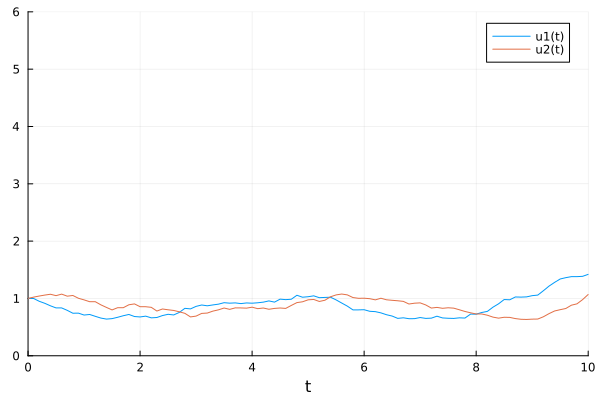

14.456125100608096

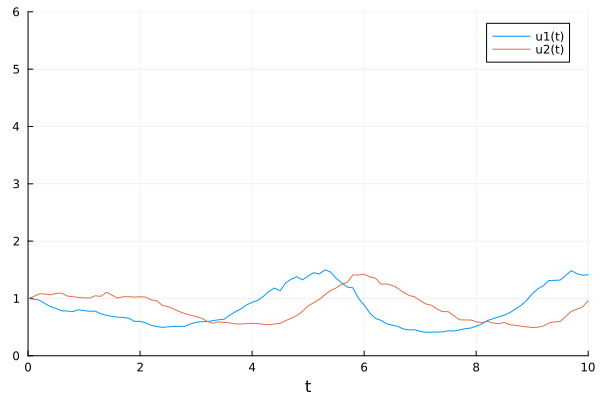

10.078949316263941

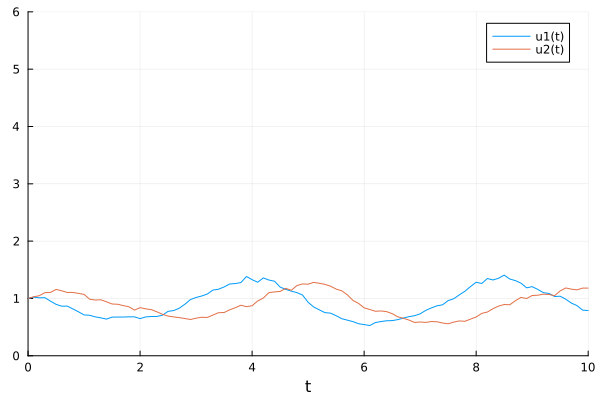

7.657737982443989

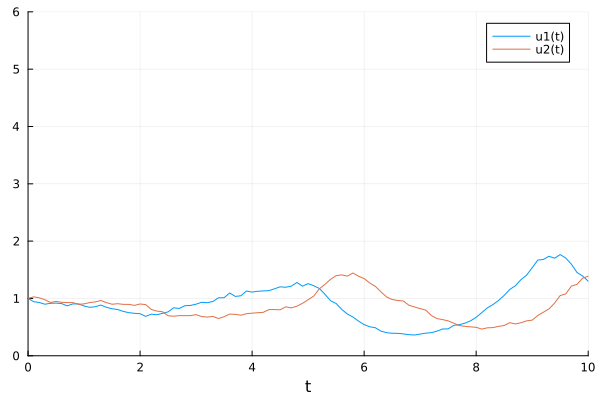

12.24043859133711

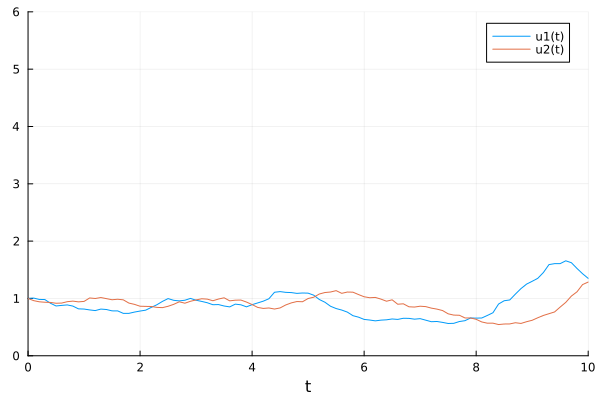

6.28481584260395

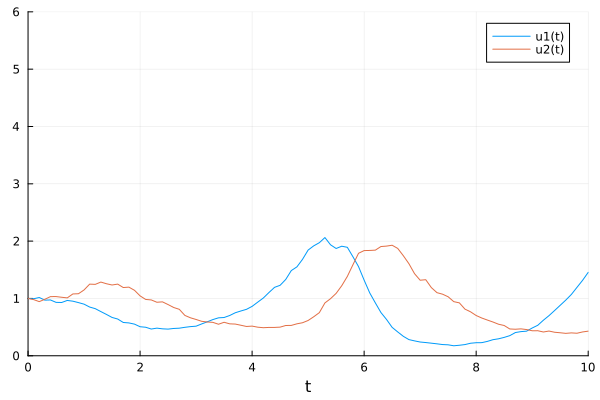

13.177977809140442

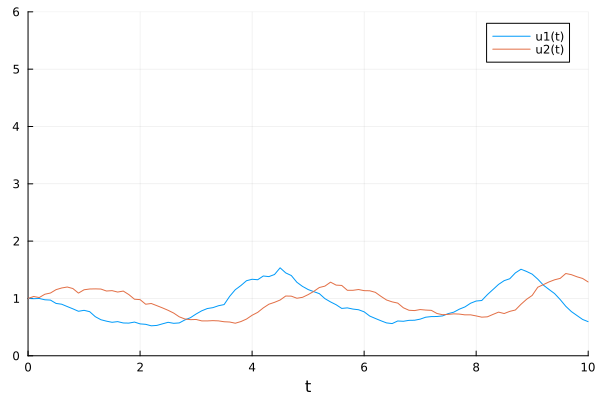

5.279123810385119

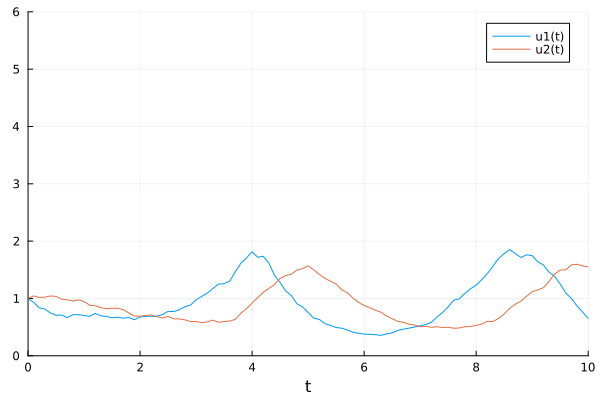

u: 4-element Vector{Float64}:
 1.771501878229736
 2.020918542942045
 0.9313055034265348
 1.0981170604843757

In [56]:
adtype = Optimization.AutoZygote()
optf = Optimization.OptimizationFunction((x, p) -> loss_sde(x), adtype)

optprob = Optimization.OptimizationProblem(optf, p)
result_sde = Optimization.solve(optprob, ADAM(0.1),
                                callback = callback, maxiters = 100)